## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "Base_old"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [ ]:
override = True
use_preds = False
save = True
show = True

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


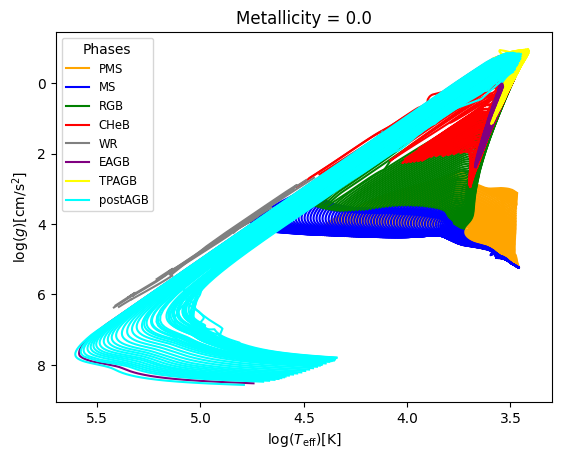

In [5]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
1165292,10.3,3.425746,-0.551440,5.0,0.50,0.602856,2.384899
1165293,10.3,3.426469,-0.560350,5.0,0.50,0.598549,2.387797
1165294,10.3,3.427744,-0.566057,5.0,0.50,0.594116,2.389036
1165295,10.3,3.429413,-0.569225,5.0,0.50,0.589648,2.388981


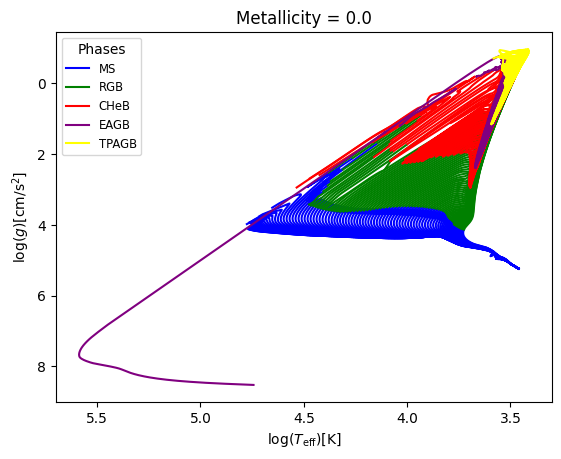

In [6]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3, 4, 5]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [7]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4794, Median : 8.6

log_Teff  : Range : 3.34 - 5.5871, Mean : 3.8475, Median : 3.6808

log_g  : Range : -1.14 - 8.6121, Mean : 2.1347, Median : 2.0681

Values in phase column : 0.0, 2.0, 3.0, 4.0, 5.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 298.5448, Mean : 7.3915, Median : 2.0304

log_R  : Range : -2.09 - 3.1298, Mean : 1.3543, Median : 1.4604



In [8]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344674699659814 - 5.587140896561816
Median value in train data for the log_Teff parameter: 3.680766424263915
Mean value in train data for the log_Teff parameter: 3.8476204023971157

Range in train data for the log_g parameter : -1.14489780699774 - 8.612101665912416
Median value in train data for the log_g parameter: 2.0703791486725853
Mean value in train data for the log_g parameter: 2.1352774698418227

Range in train data for the log_R parameter : -2.085171571669866 - 3.1297545143214007
Median value in train data for the log_R parameter: 1.4596584609420415
Mean value in train data for the log_R parameter: 1.3541629050846133

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344668191350628 - 5.583976960548153
Median value in test data for the log_Teff parameter: 3.680776435315607
Mean value in test data for the log_Teff parameter: 3.847160526699259

Range in test data for the log_g para

## Model training

### Linear regression

In [9]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.90340707004253
  RVE :  0.7524784165958145
  RMSE :  0.22441916117022886
  MAE :  0.19518129482730628
  MedAE :  0.20398065806992993
  CORR :  0.8675307023713842
  MAX_ER :  0.8246334679597114
  Percentiles : 
    75th percentile :  0.2870180342574161
    90th percentile :  0.3376799380233917
    95th percentile :  0.35771362803411694
    99th percentile :  0.3849474455034835

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.709363146124065
  RVE :  0.7490184240480199
  RMSE :  0.18248809061355153
  MAE :  0.1517109618351751
  MedAE :  0.14053287465413078
  CORR :  0.8655260260210929
  MAX_ER :  0.5841503382754119
  Percentiles : 
    75th percentile :  0.23121269607787398
    90th percentile :  0.29403413462455025
    95th percentile :  0.32113857909981647
    99th percentile 

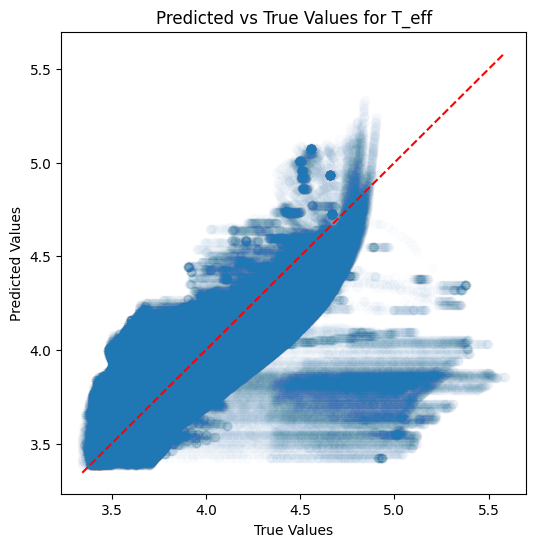

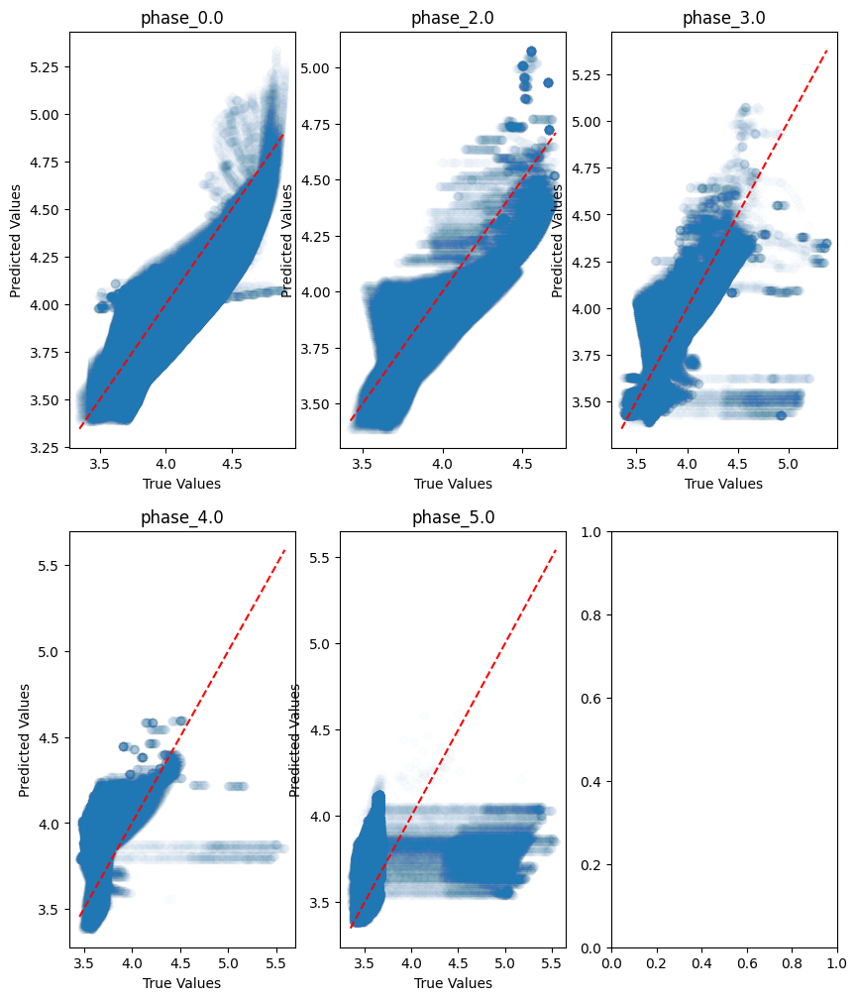

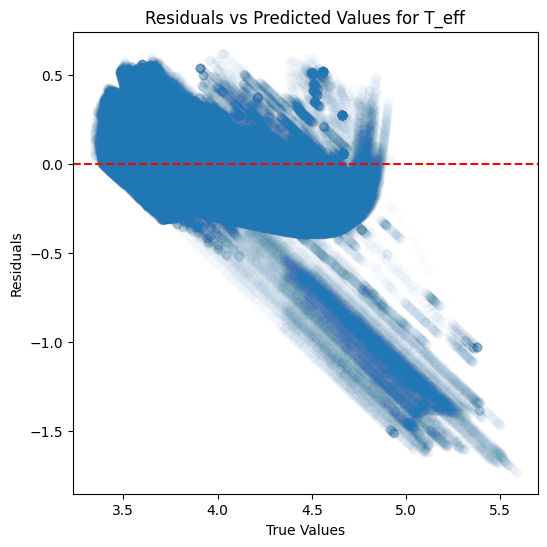

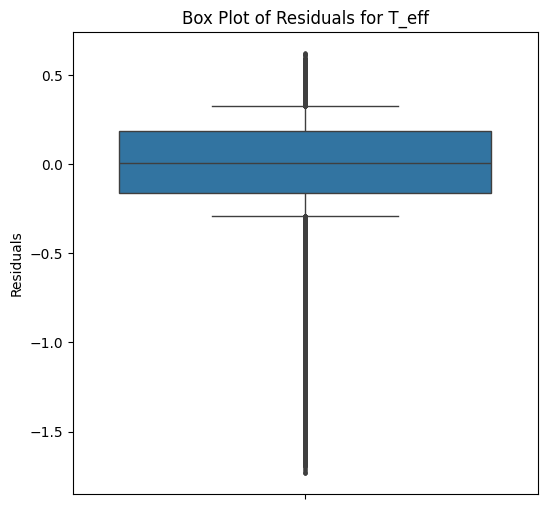

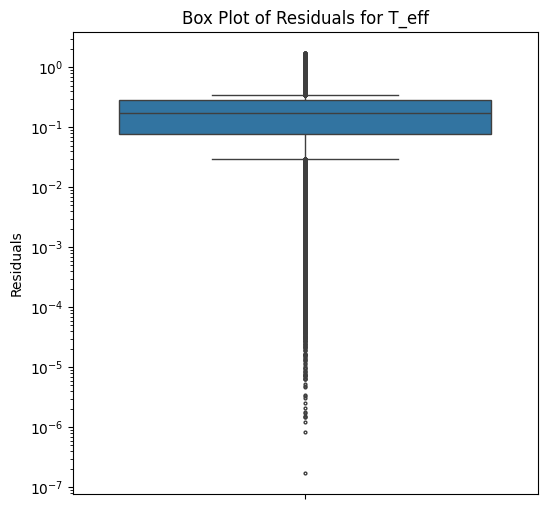

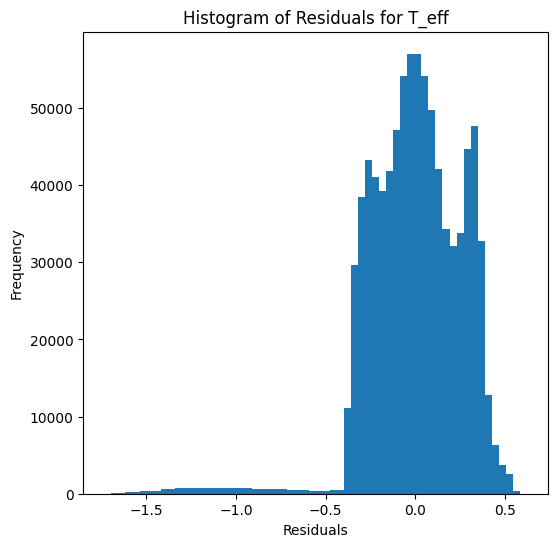

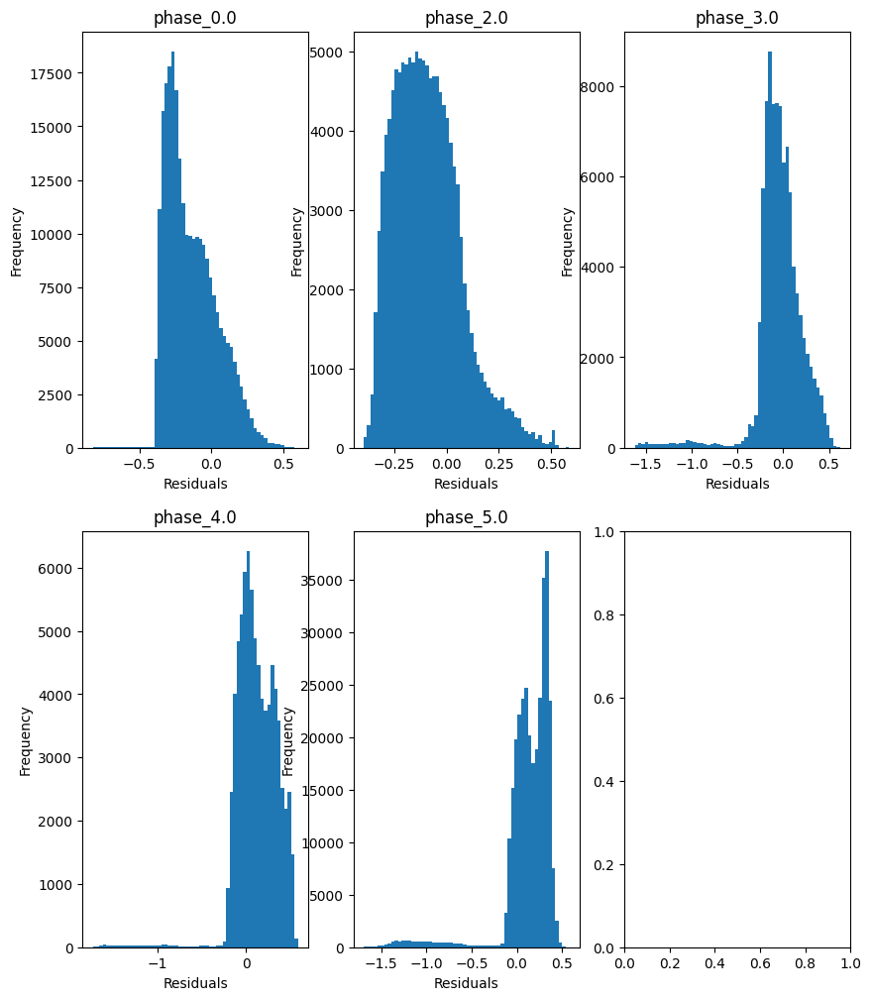

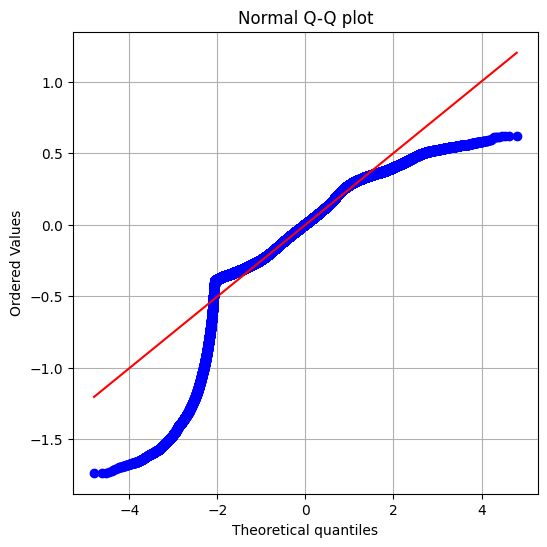

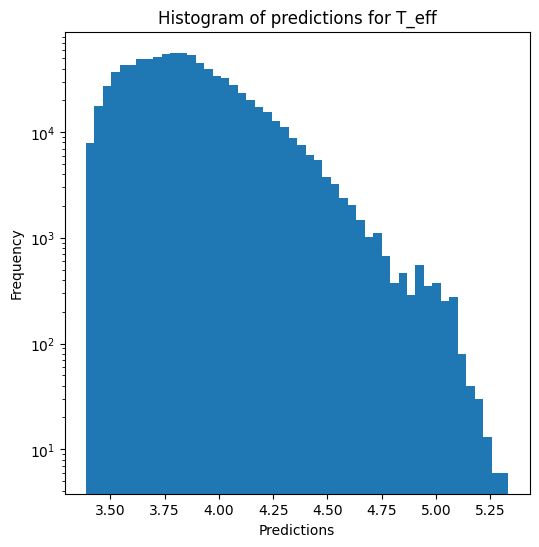

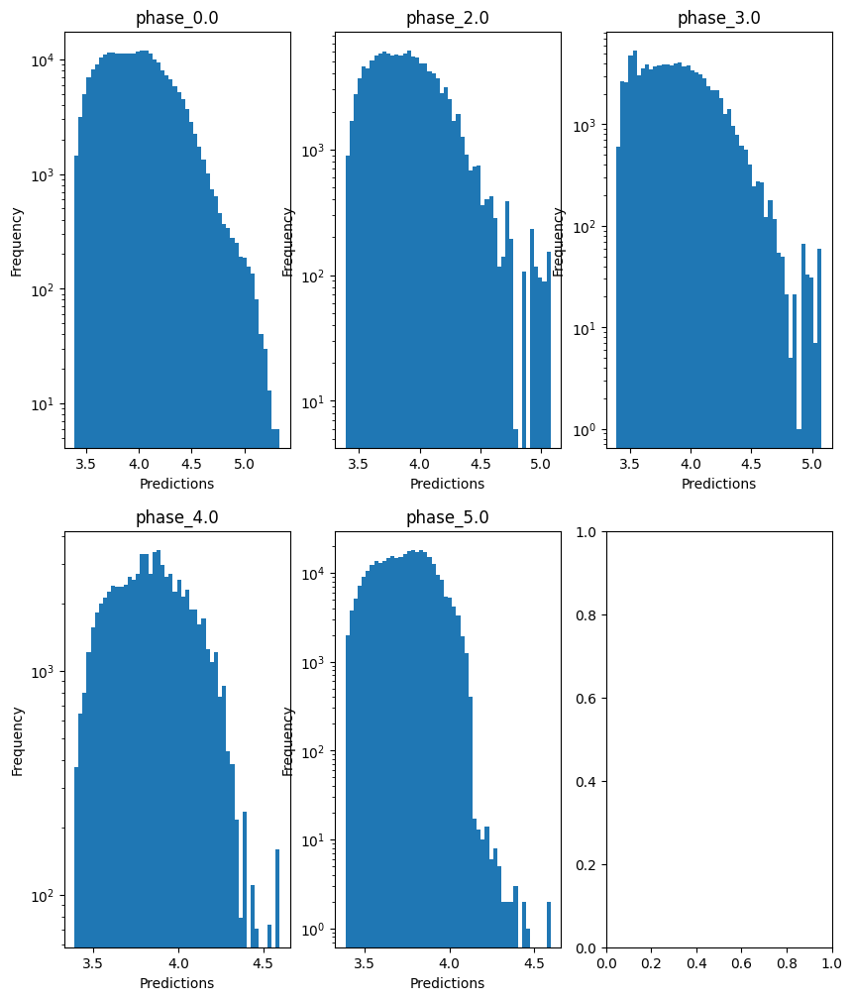

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -1.4526732909733746
  RMSE :  2.1548263169666386
  MAE :  1.971782315620739
  MedAE :  1.9060491662864034
  CORR :  -0.05774202938030873
  MAX_ER :  4.293782559436771
  Percentiles : 
    75th percentile :  2.585013177686313
    90th percentile :  3.2266973494879774
    95th percentile :  3.494260137778713
    99th percentile :  3.8671284890662623

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.10726034741868984
  RMSE :  1.0420904416398185
  MAE :  0.8500566069401131
  MedAE :  0.7260035851280877
  CORR :  0.4224671492292283
  MAX_ER :  3.2923654558317397
  Percentiles : 
    75th percentile :  1.2208551366258789
    90th percentile :  1.706235034635397
    95th percentile :  2.0148519146433674
    99th percentile :  2.5689061587043254

log_g results for the phase ca

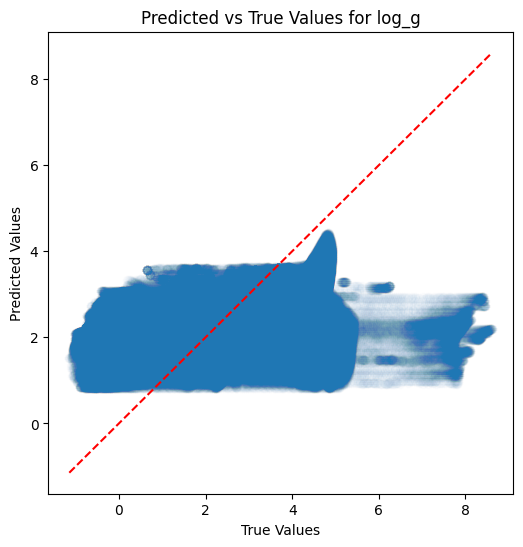

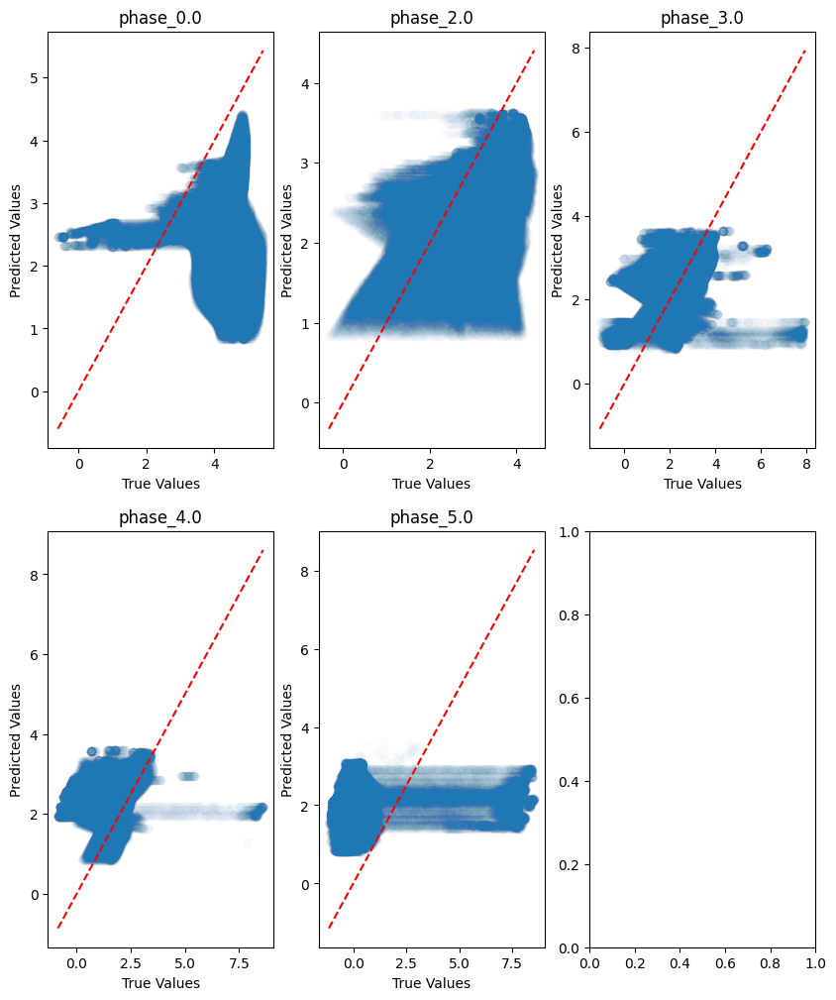

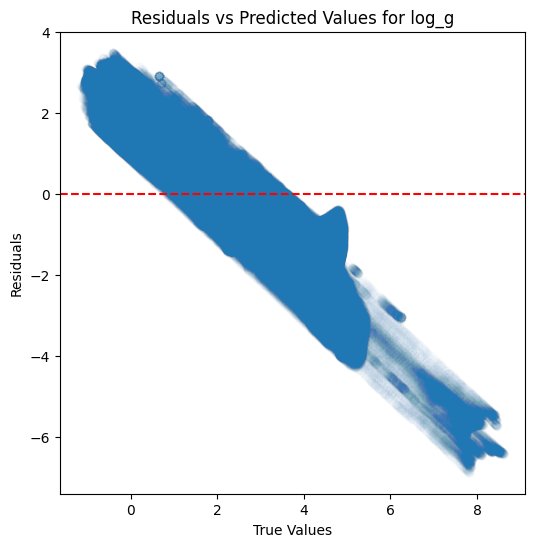

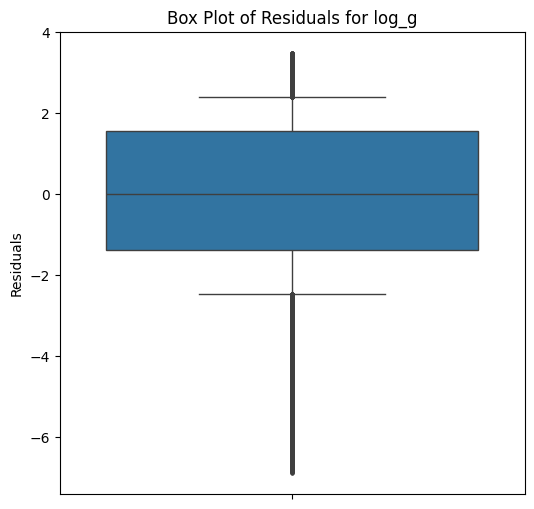

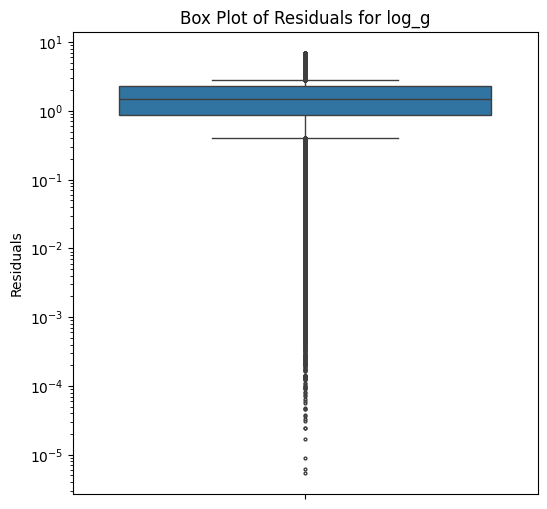

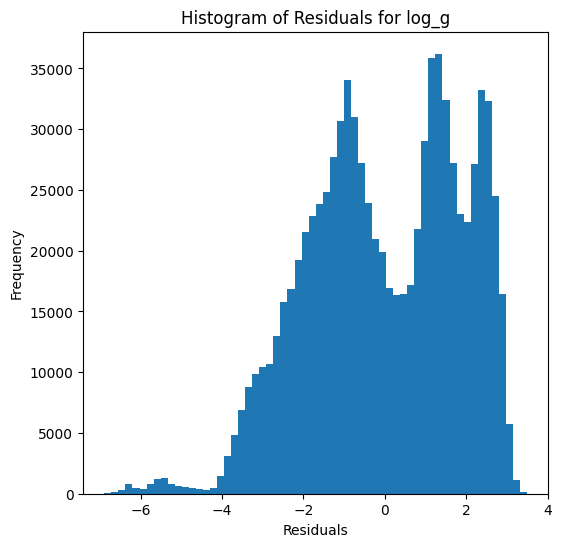

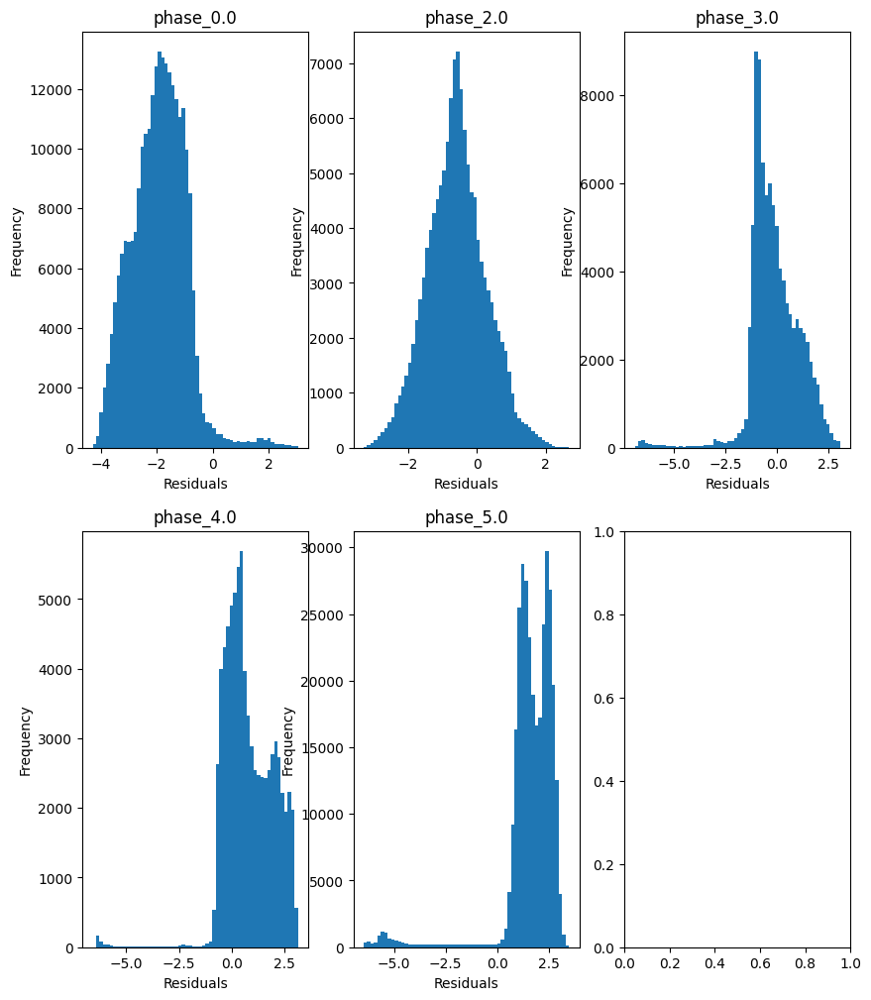

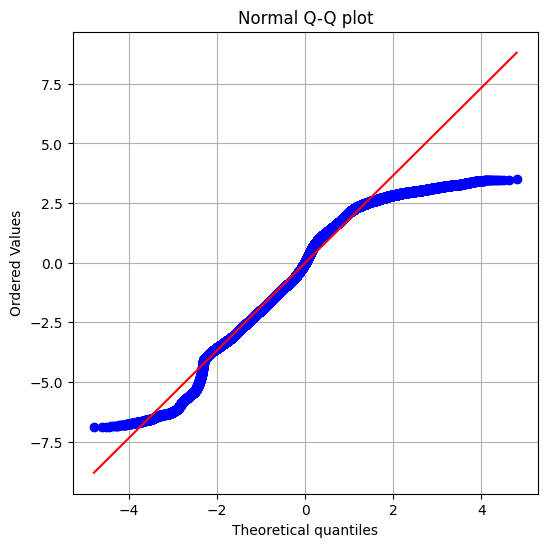

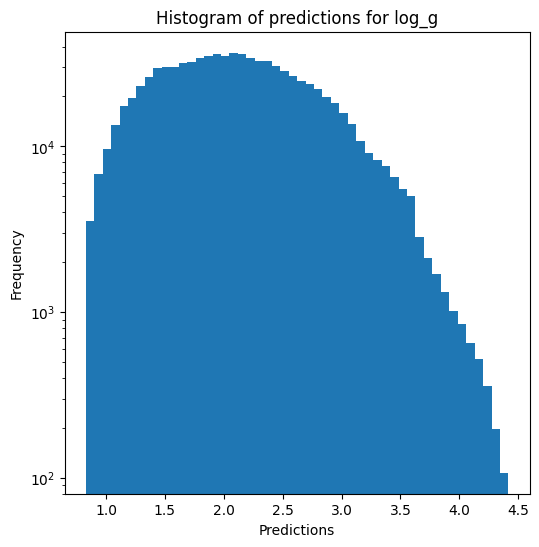

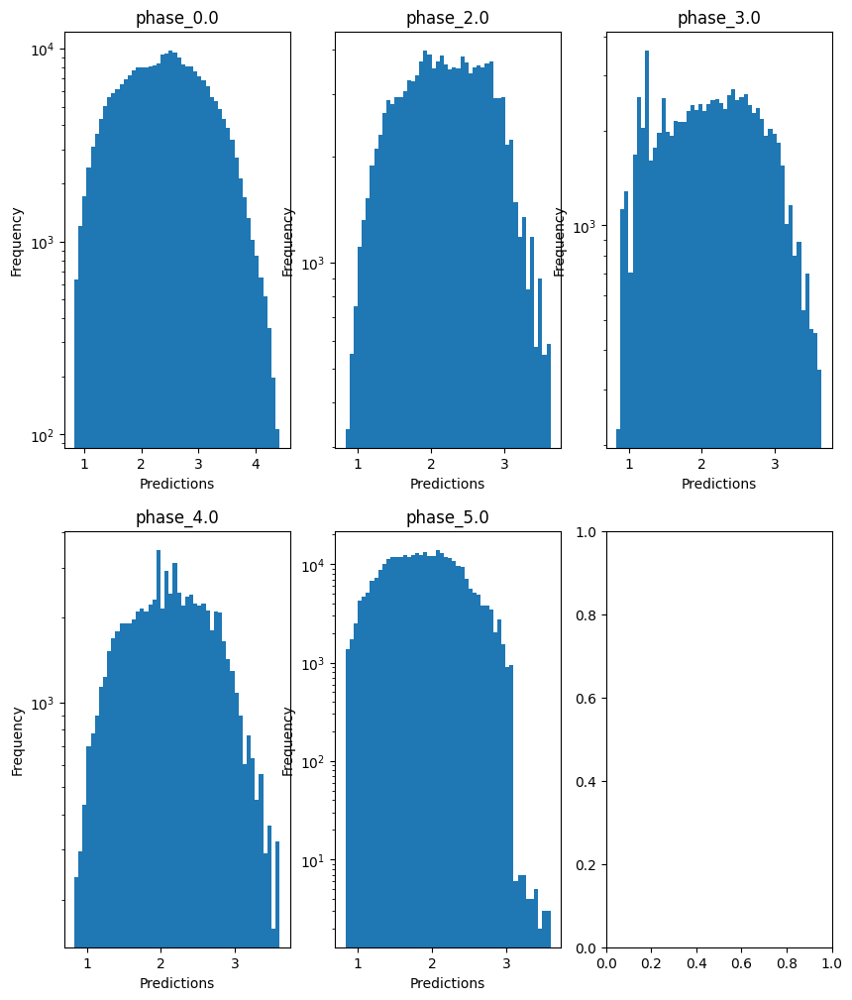

no negative values

radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.006346732316566572
  RMSE :  1.1809684699094047
  MAE :  1.065674055734514
  MedAE :  1.0284962617030426
  CORR :  0.1934560078913586
  MAX_ER :  2.543578474149058
  Percentiles : 
    75th percentile :  1.393437191164882
    90th percentile :  1.7727942666169498
    95th percentile :  1.997635325923596
    99th percentile :  2.267099558108158

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.19020723956199515
  RMSE :  0.4966837655943786
  MAE :  0.3952531743126593
  MedAE :  0.3315237979070087
  CORR :  0.43649163960123344
  MAX_ER :  1.573300186965094
  Percentiles : 
    75th percentile :  0.5789455431154611
    90th percentile :  0.8300054516344821
    95th percentile :  0.9861304130231144
    99th percentile :  1.2419593564706768

radius results for the phase c

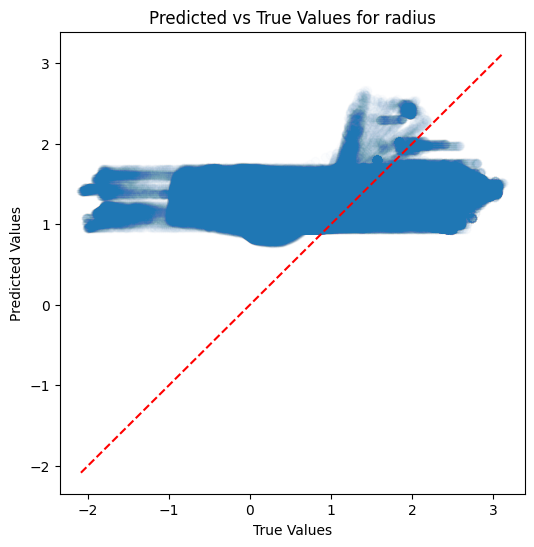

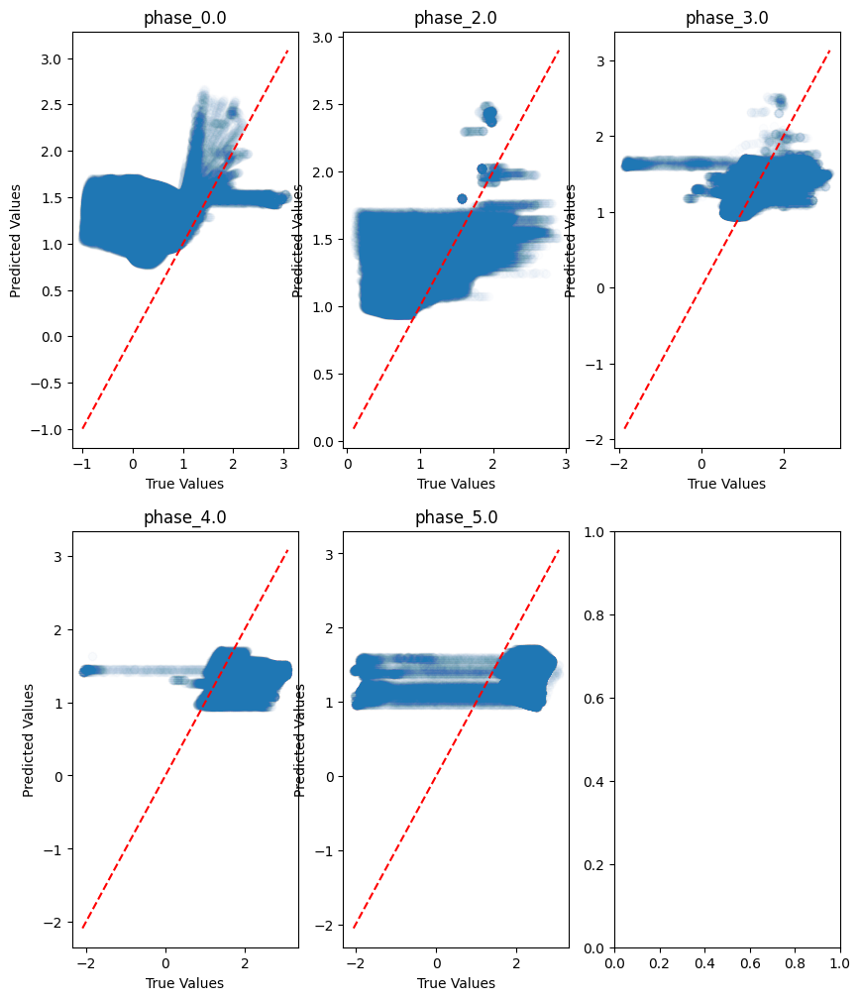

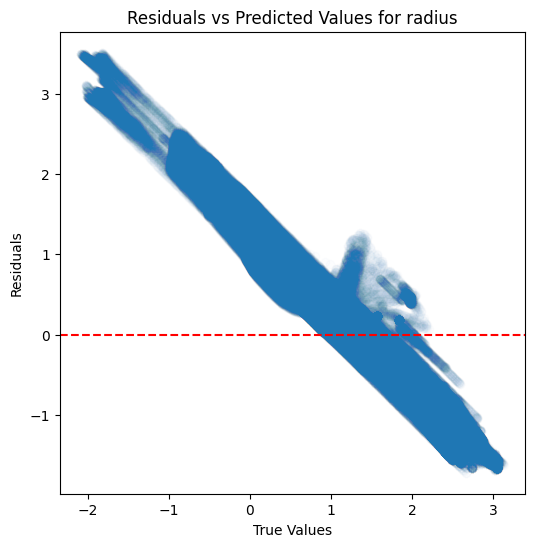

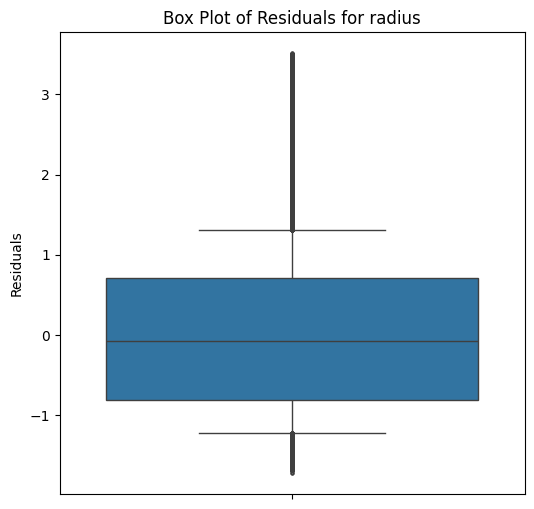

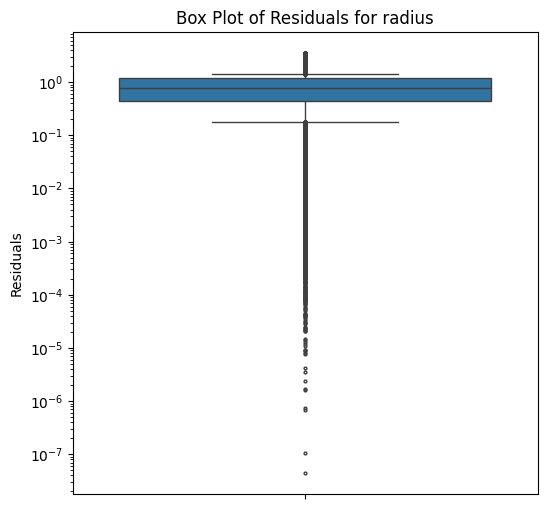

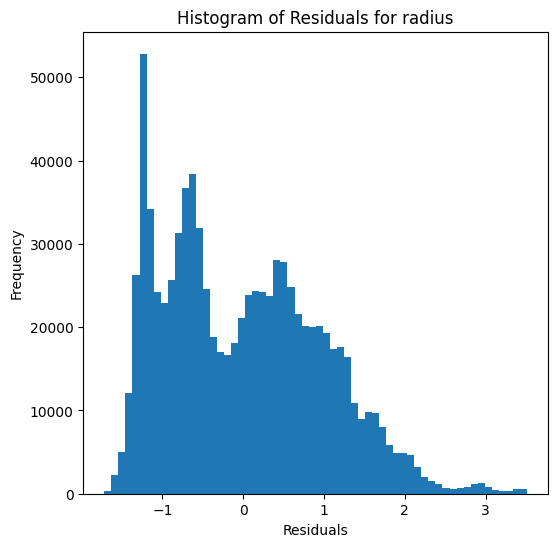

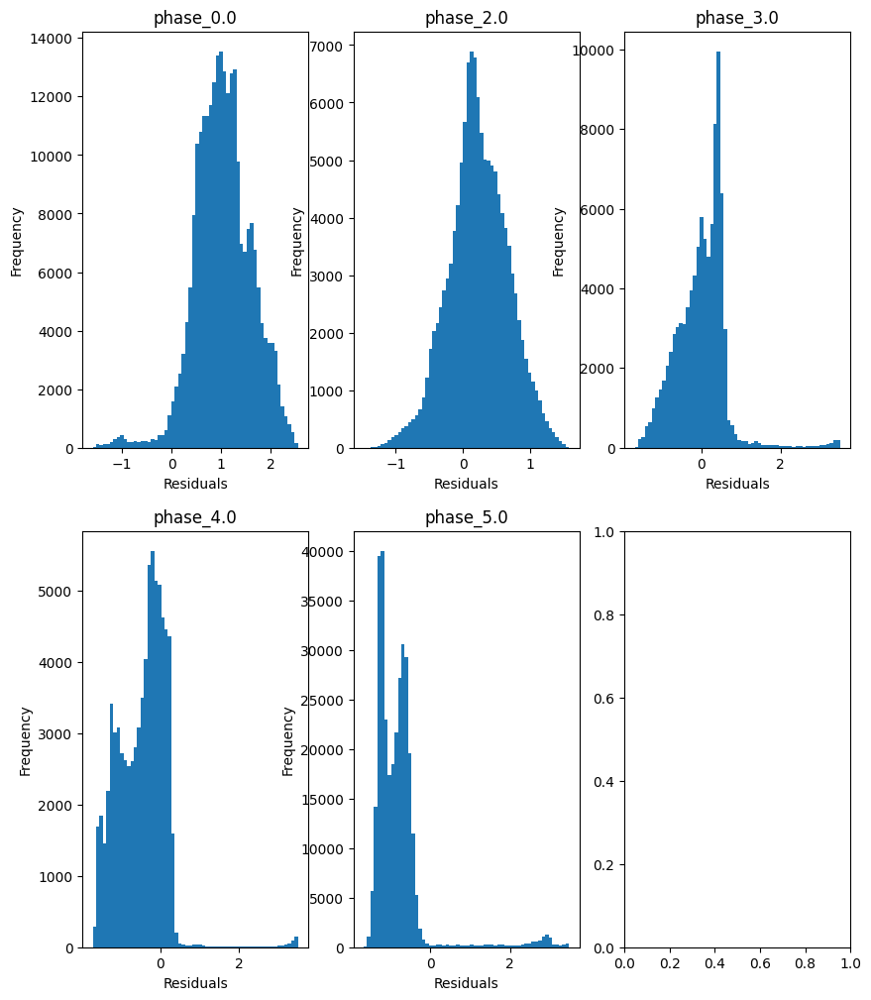

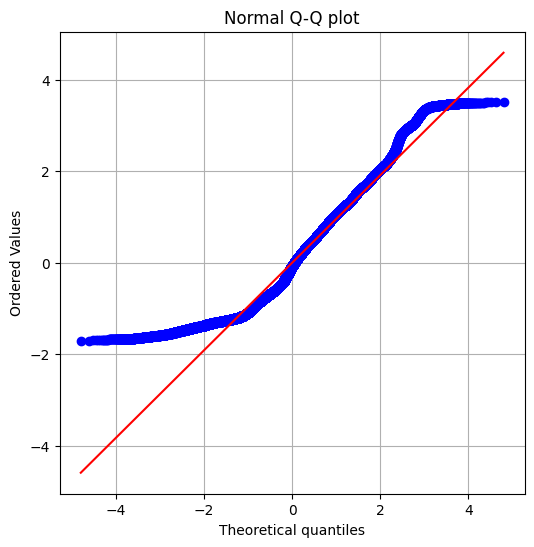

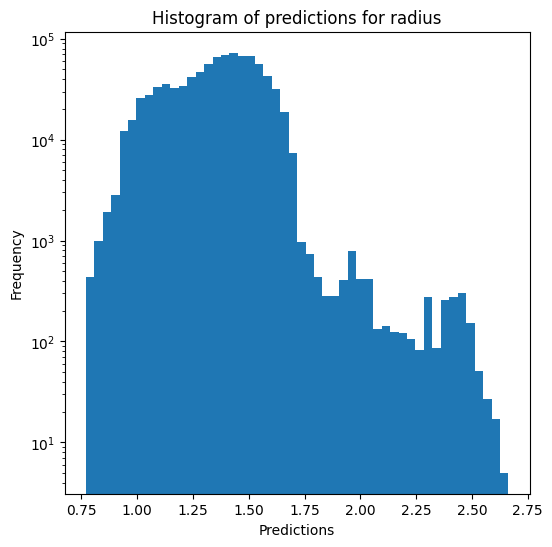

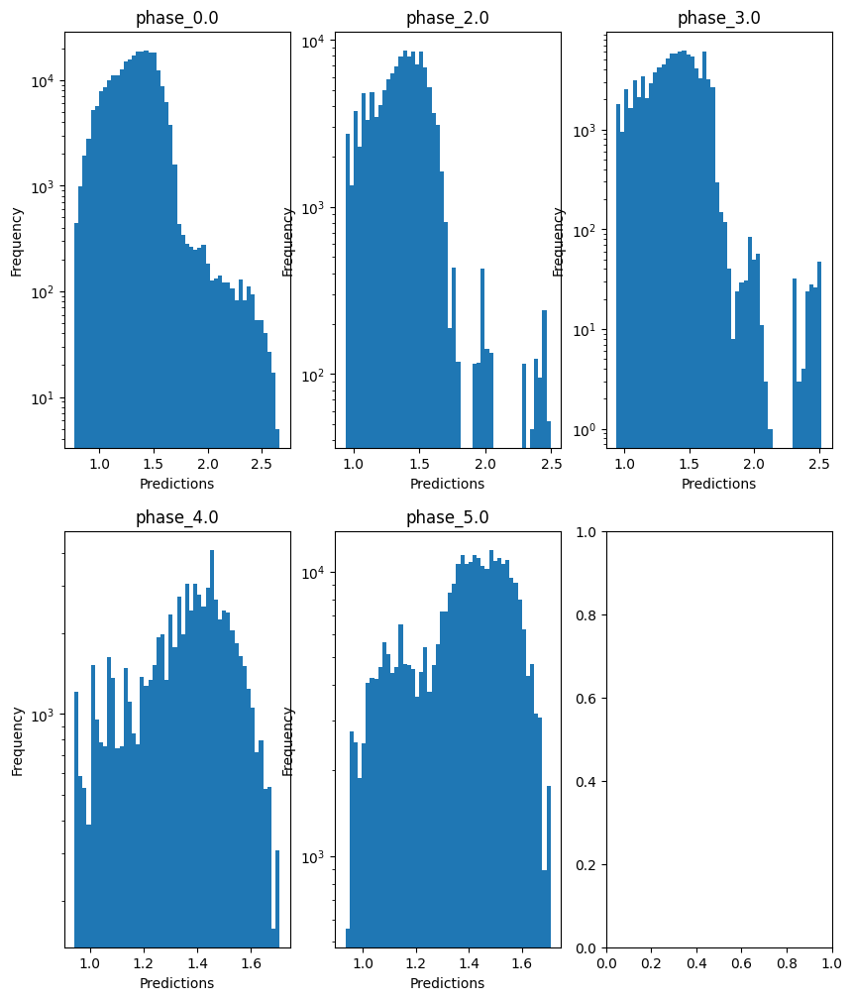

Saving results...


In [ ]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show) # override=True, use_preds=False

### Decision tree

In [11]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.90340707004253
  RVE :  0.717182104318727
  RMSE :  0.20220730707837473
  MAE :  0.08493263487276832
  MedAE :  0.0015971450701659506
  CORR :  0.889103310899466
  MAX_ER :  1.7534146969137923
  Percentiles : 
    75th percentile :  0.0062594457178164475
    90th percentile :  0.40789000050970803
    95th percentile :  0.554666129963753
    99th percentile :  0.6810171020564718

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.709363146124065
  RVE :  0.9058985726356169
  RMSE :  0.09839428847060039
  MAE :  0.038988445964786955
  MedAE :  0.003433937741534887
  CORR :  0.9549414285399469
  MAX_ER :  0.864869785313644
  Percentiles : 
    75th percentile :  0.02165671032885097
    90th percentile :  0.13409230705892003
    95th percentile :  0.2038198948159376
    99th percenti

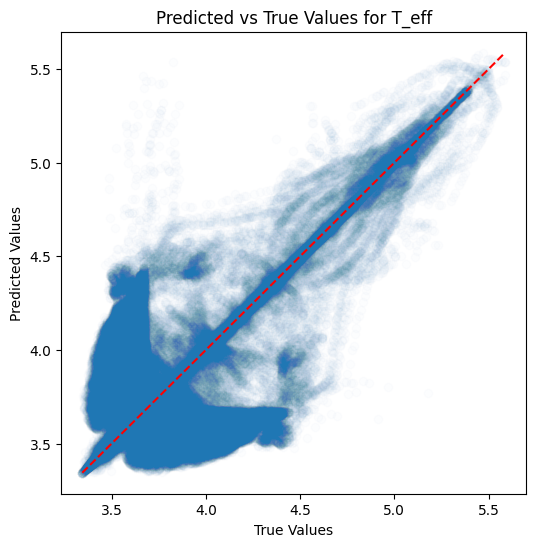

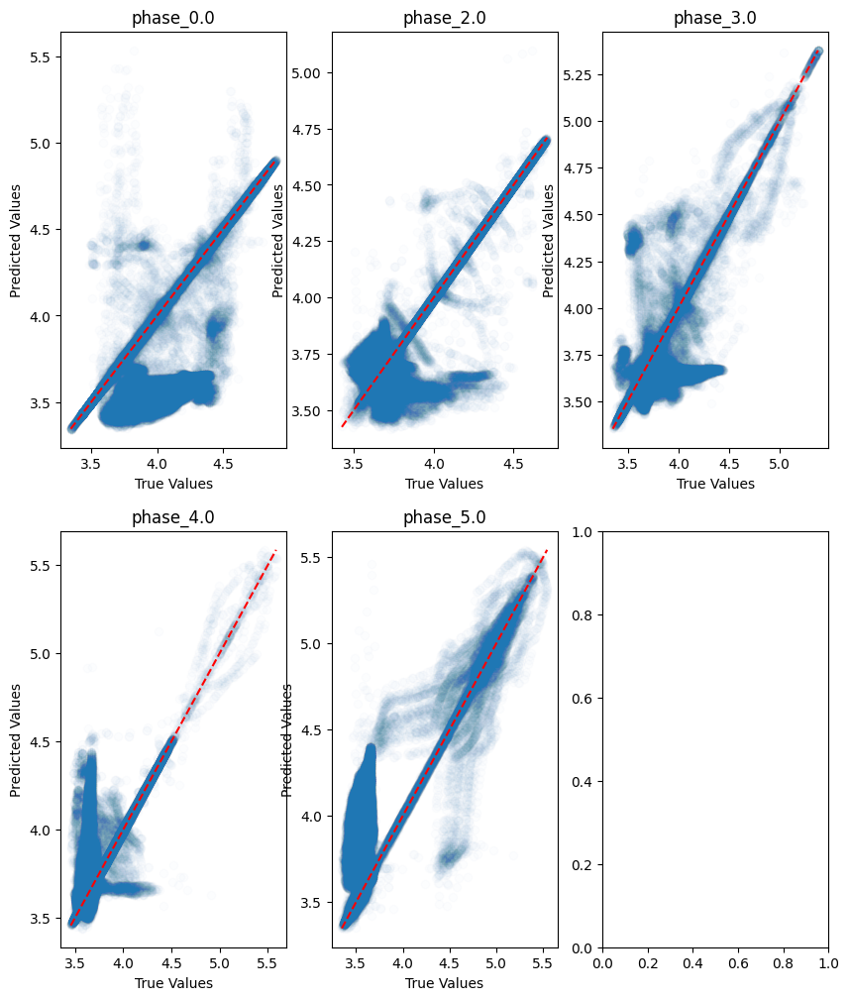

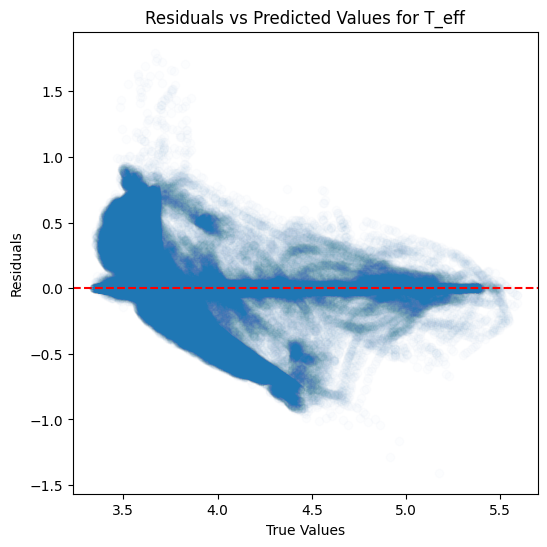

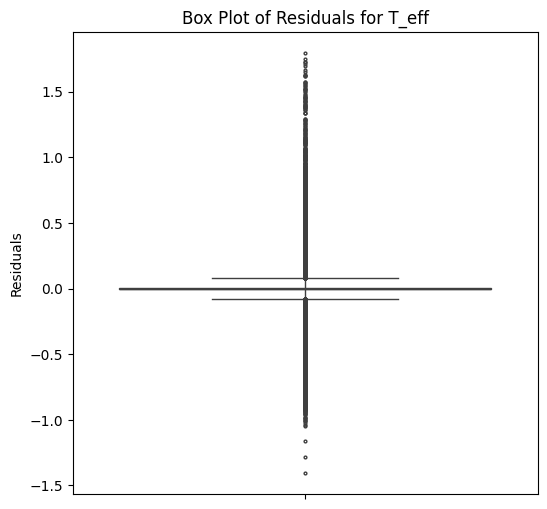

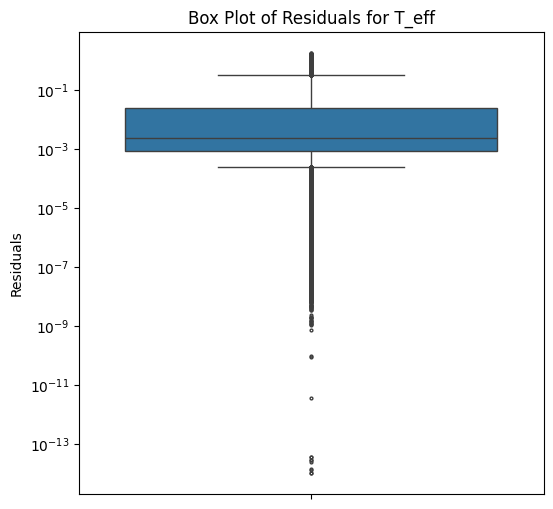

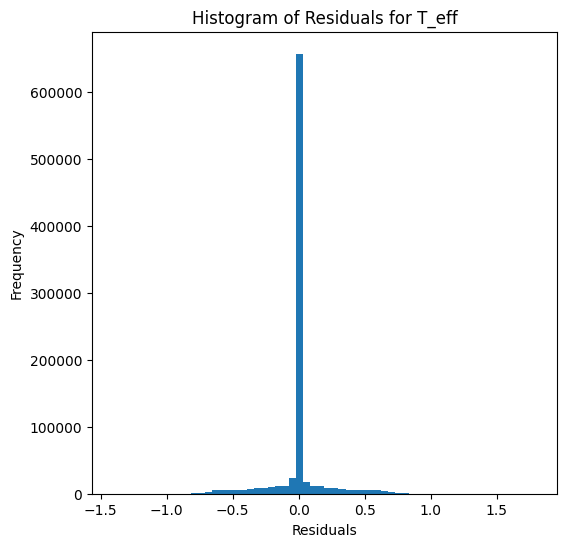

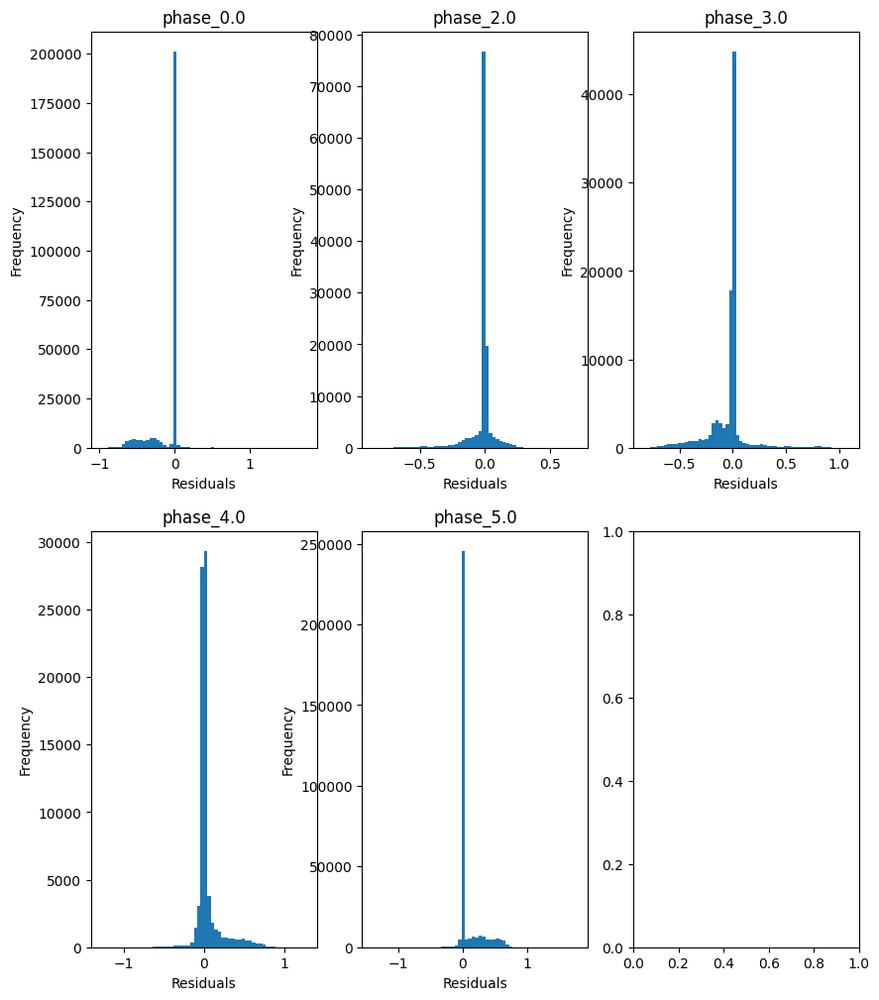

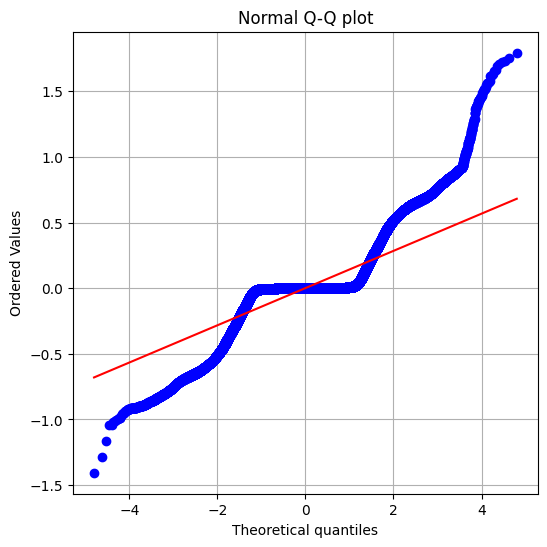

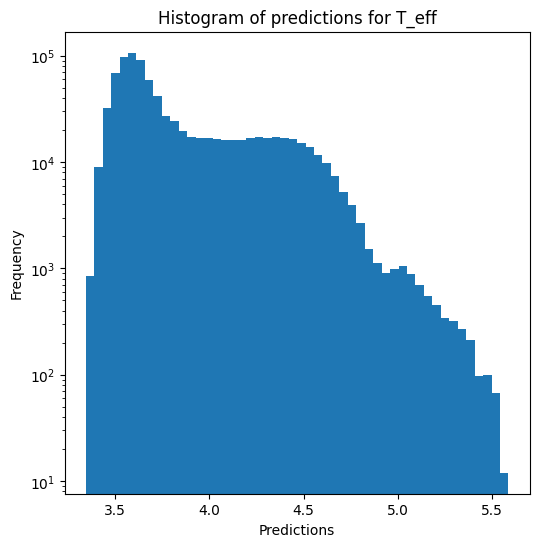

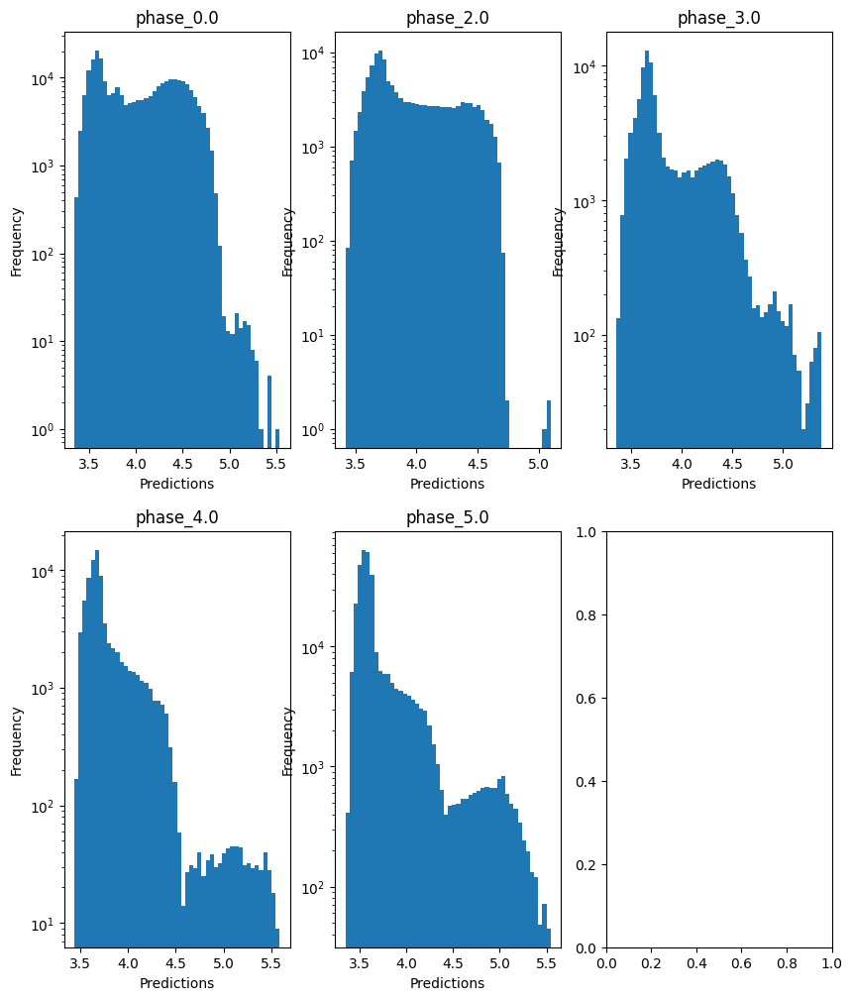


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -6.857174563856478
  RMSE :  1.9312844181530644
  MAE :  0.8430313633278537
  MedAE :  0.005339822469097477
  CORR :  0.3171702618360193
  MAX_ER :  5.667562006504969
  Percentiles : 
    75th percentile :  0.022938413080373254
    90th percentile :  4.415863107834505
    95th percentile :  4.866167857505806
    99th percentile :  5.219446495969802

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  -0.49847119310867294
  RMSE :  1.126278093401855
  MAE :  0.5152000101820668
  MedAE :  0.016532410169317835
  CORR :  0.385191499326966
  MAX_ER :  4.563059108881401
  Percentiles : 
    75th percentile :  0.3757483801296504
    90th percentile :  2.2643300965914133
    95th percentile :  3.0668212329020834
    99th percentile :  3.8015417746983964

log_g results for the phase category with a val

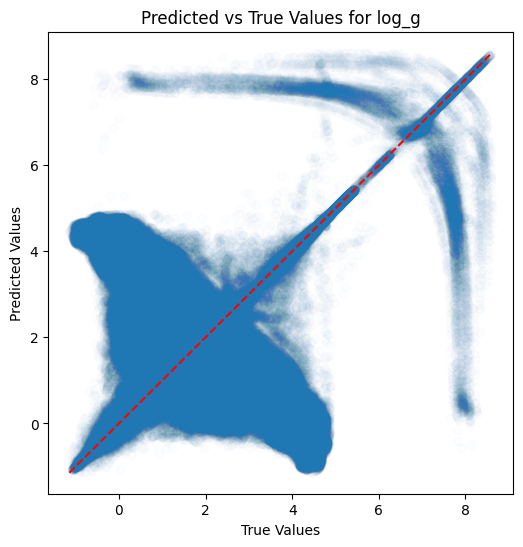

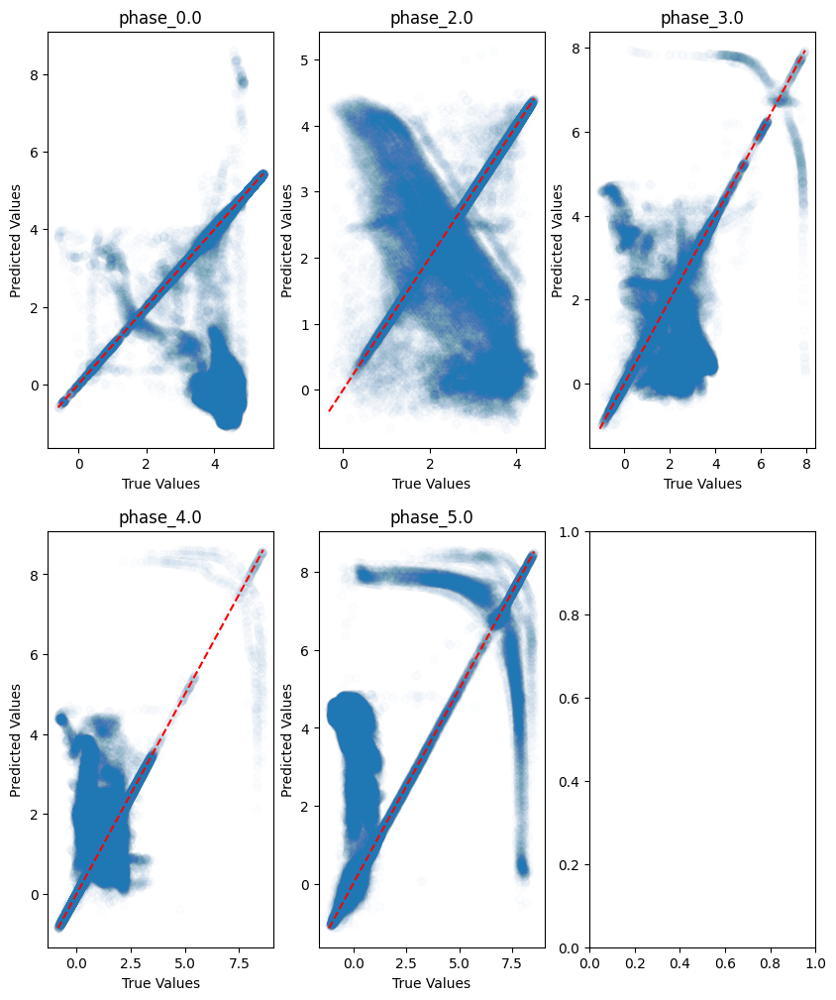

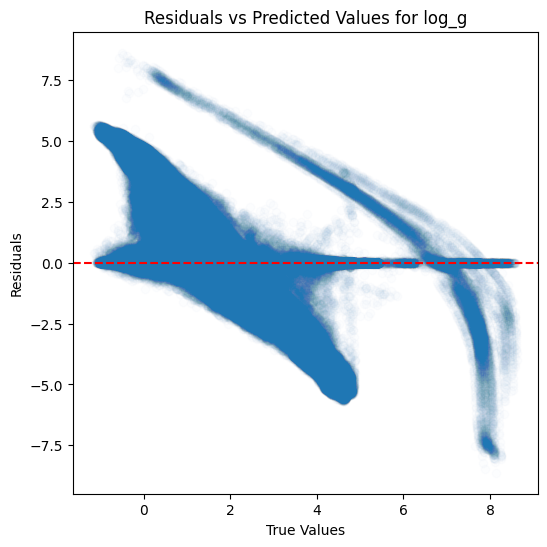

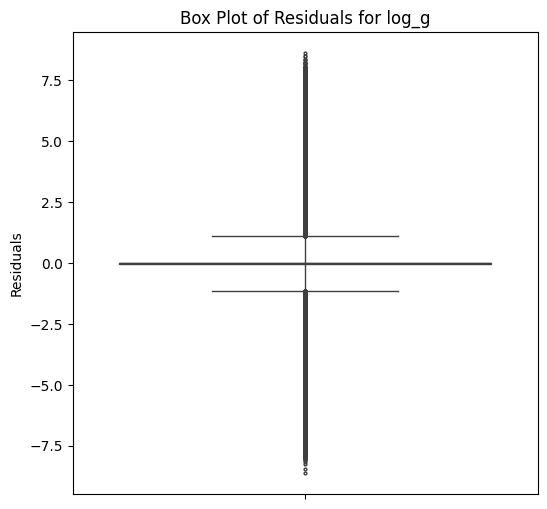

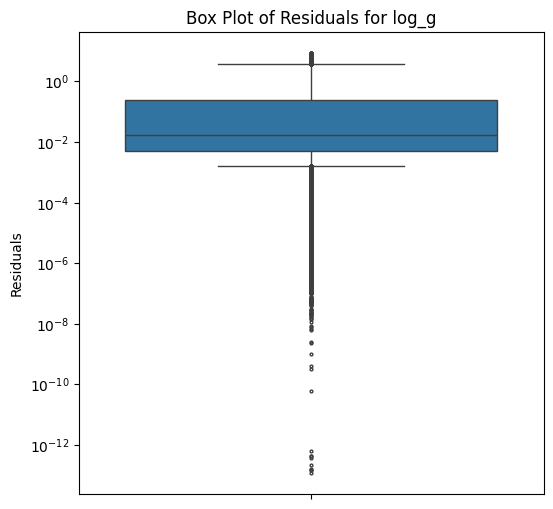

...

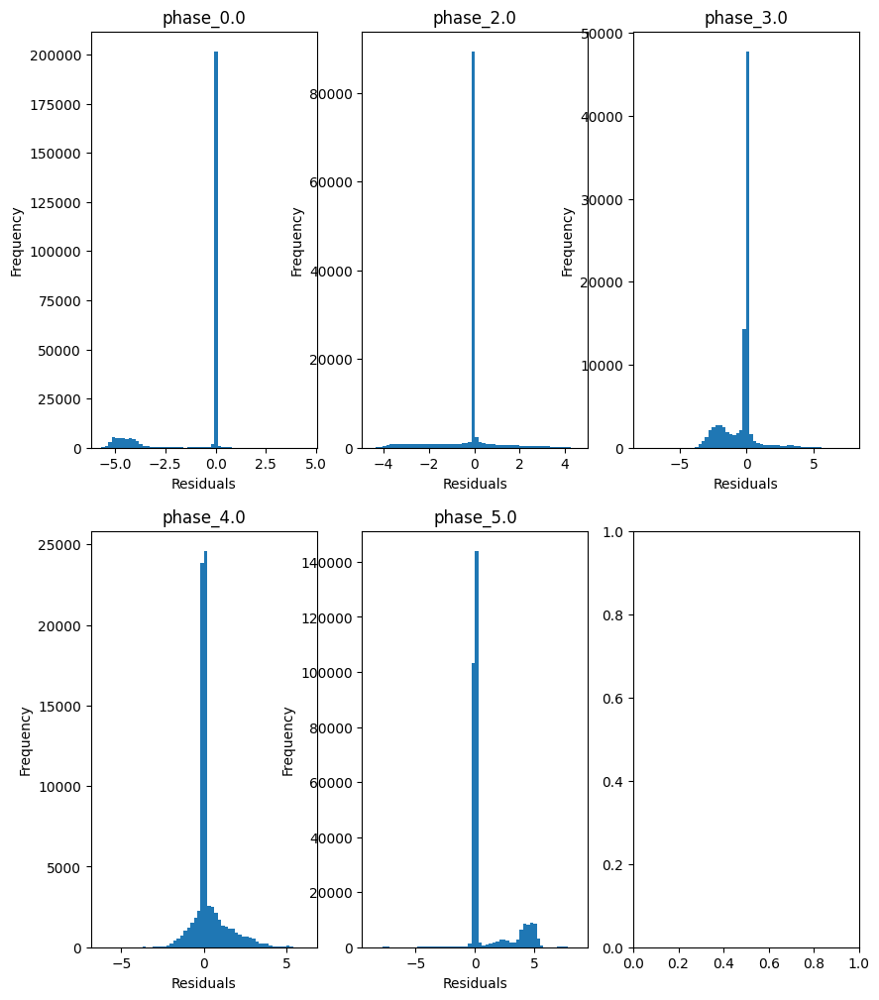

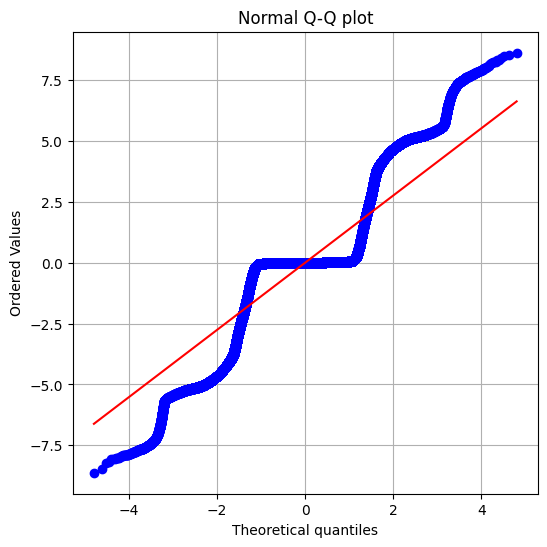

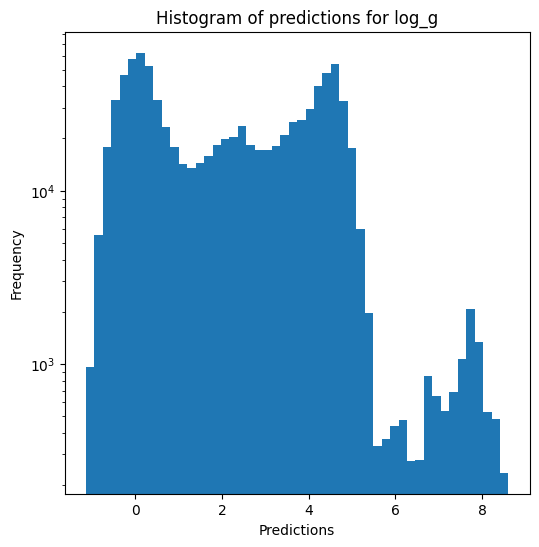

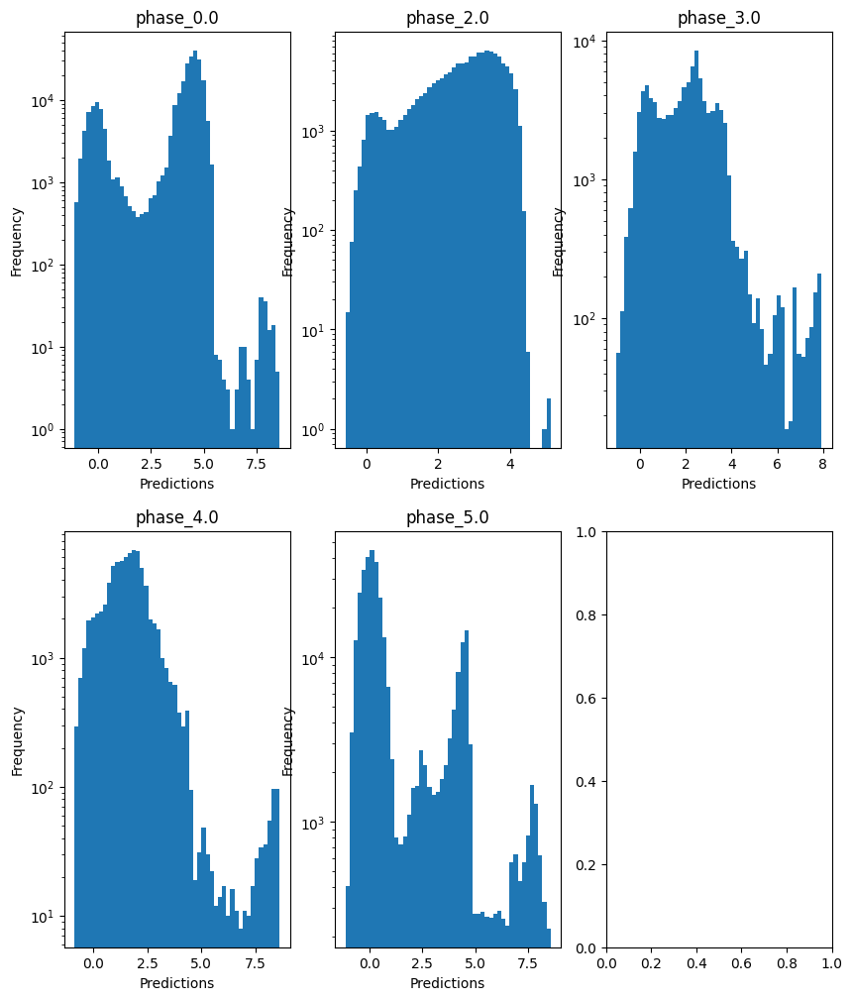

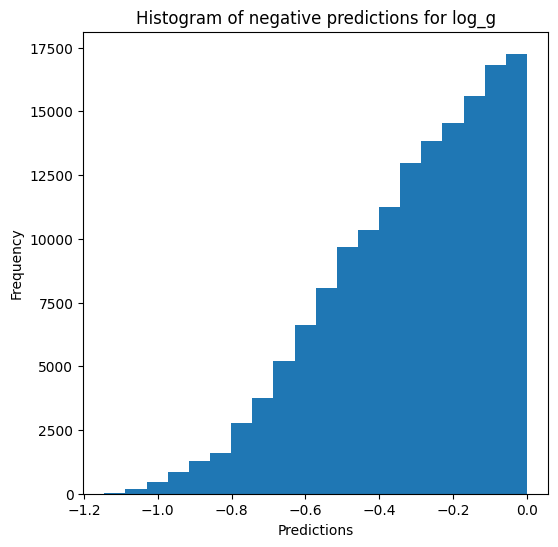


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -1.3597889493706377
  RMSE :  0.9657032436621844
  MAE :  0.42236833420604747
  MedAE :  0.003881118459481789
  CORR :  0.467582412638449
  MAX_ER :  2.835530716327375
  Percentiles : 
    75th percentile :  0.01418008164519125
    90th percentile :  2.2079355696581544
    95th percentile :  2.4324192305500283
    99th percentile :  2.6128201078522695

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  -0.2893884951099359
  RMSE :  0.5631340412408128
  MAE :  0.2576073716154968
  MedAE :  0.008280004176218547
  CORR :  0.4344885369455158
  MAX_ER :  2.2814803868917117
  Percentiles : 
    75th percentile :  0.1878417356183258
    90th percentile :  1.1321458158040323
    95th percentile :  1.5337117777408182
    99th percentile :  1.9008082058546596

radius results for the phase category wit

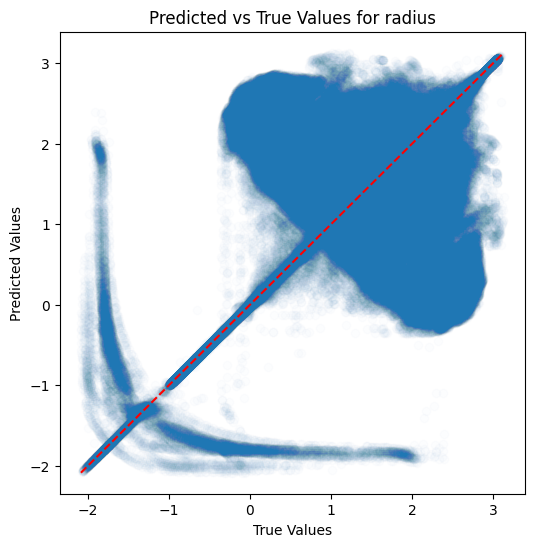

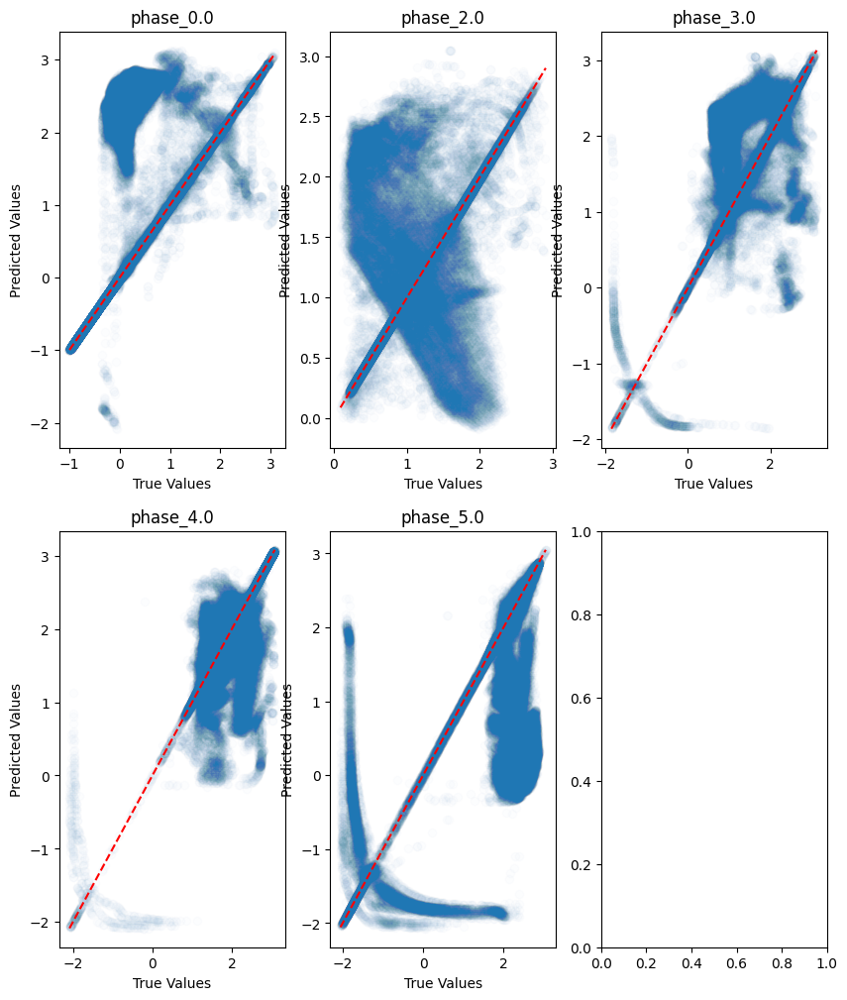

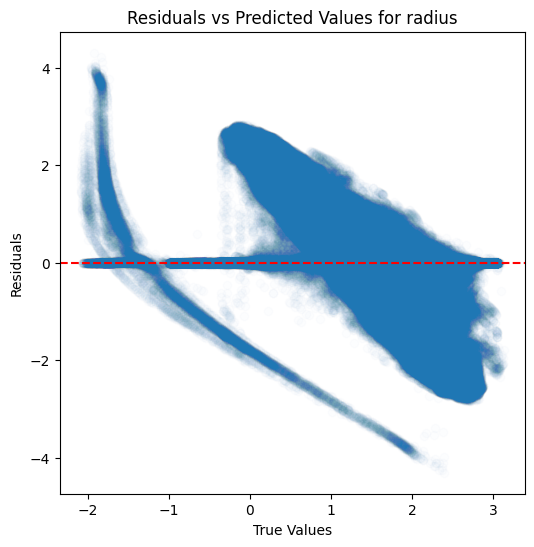

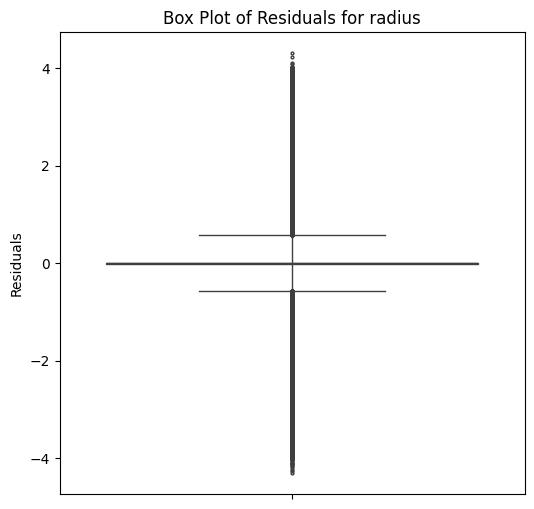

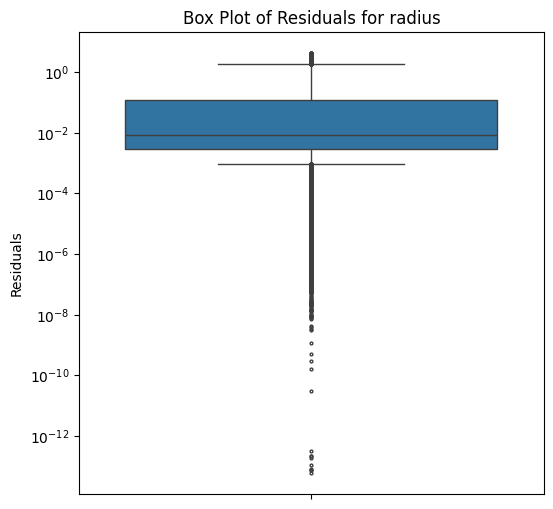

...

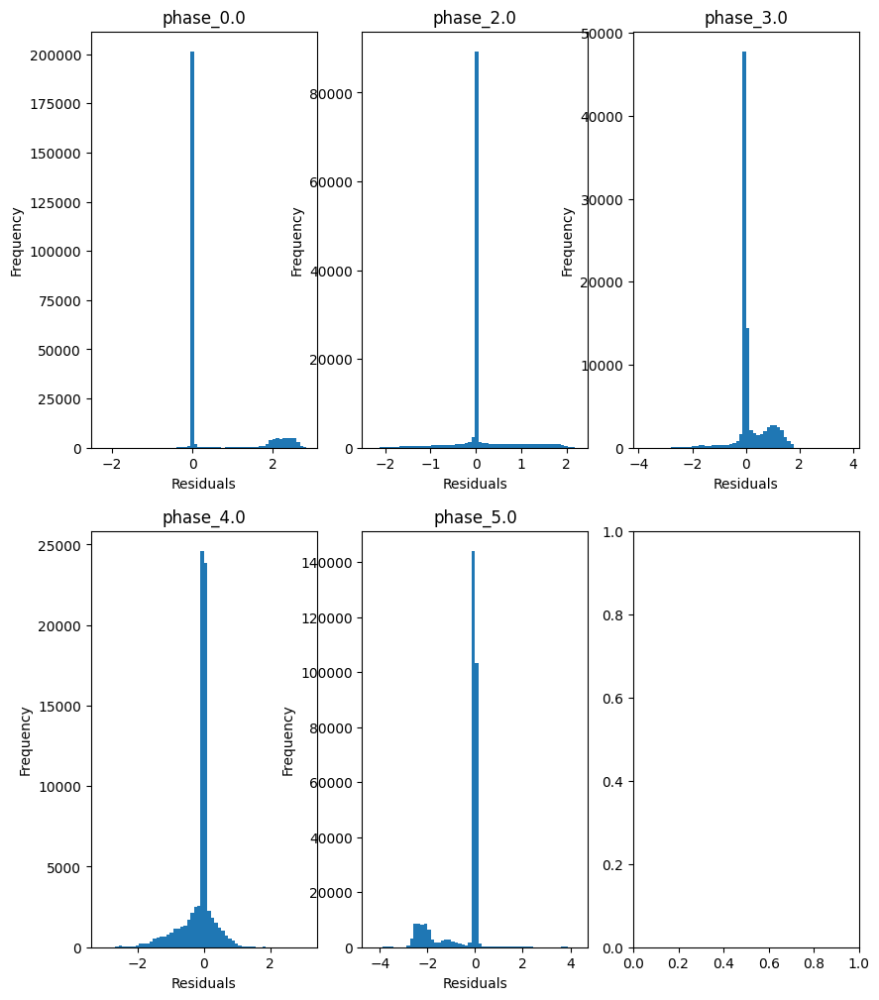

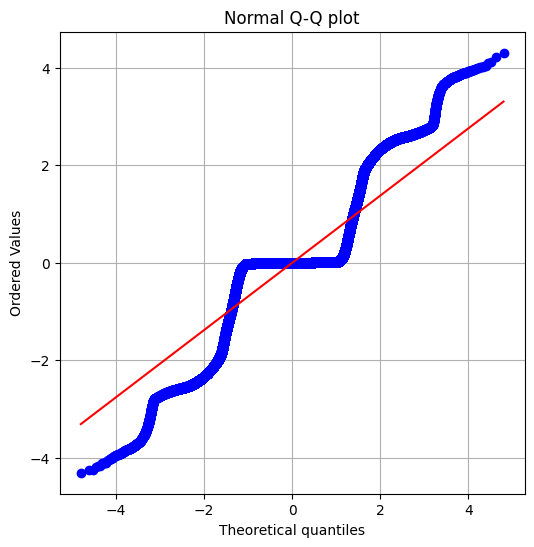

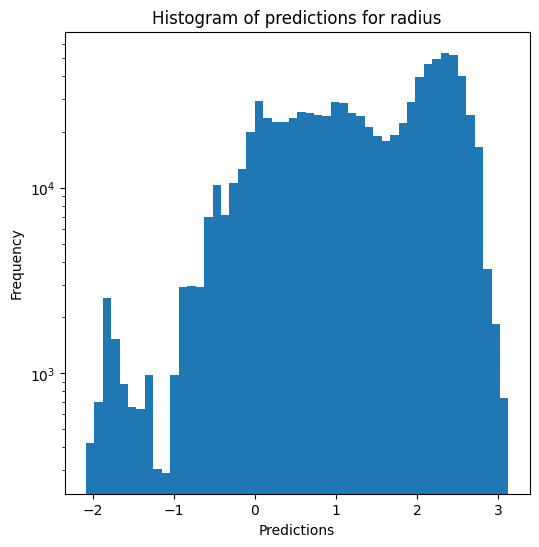

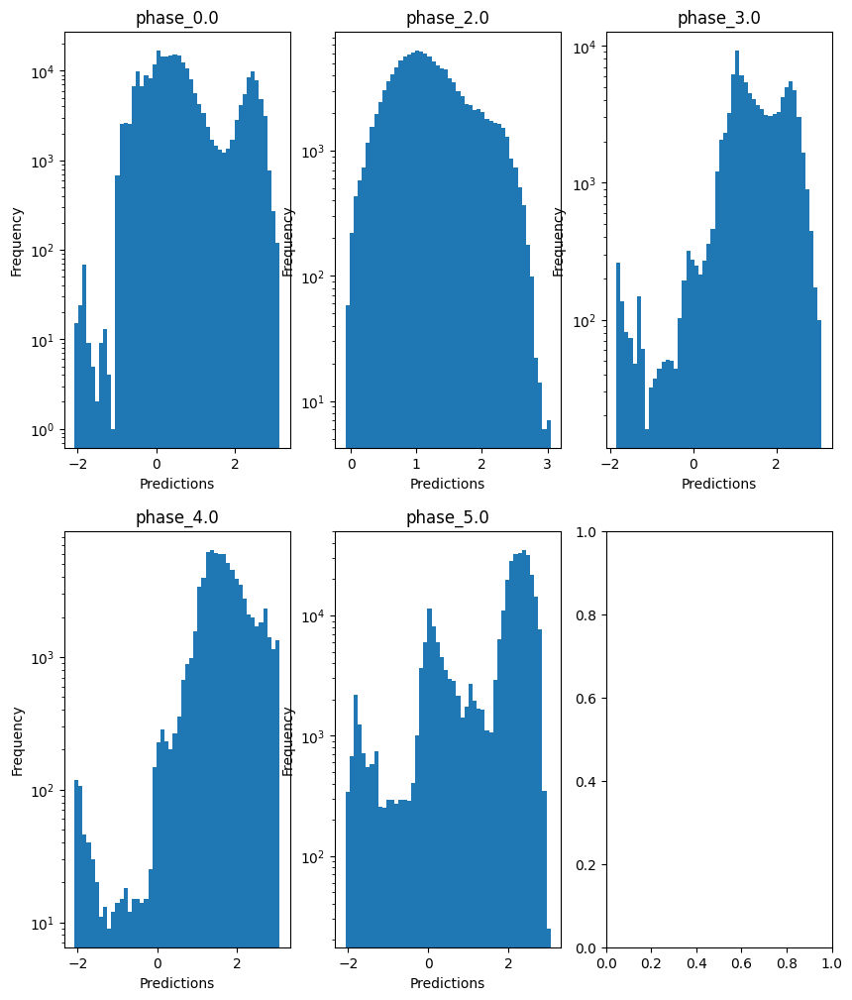

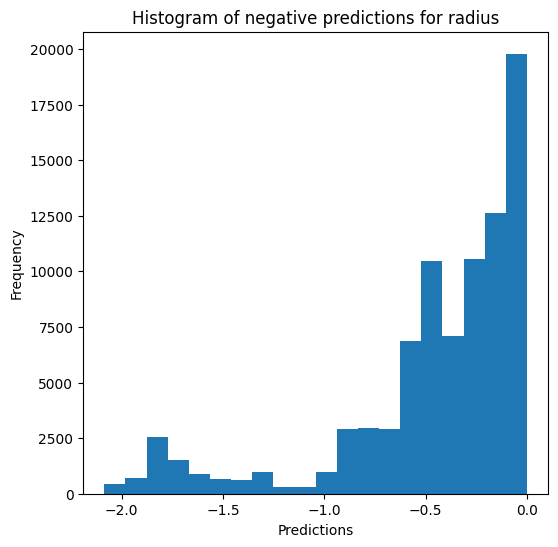

Saving results...


In [ ]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### K-nearest neighbours

In [13]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.90340707004253
  RVE :  0.8038628061153852
  RMSE :  0.1727037398575526
  MAE :  0.08218424053090491
  MedAE :  0.0025916182480565375
  CORR :  0.91489146496135
  MAX_ER :  1.8188574215908502
  Percentiles : 
    75th percentile :  0.10178788889125767
    90th percentile :  0.299482963674808
    95th percentile :  0.44751684095863087
    99th percentile :  0.6345592171660835

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.709363146124065
  RVE :  0.9660969117095235
  RMSE :  0.059371215189197926
  MAE :  0.027536318424075775
  MedAE :  0.002880908228771073
  CORR :  0.983190595616171
  MAX_ER :  0.7072956661898417
  Percentiles : 
    75th percentile :  0.032103360744663356
    90th percentile :  0.09223379483806426
    95th percentile :  0.1286860879590427
    99th percentil

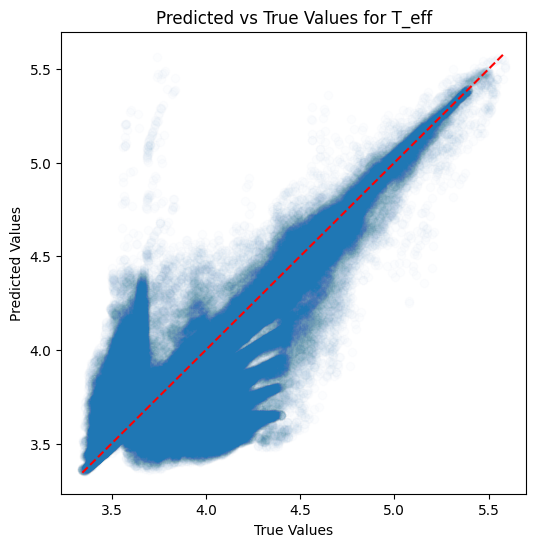

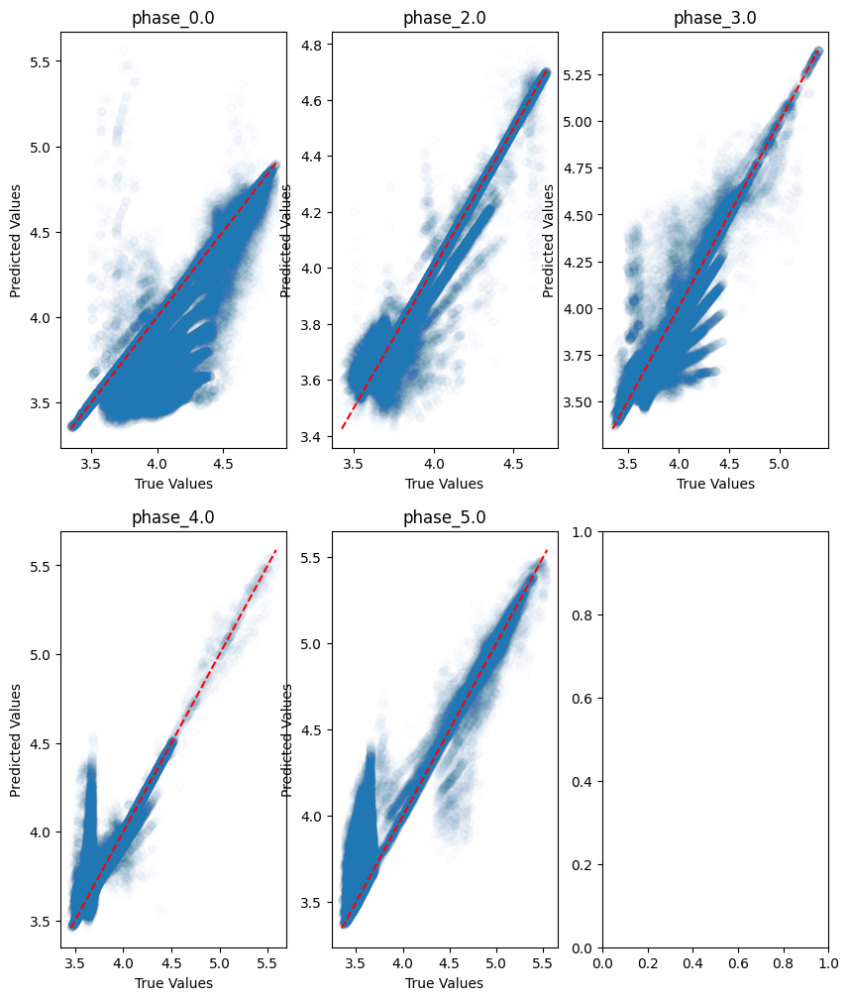

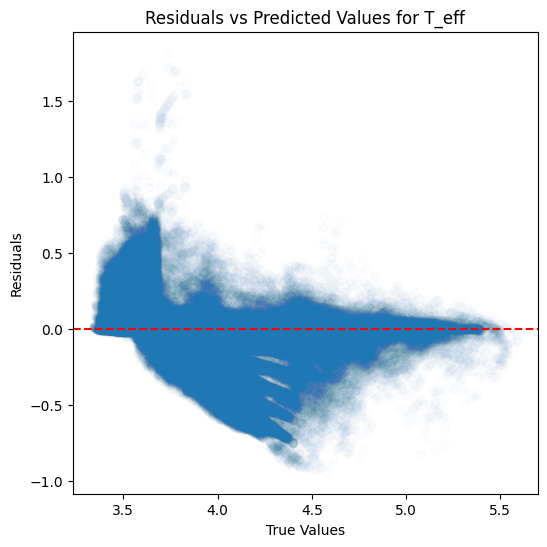

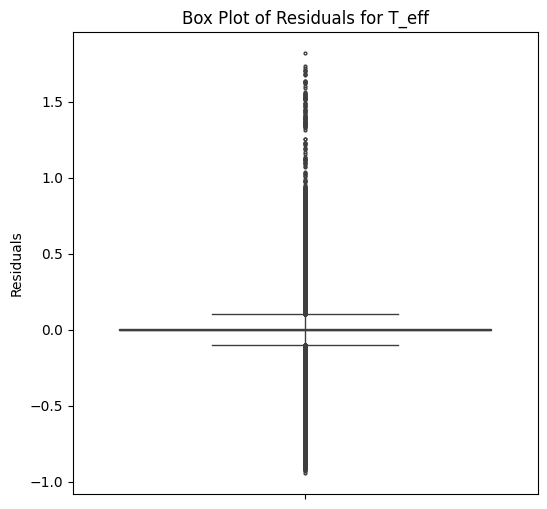

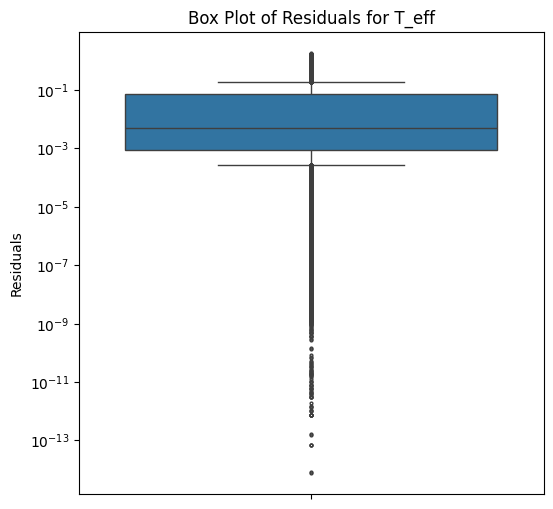

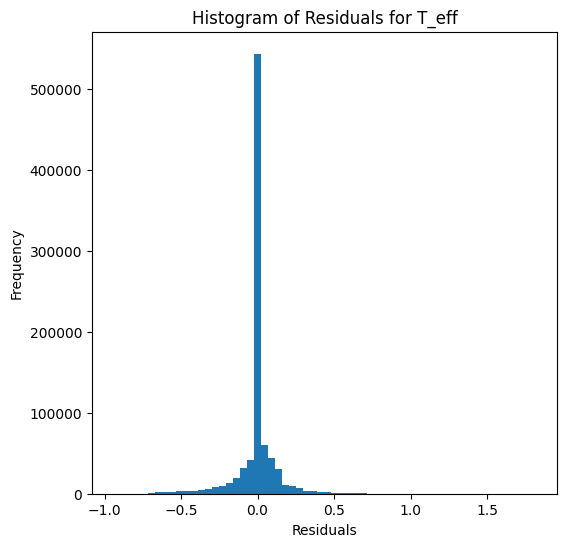

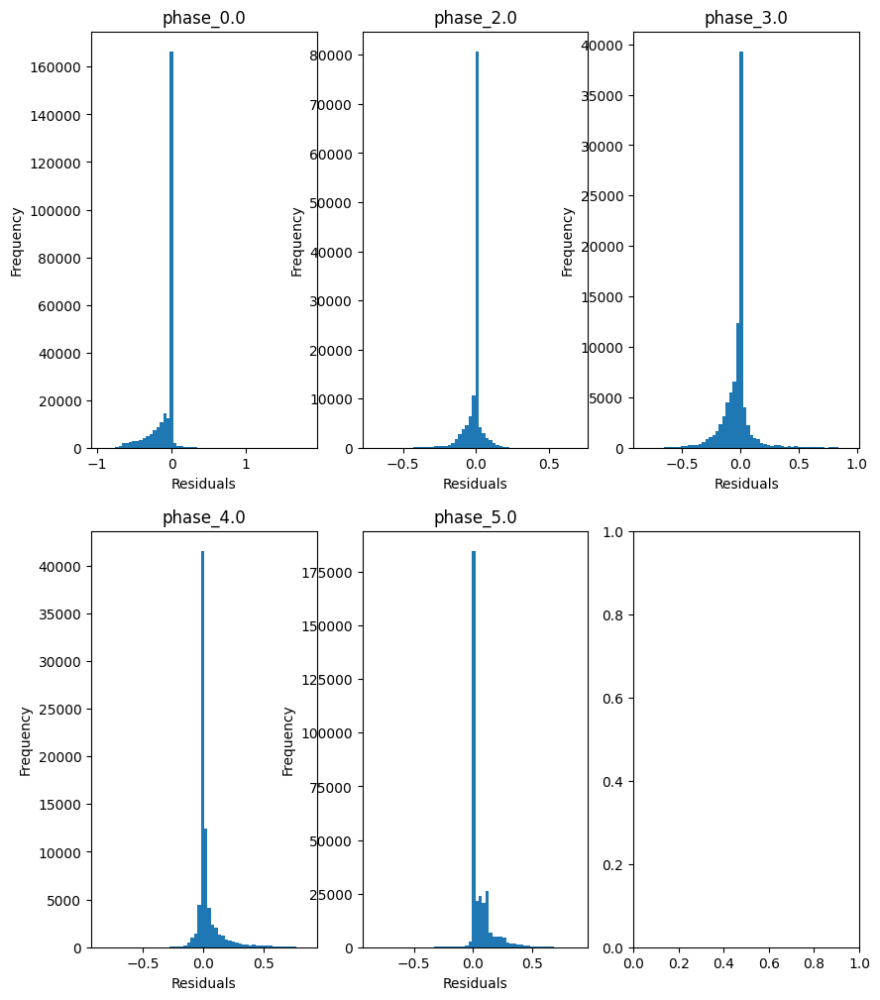

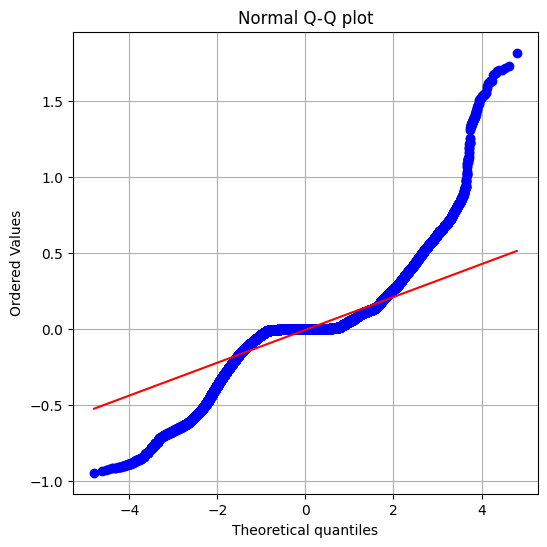

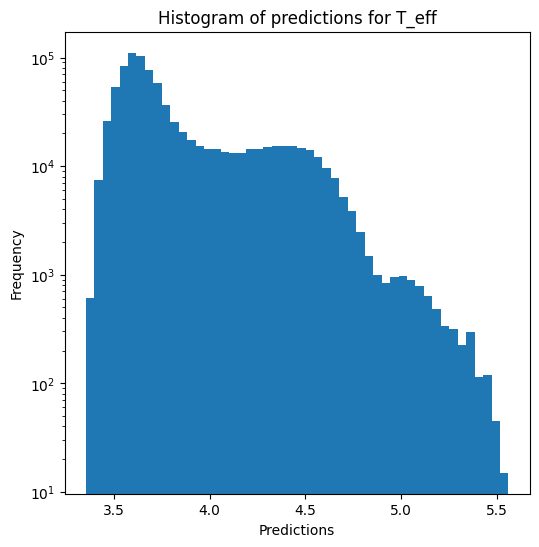

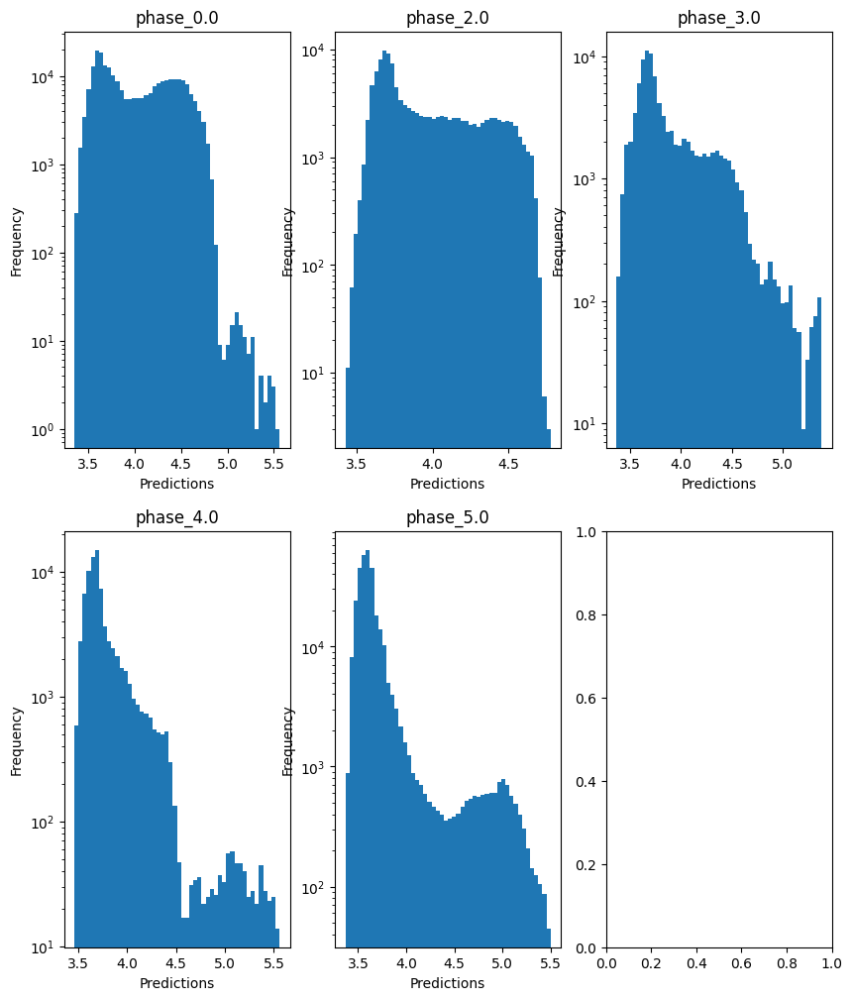


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -3.952805621191736
  RMSE :  1.580760710609573
  MAE :  0.7779922653408952
  MedAE :  0.007852422448542562
  CORR :  0.39643478734822746
  MAX_ER :  5.639451507571024
  Percentiles : 
    75th percentile :  0.942755590250819
    90th percentile :  3.181455738912139
    95th percentile :  4.202672380750333
    99th percentile :  4.969233401649943

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.3213093446436006
  RMSE :  0.7593017265051165
  MAE :  0.36878277491420436
  MedAE :  0.013840238129435134
  CORR :  0.6381321531277928
  MAX_ER :  4.429763819606739
  Percentiles : 
    75th percentile :  0.5319435962300479
    90th percentile :  1.2988172157314355
    95th percentile :  1.8466829861848197
    99th percentile :  3.026890213729053

log_g results for the phase category with a value 

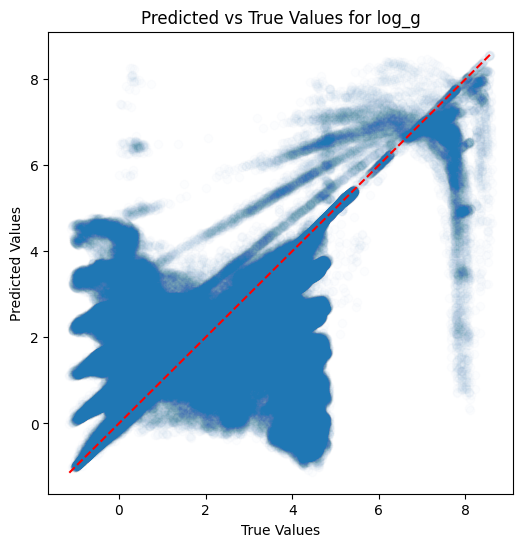

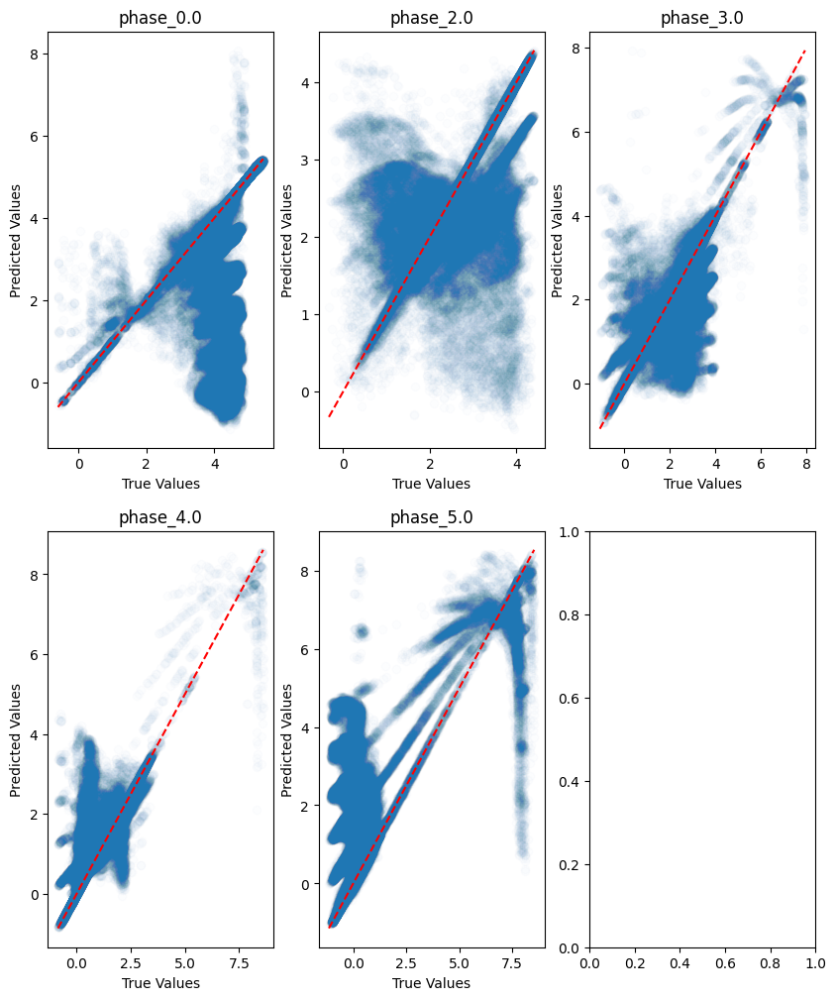

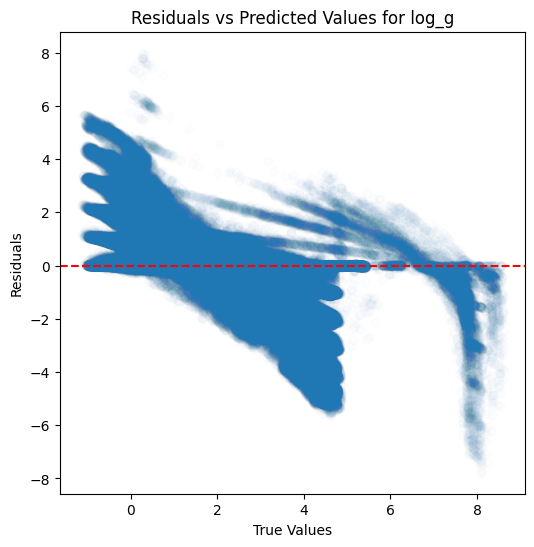

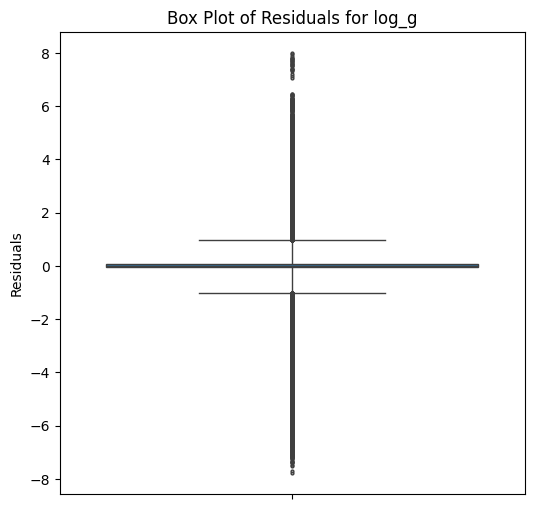

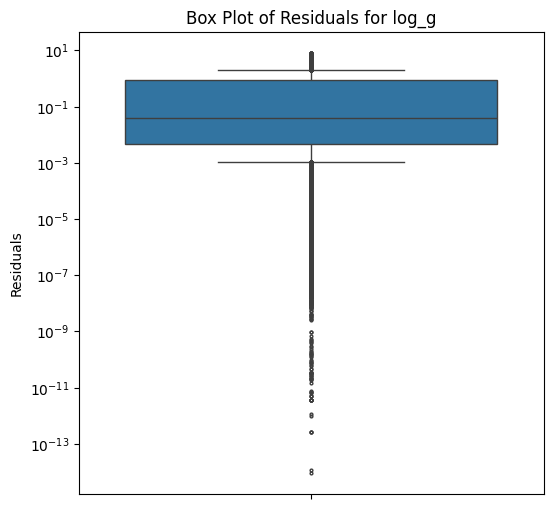

...

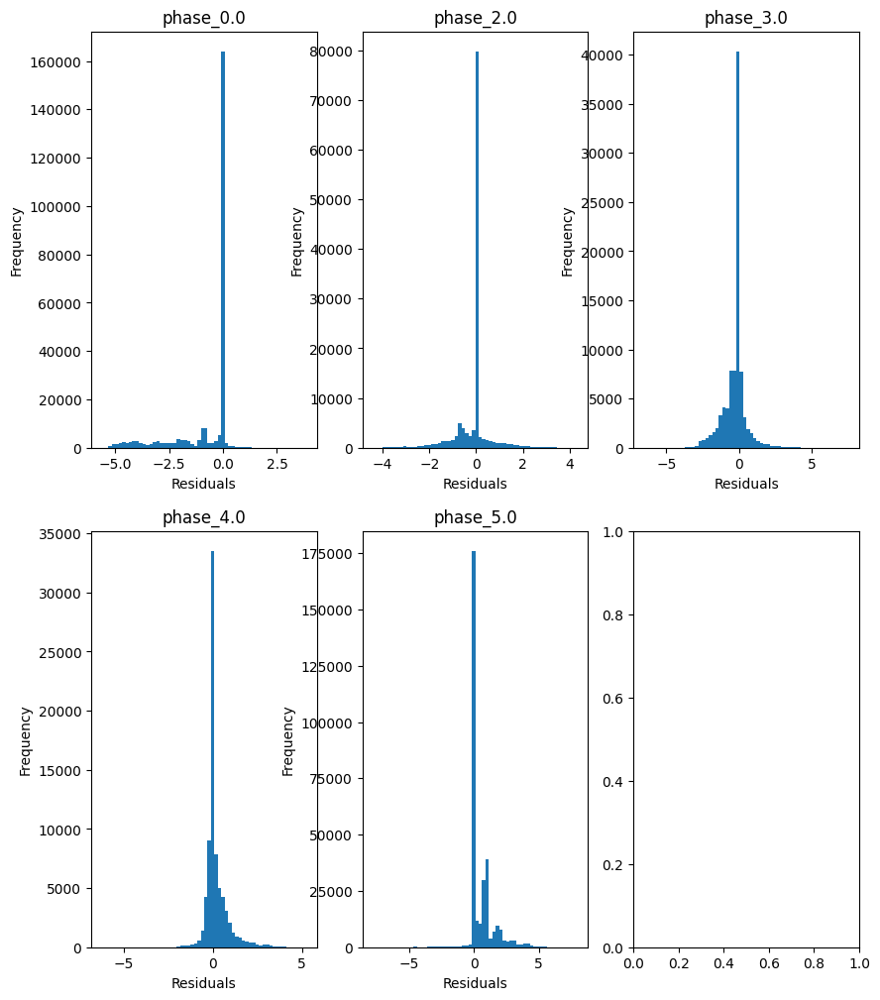

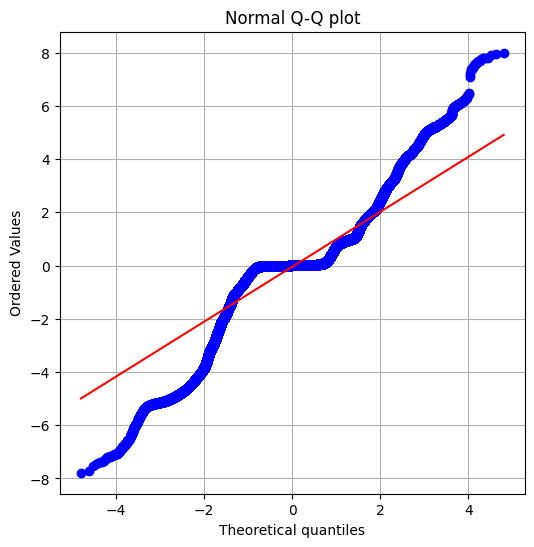

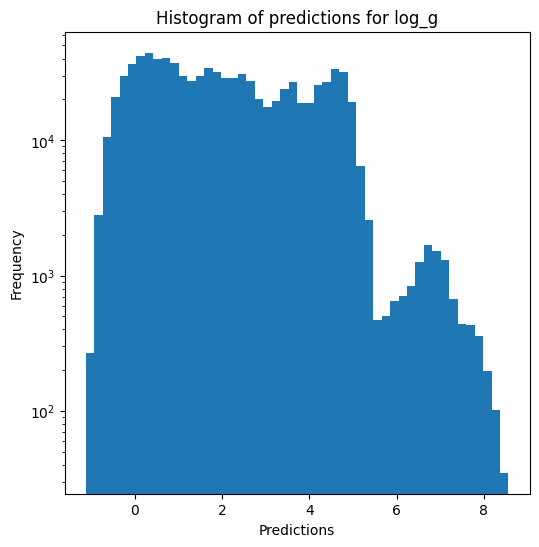

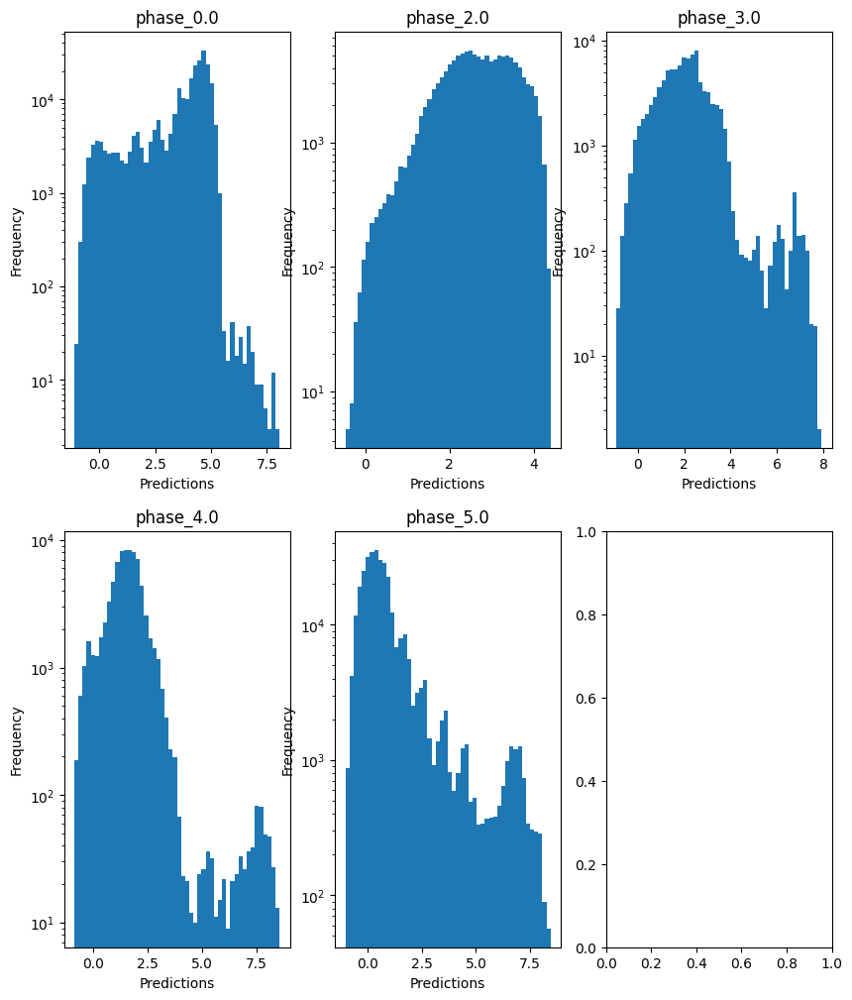

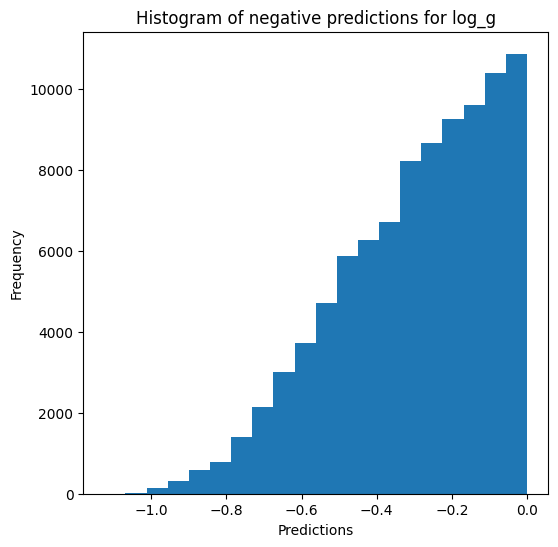


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.4875114575583295
  RMSE :  0.7904162098463265
  MAE :  0.3899961877488699
  MedAE :  0.006036321433961312
  CORR :  0.5781344471284099
  MAX_ER :  2.821331981141119
  Percentiles : 
    75th percentile :  0.471640489903522
    90th percentile :  1.5914581788184503
    95th percentile :  2.1022849725156108
    99th percentile :  2.483728876398083

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.41600397138635004
  RMSE :  0.3796489089154753
  MAE :  0.184392625477679
  MedAE :  0.006928044785909249
  CORR :  0.6820837960901902
  MAX_ER :  2.2149094306245987
  Percentiles : 
    75th percentile :  0.2660070696909199
    90th percentile :  0.6493663870748144
    95th percentile :  0.923364987894073
    99th percentile :  1.5134374833596633

radius results for the phase category with a v

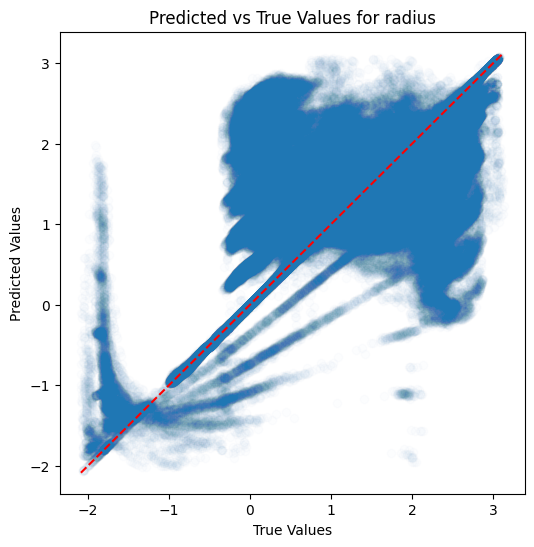

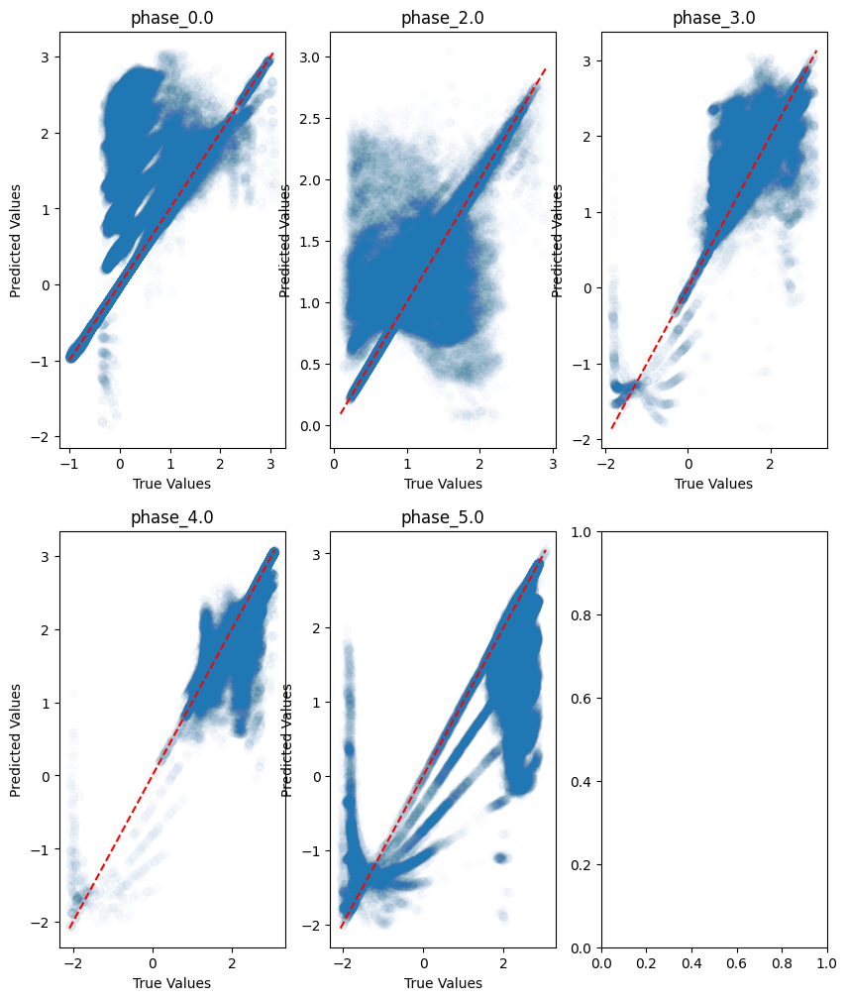

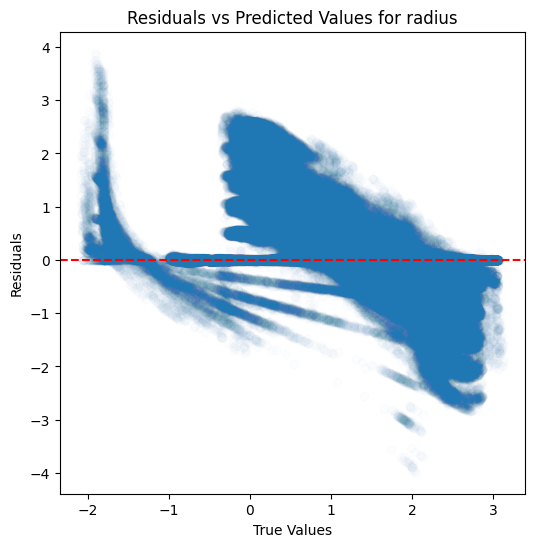

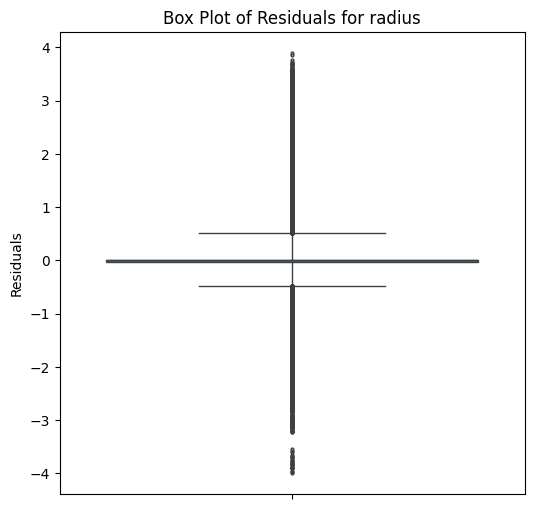

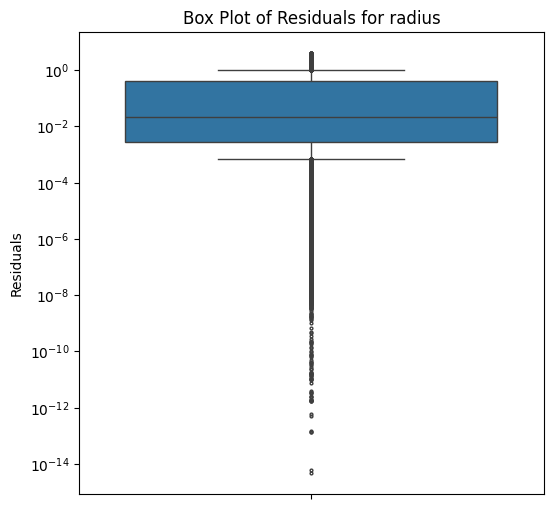

...

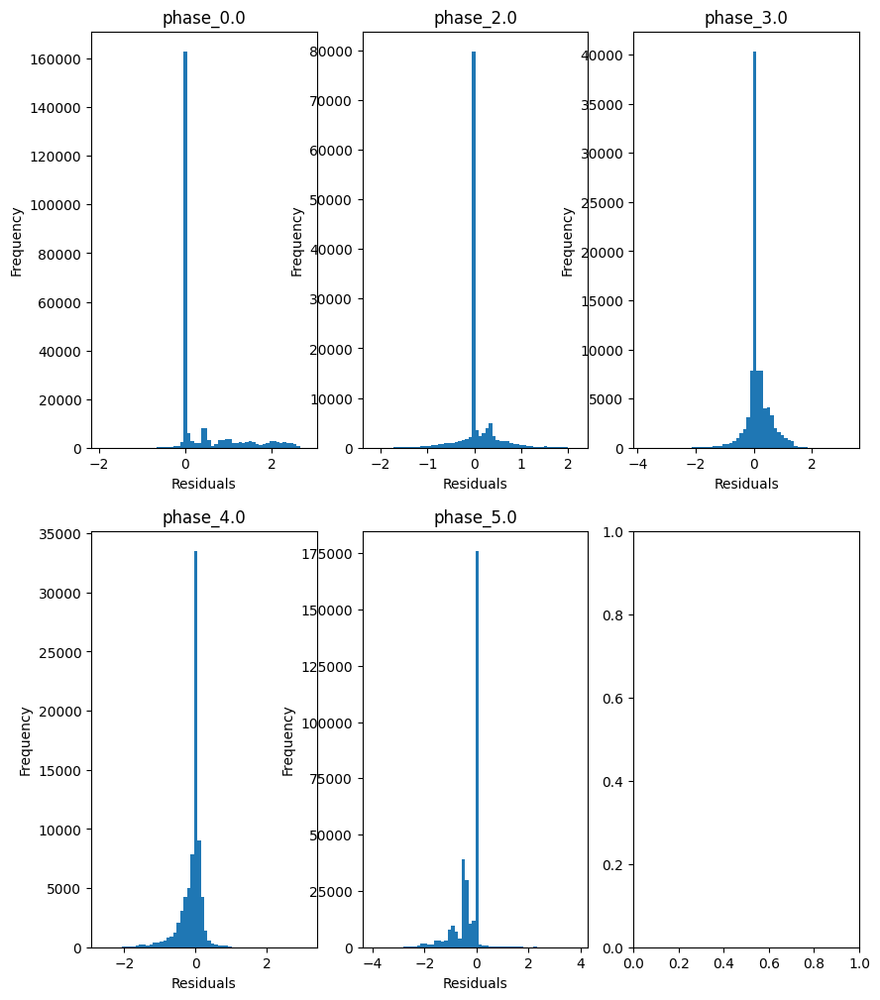

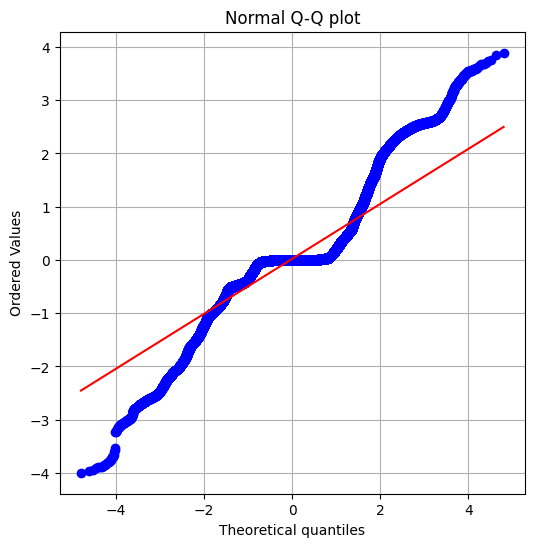

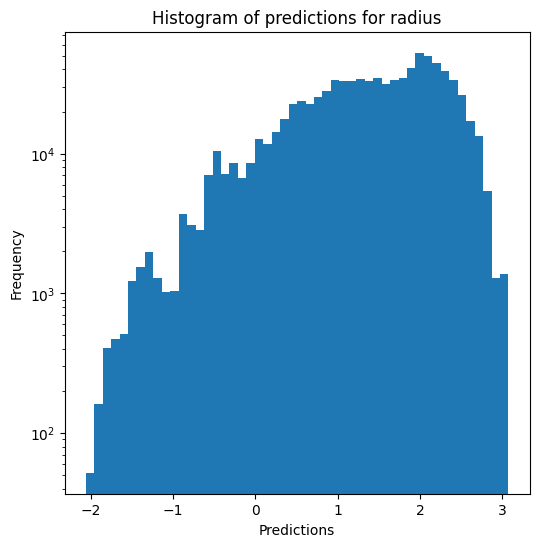

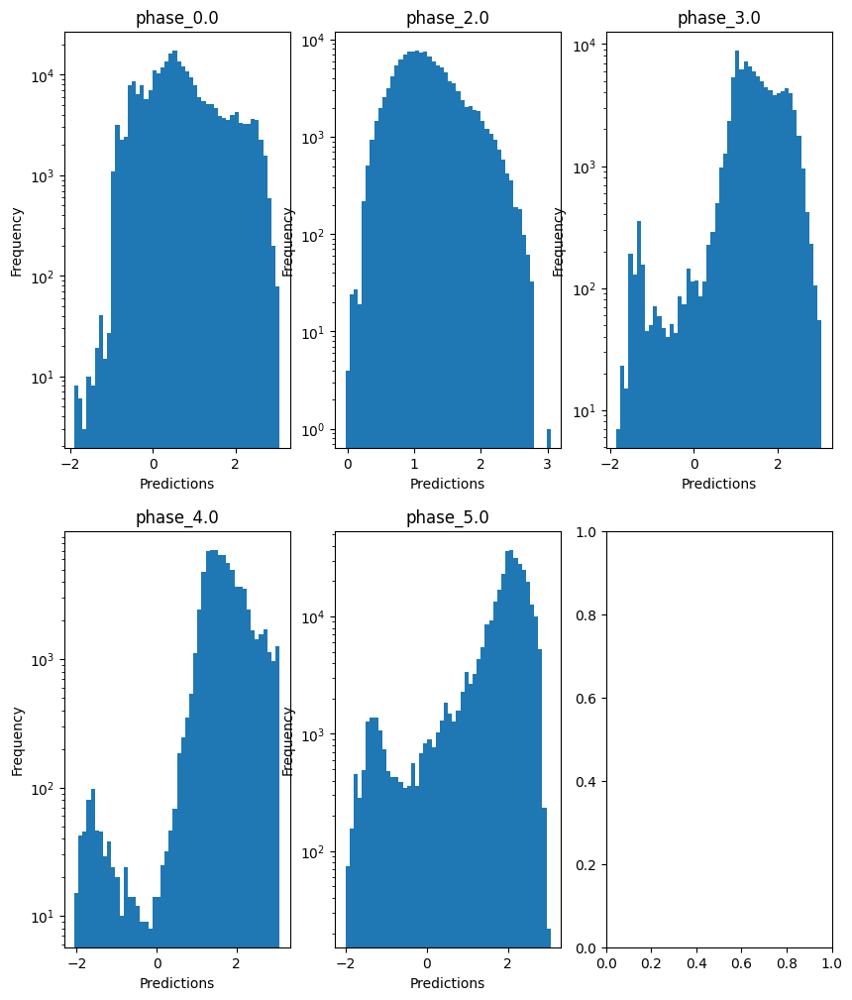

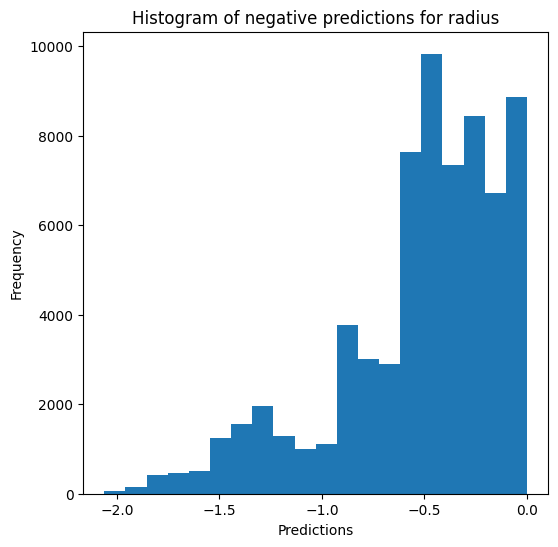

Saving results...


In [ ]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### Random forests

In [15]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.90340707004253
  RVE :  0.8030414711131495
  RMSE :  0.17262655028563312
  MAE :  0.08036899142039686
  MedAE :  0.0011178629698731513
  CORR :  0.9186429854735219
  MAX_ER :  1.5857118848887133
  Percentiles : 
    75th percentile :  0.08948089375495127
    90th percentile :  0.31532637762378907
    95th percentile :  0.45813049729087174
    99th percentile :  0.6160741661418189

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.709363146124065
  RVE :  0.9467419573110604
  RMSE :  0.07435125752233232
  MAE :  0.03287287484891881
  MedAE :  0.0031209620083212375
  CORR :  0.973834609158071
  MAX_ER :  0.742199275185699
  Percentiles : 
    75th percentile :  0.032324958611525845
    90th percentile :  0.10811292780914744
    95th percentile :  0.16436942776635918
    99th perce

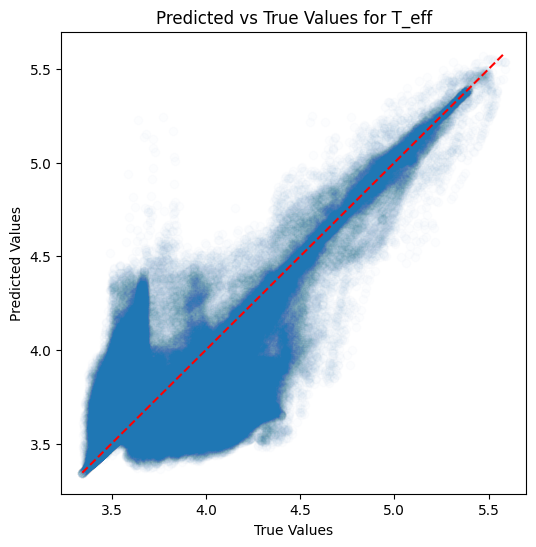

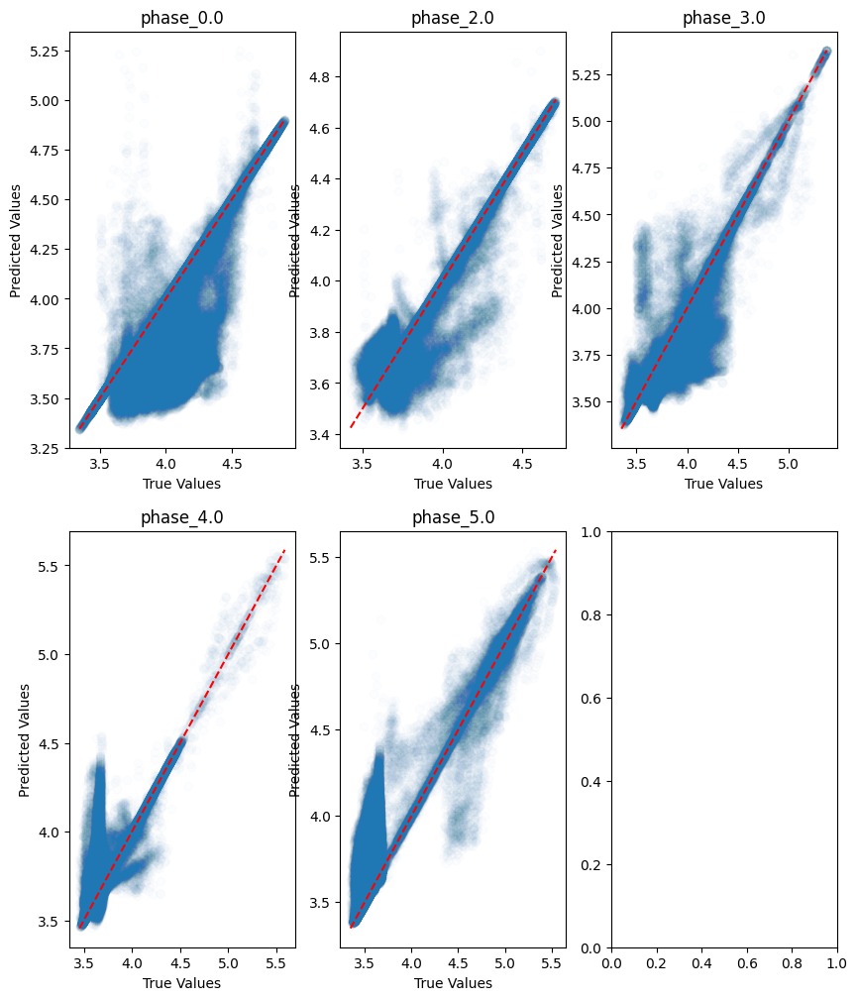

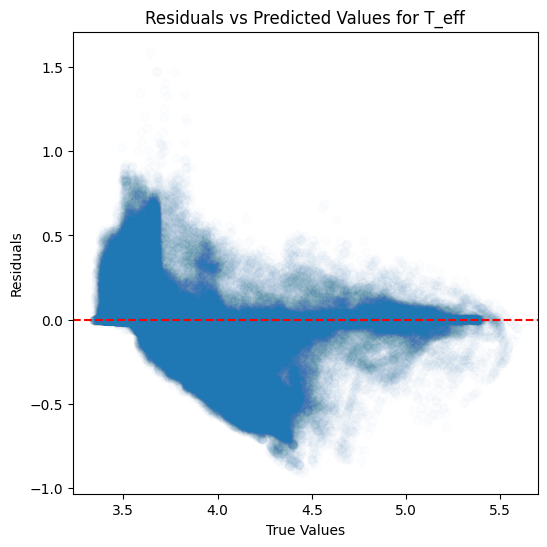

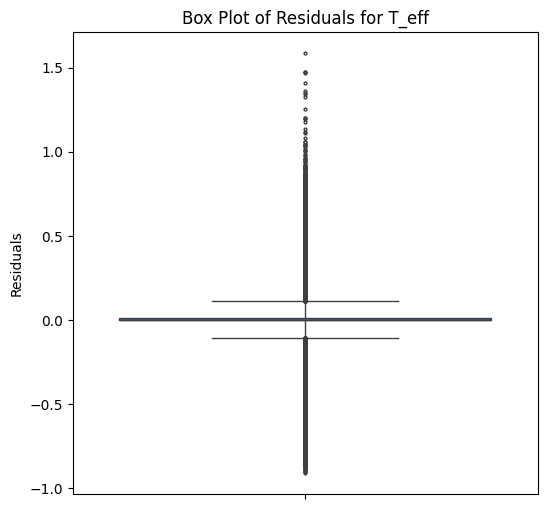

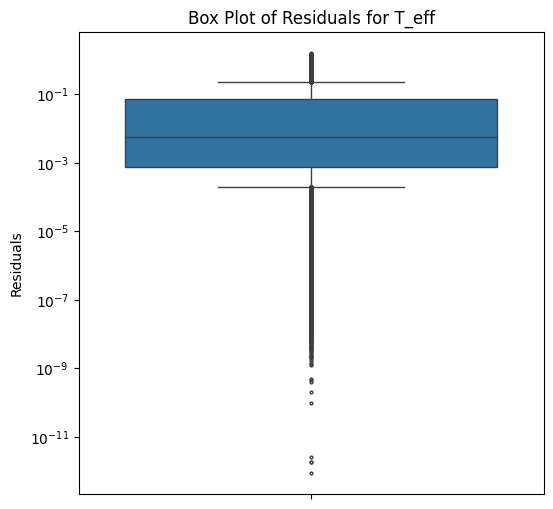

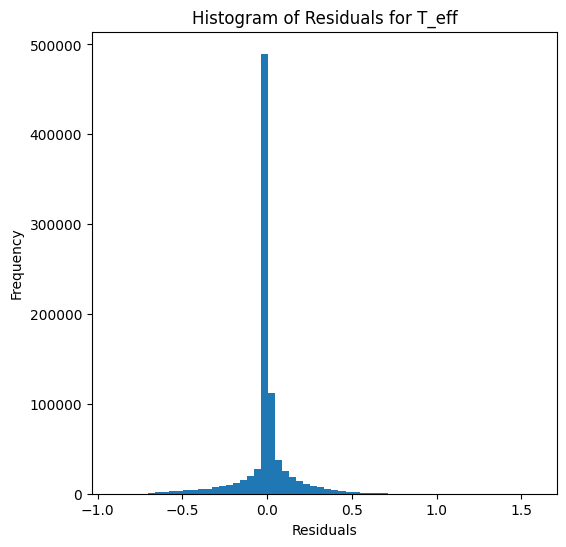

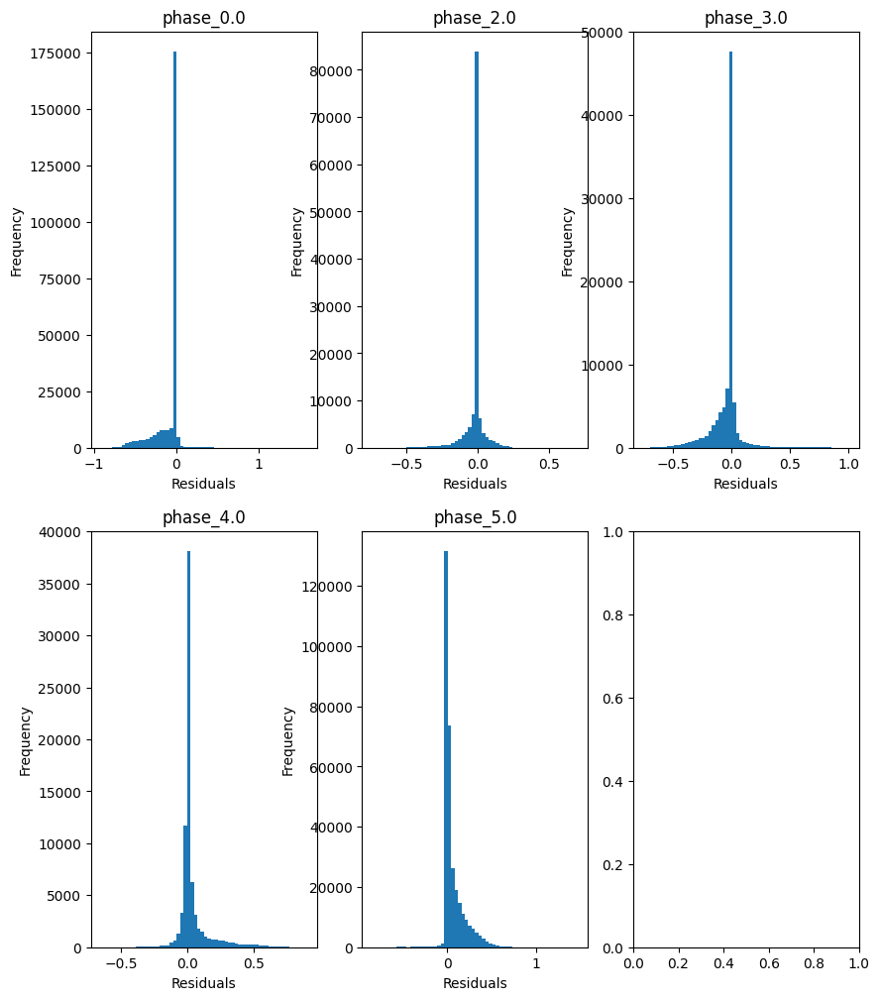

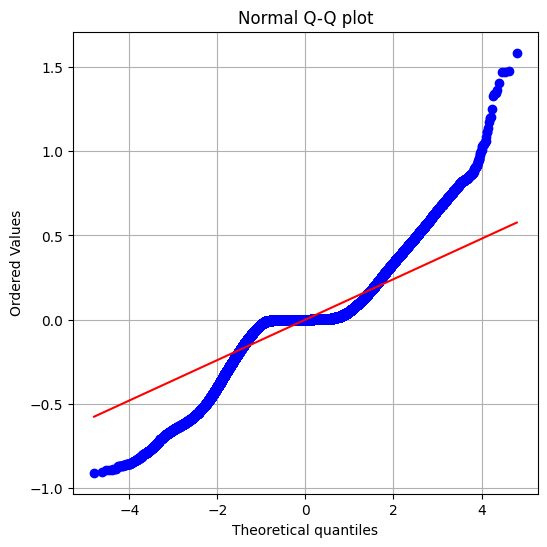

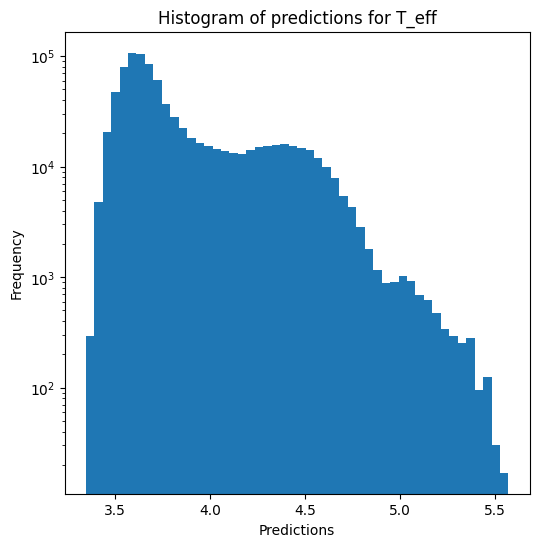

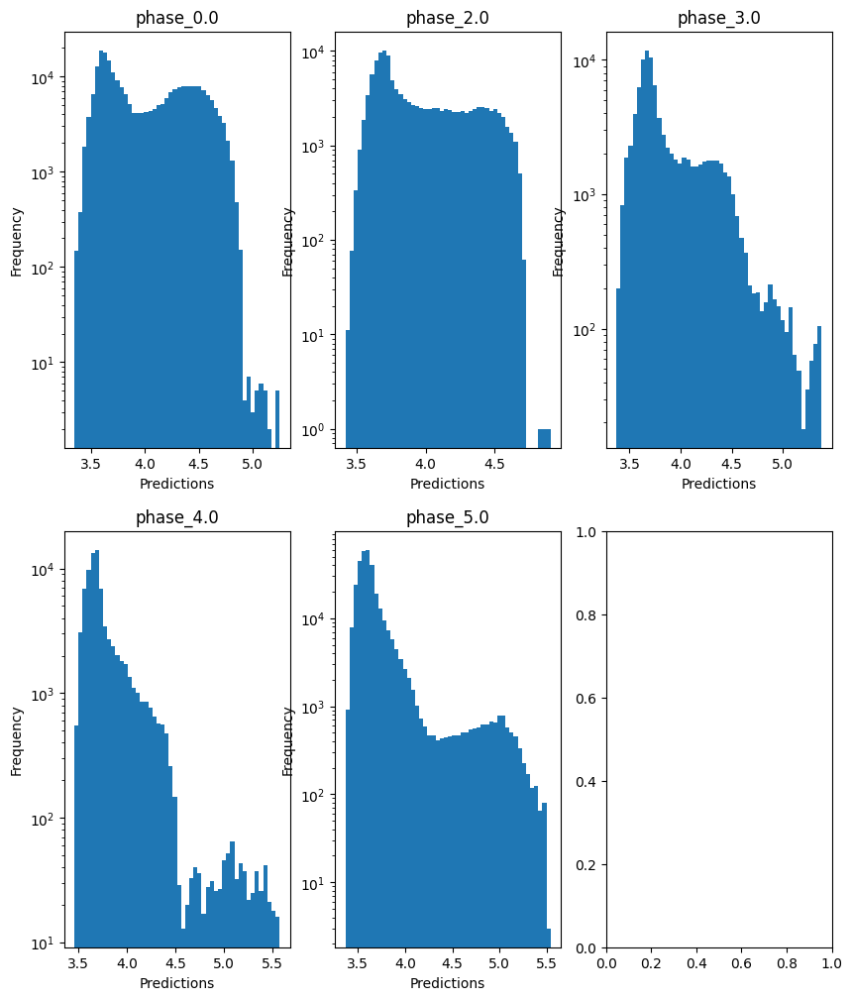


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -4.294955580122317
  RMSE :  1.638948830676084
  MAE :  0.8078072186785434
  MedAE :  0.004005795457218131
  CORR :  0.3771582140445084
  MAX_ER :  5.575523880445407
  Percentiles : 
    75th percentile :  1.0131661807608003
    90th percentile :  3.494652133499344
    95th percentile :  4.159346059170514
    99th percentile :  4.808186675567545

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.01790544415833928
  RMSE :  0.913488690721799
  MAE :  0.44481265796018093
  MedAE :  0.016207529028318568
  CORR :  0.5108622244716026
  MAX_ER :  4.415803603024047
  Percentiles : 
    75th percentile :  0.5183804589433545
    90th percentile :  1.7430961098292812
    95th percentile :  2.3301953339564485
    99th percentile :  3.285876718036597

log_g results for the phase category with a value 

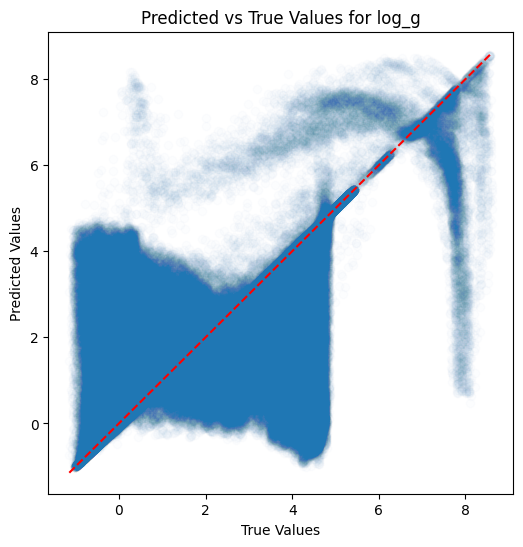

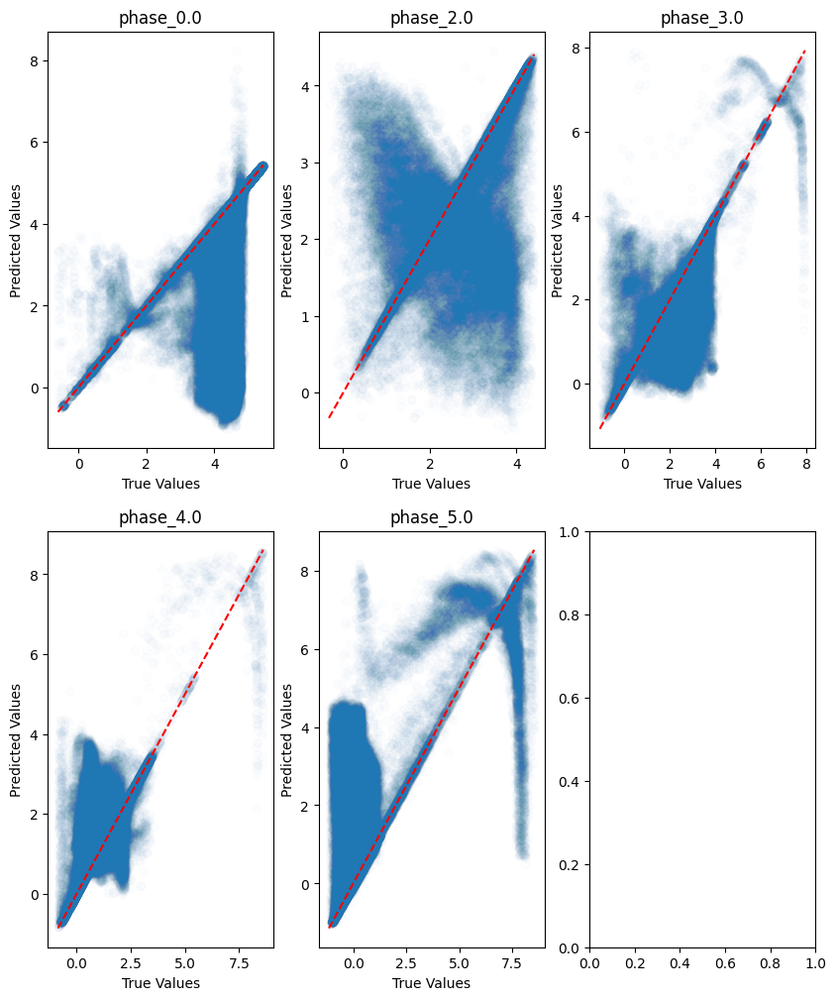

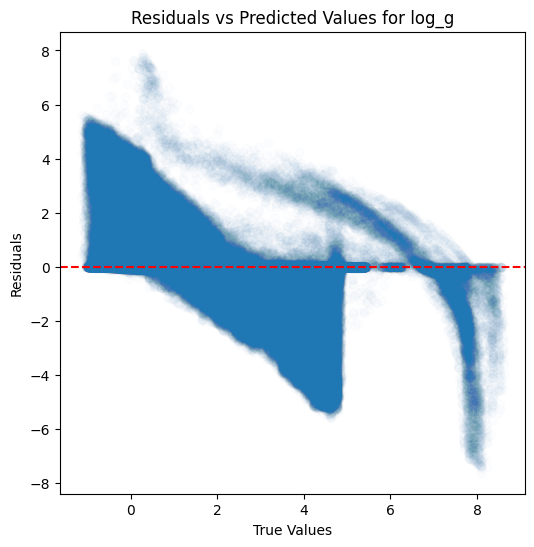

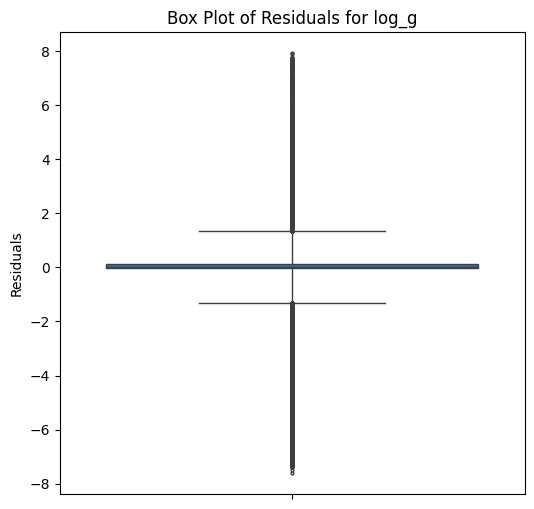

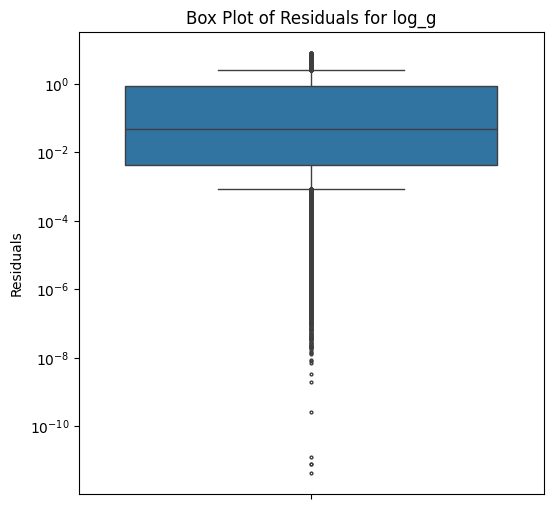

...

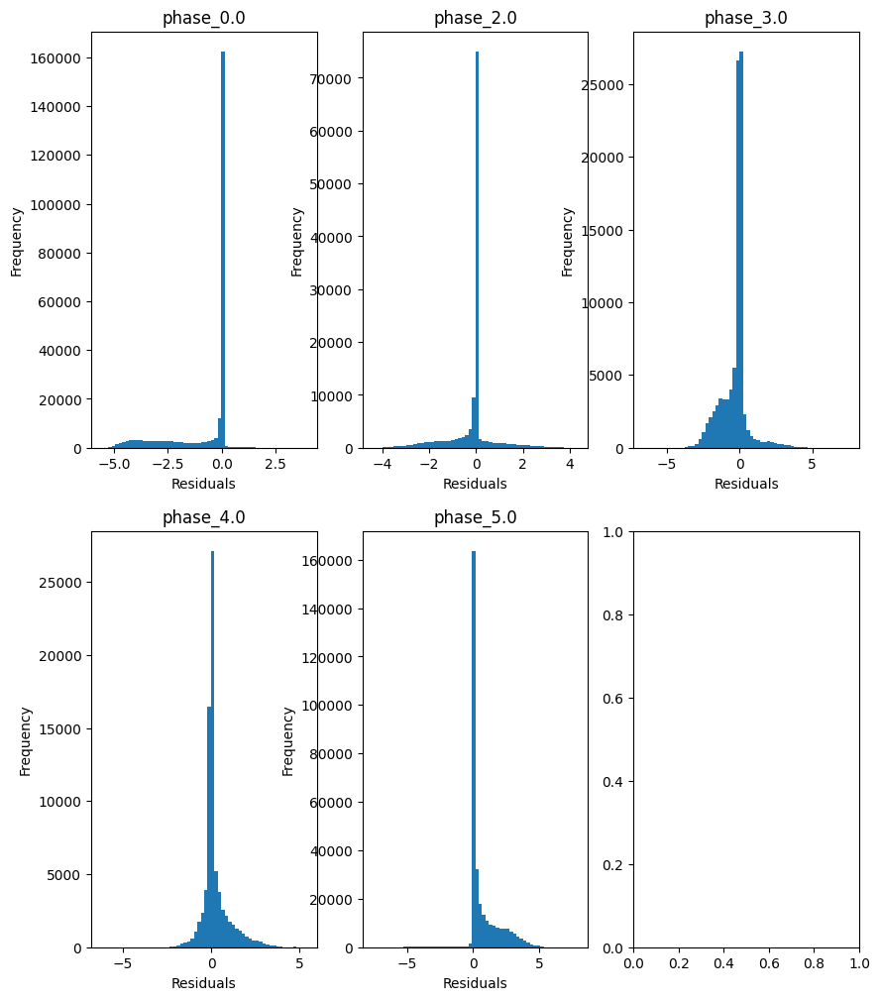

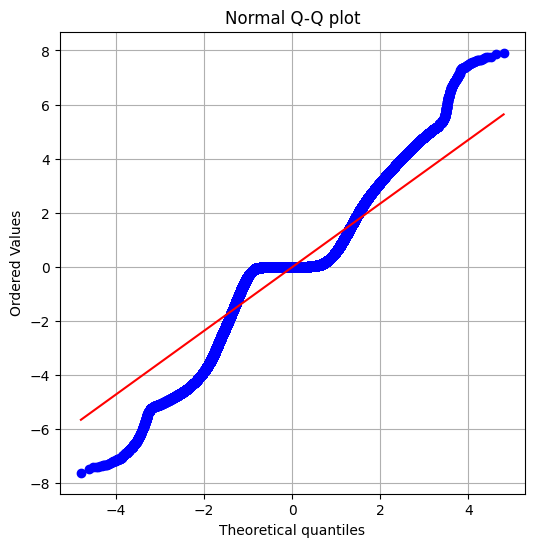

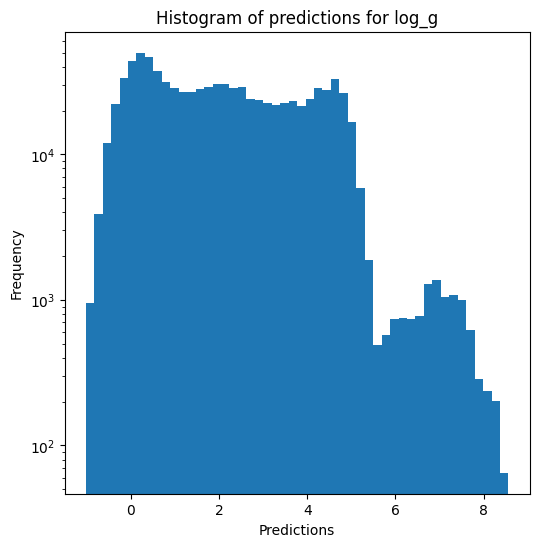

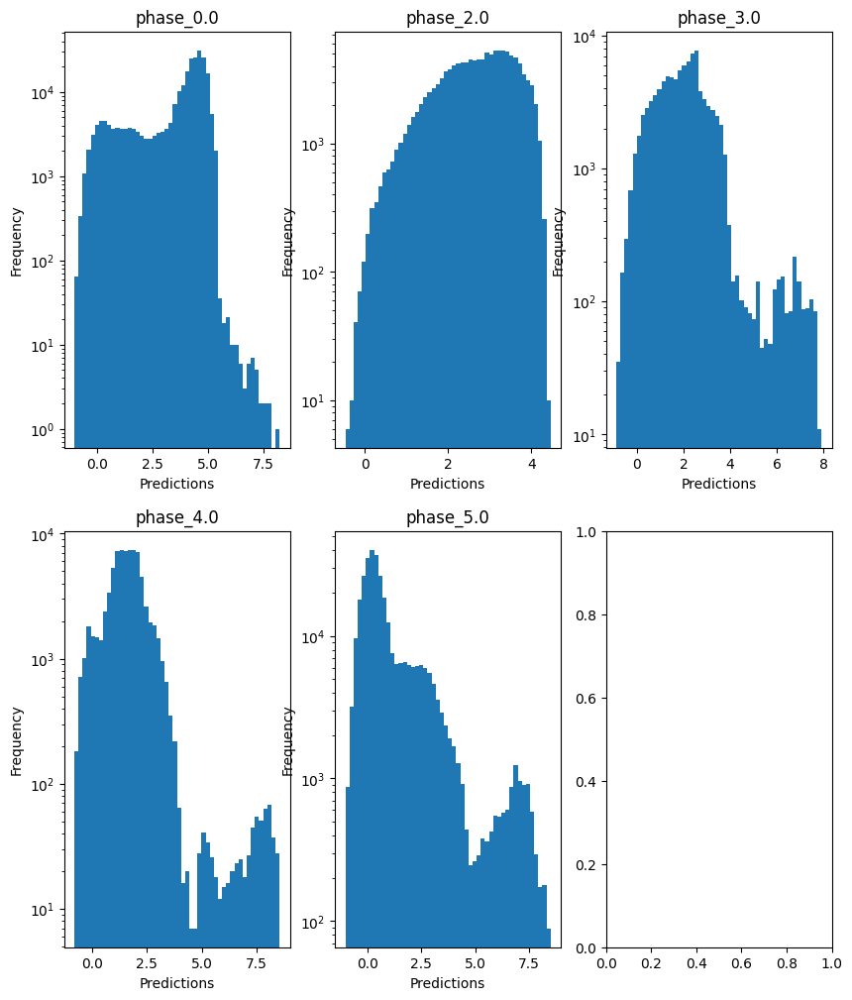

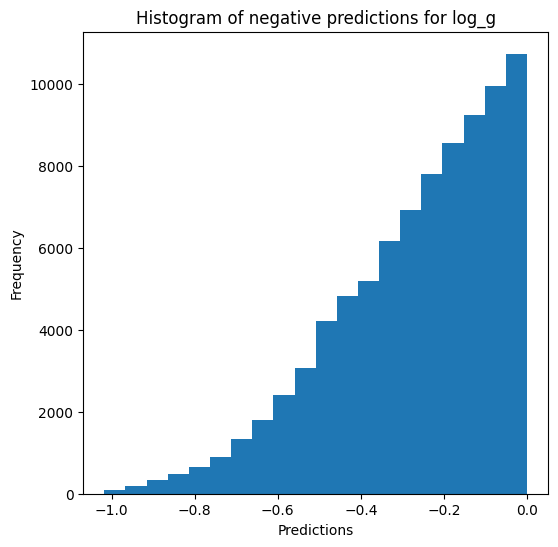


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.5901034070312623
  RMSE :  0.8194985420767779
  MAE :  0.4042025878709203
  MedAE :  0.002585439226479115
  CORR :  0.5455771585109817
  MAX_ER :  2.7895286447595247
  Percentiles : 
    75th percentile :  0.5070794819480096
    90th percentile :  1.7474578794670665
    95th percentile :  2.0795331651129962
    99th percentile :  2.403652577355424

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.154936930682261
  RMSE :  0.4567406445440412
  MAE :  0.22240715227468058
  MedAE :  0.008112763310112292
  CORR :  0.5620111241221505
  MAX_ER :  2.207937370753794
  Percentiles : 
    75th percentile :  0.2591817601015621
    90th percentile :  0.8714881733832329
    95th percentile :  1.164906877250683
    99th percentile :  1.6429690191025554

radius results for the phase category with a 

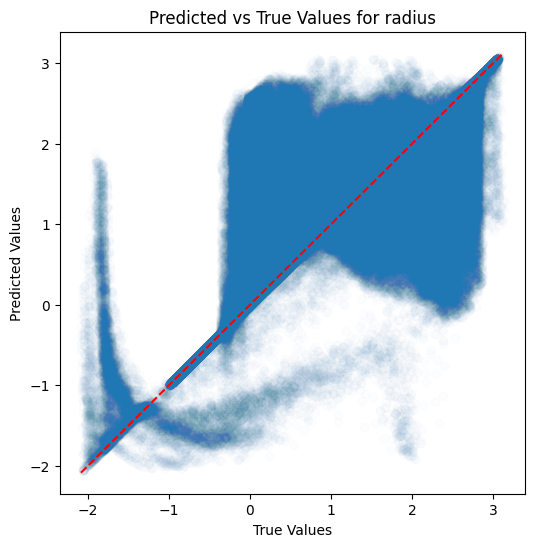

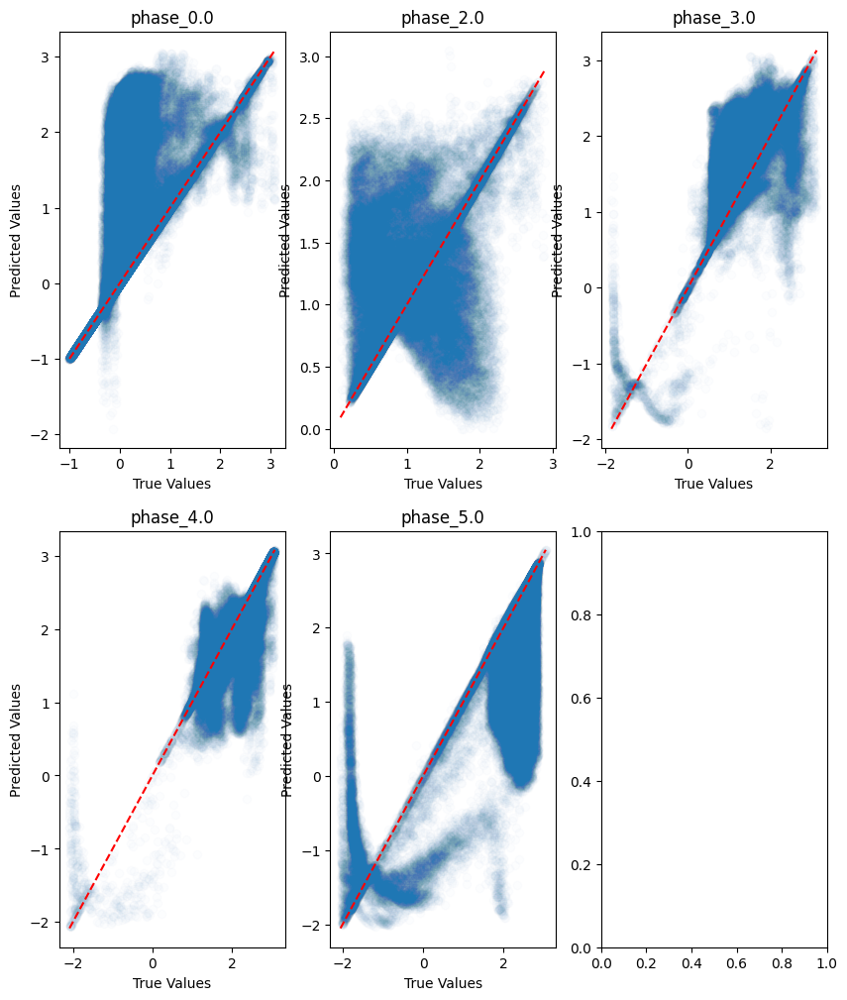

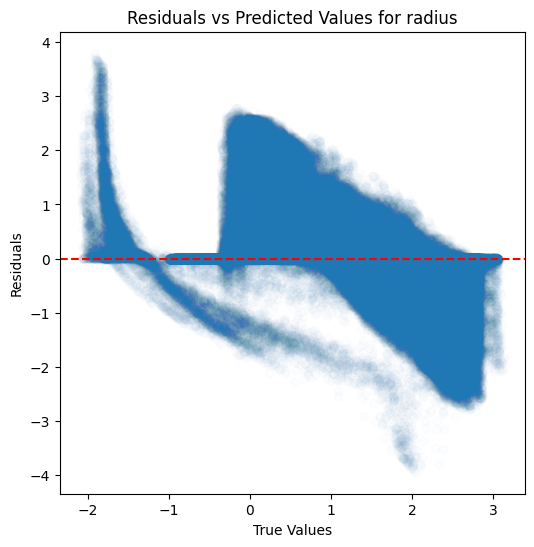

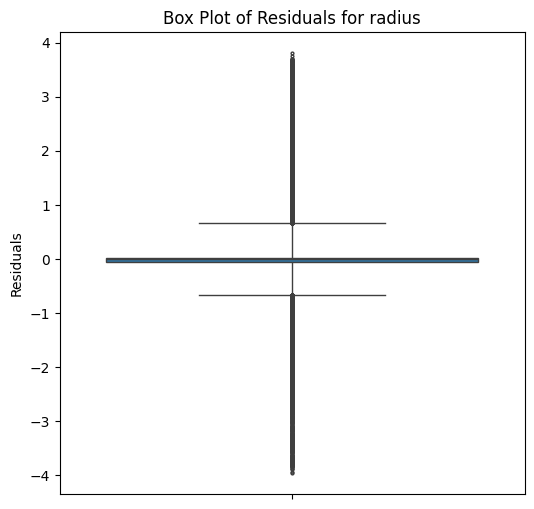

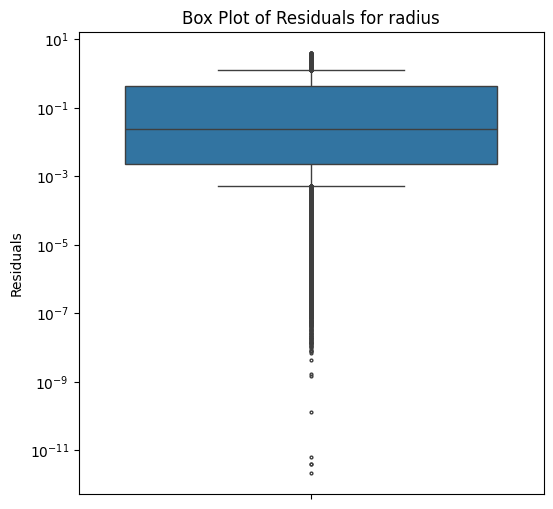

...

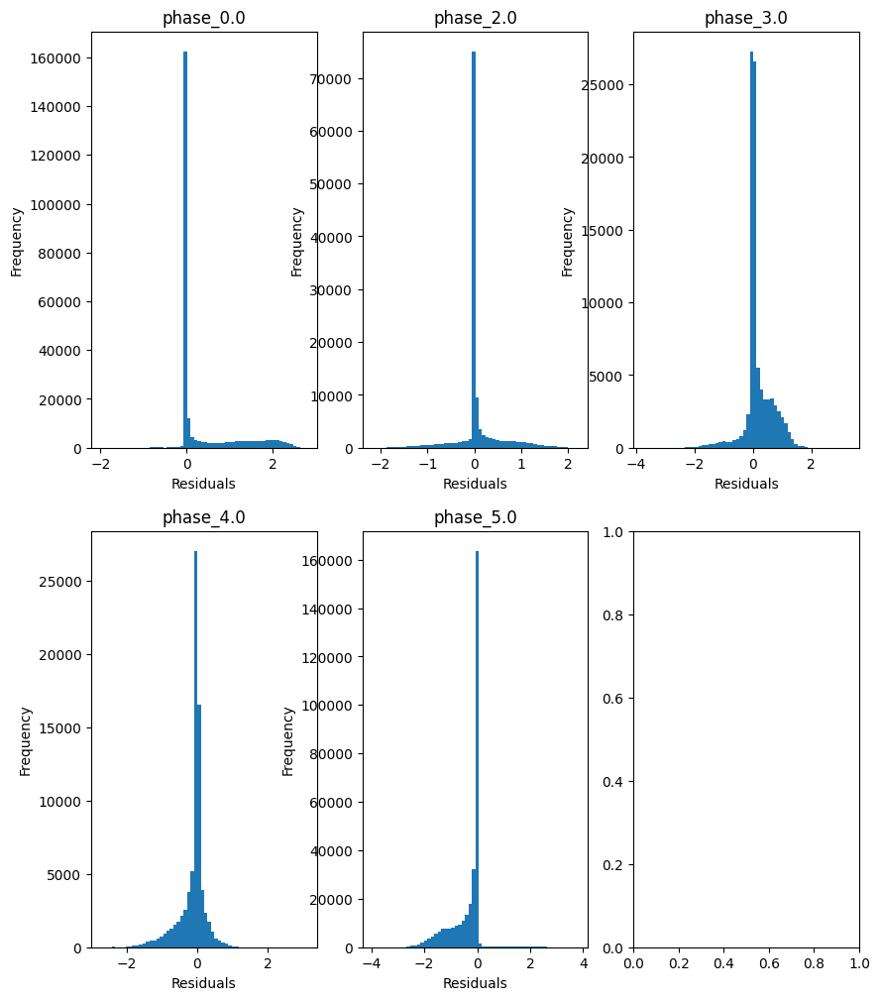

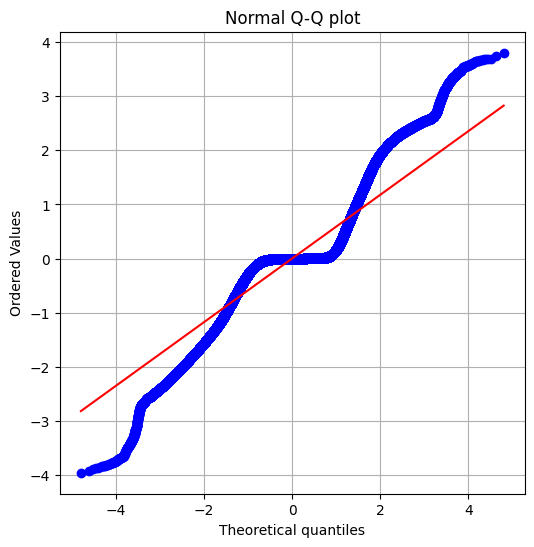

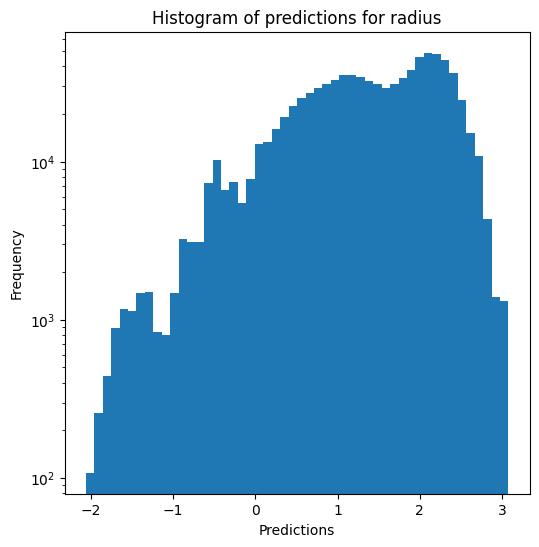

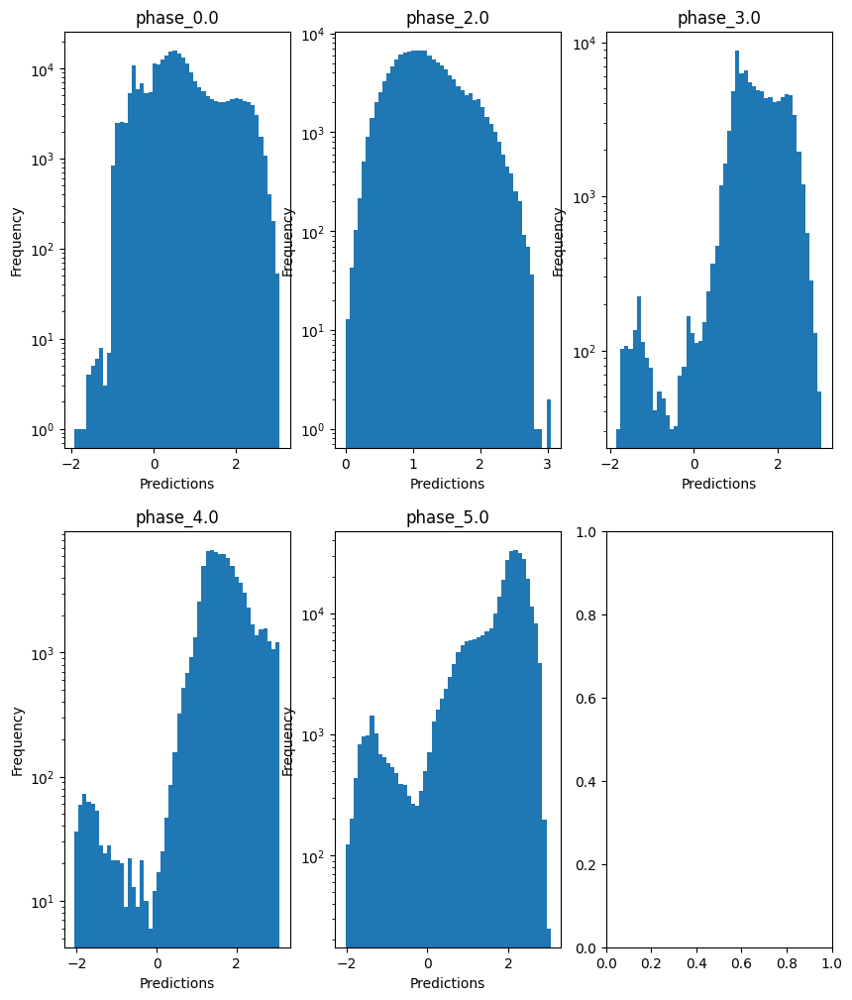

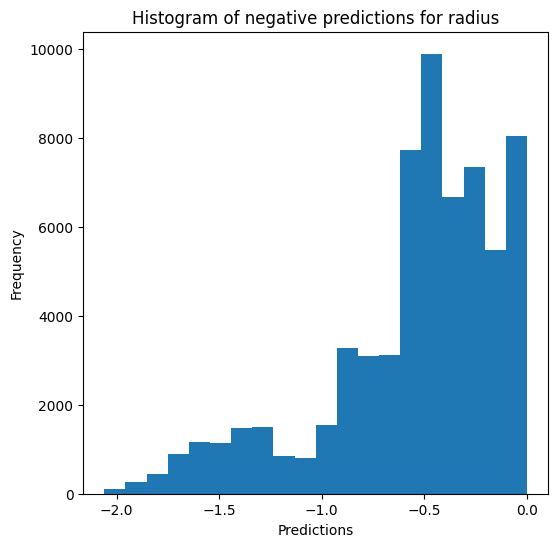

Saving results...


In [ ]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### XGBoost

In [17]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.90340707004253
  RVE :  0.7670265983029168
  RMSE :  0.2012756733167439
  MAE :  0.13627580592750638
  MedAE :  0.06265024180415102
  CORR :  0.8991887868725217
  MAX_ER :  1.2259456754447804
  Percentiles : 
    75th percentile :  0.23870519079833263
    90th percentile :  0.36297148632790643
    95th percentile :  0.4188010371348158
    99th percentile :  0.5367471095277727

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.709363146124065
  RVE :  0.836262734116626
  RMSE :  0.13904678224006434
  MAE :  0.10318418720817918
  MedAE :  0.07006490738749194
  CORR :  0.9155863803816645
  MAX_ER :  0.5765429328414005
  Percentiles : 
    75th percentile :  0.15674158995649834
    90th percentile :  0.24894581318013312
    95th percentile :  0.29461812229480855
    99th percentile 

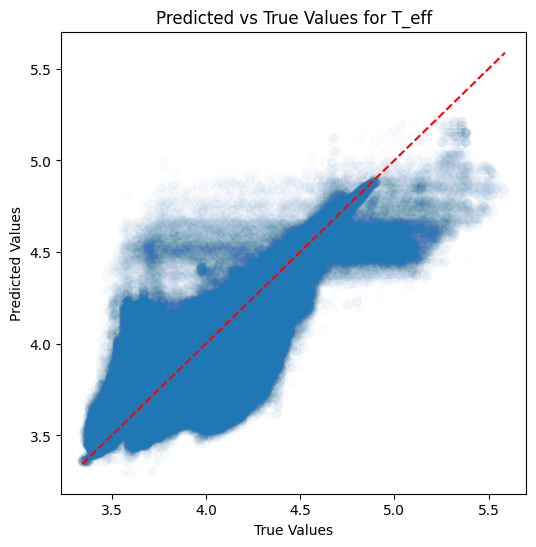

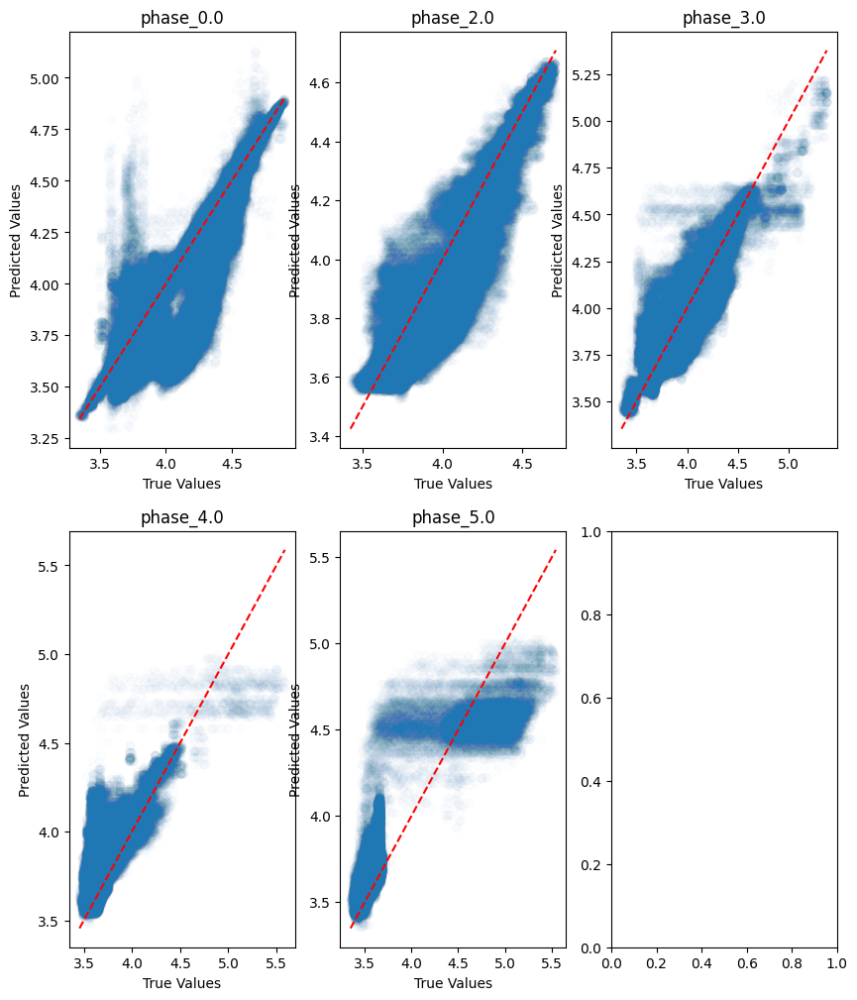

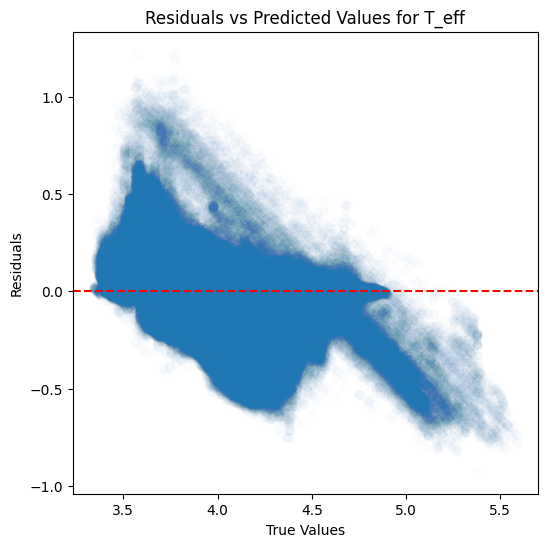

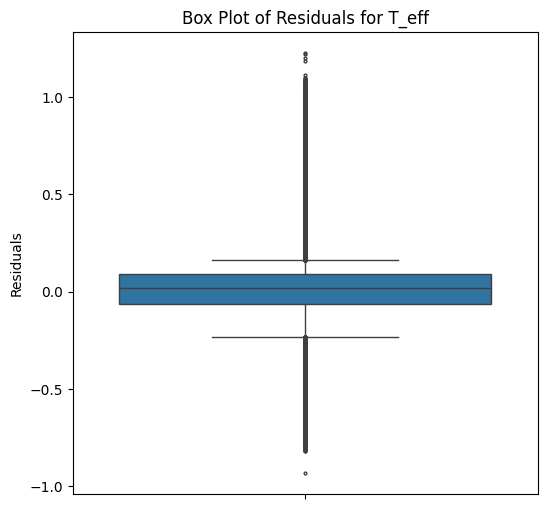

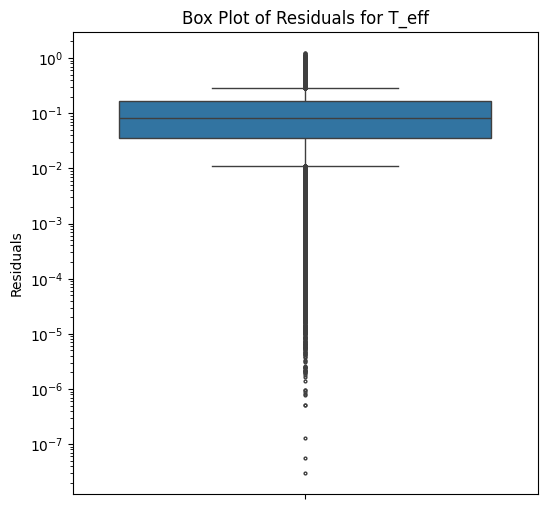

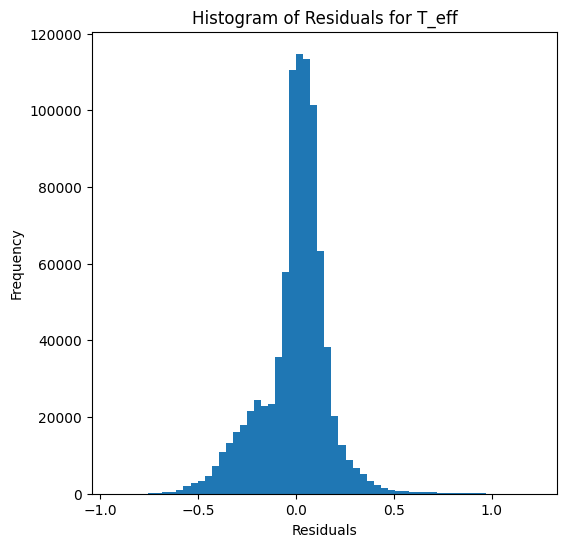

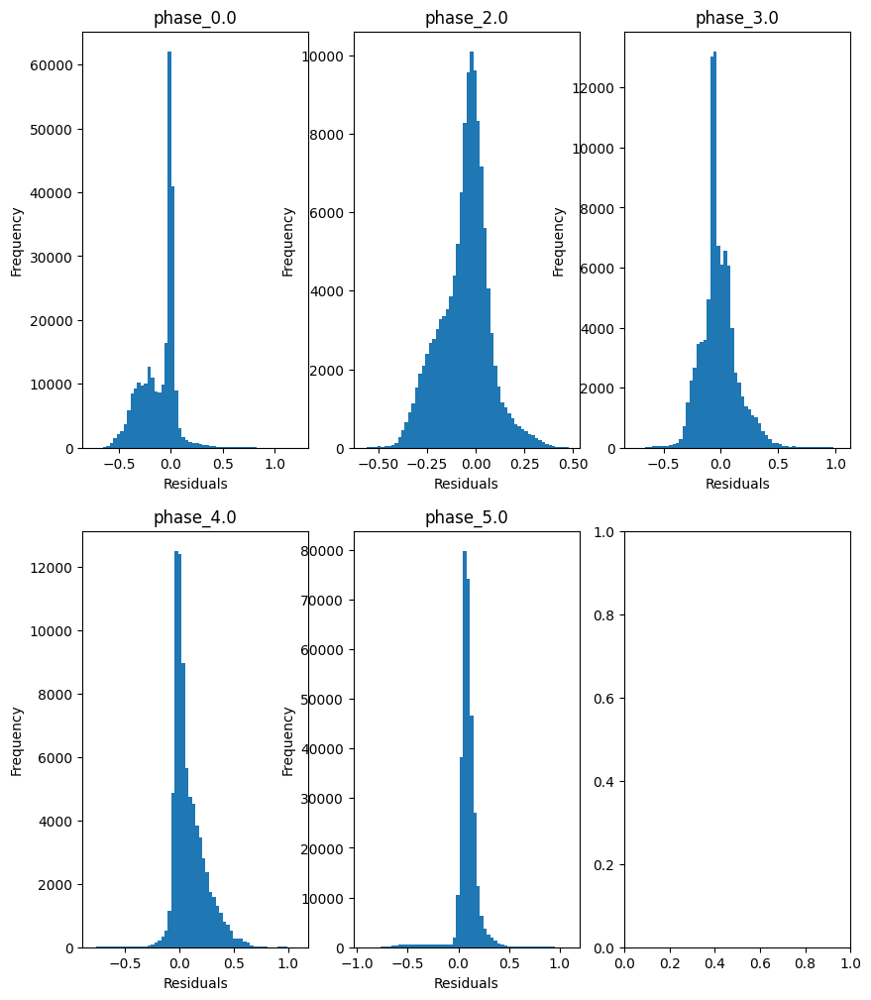

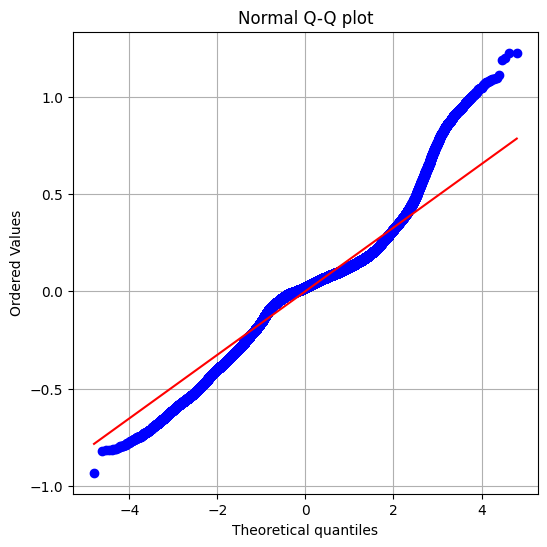

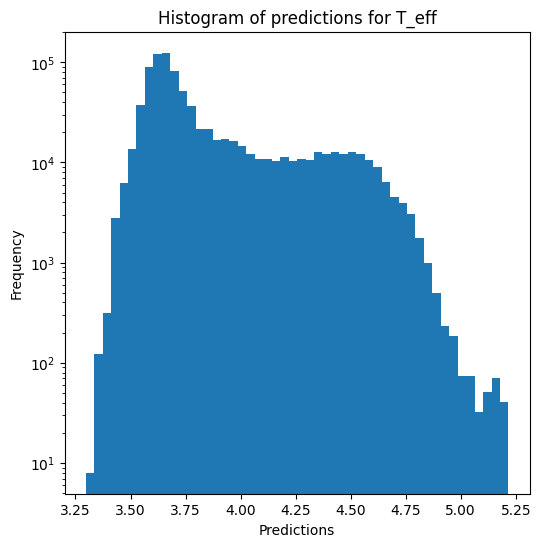

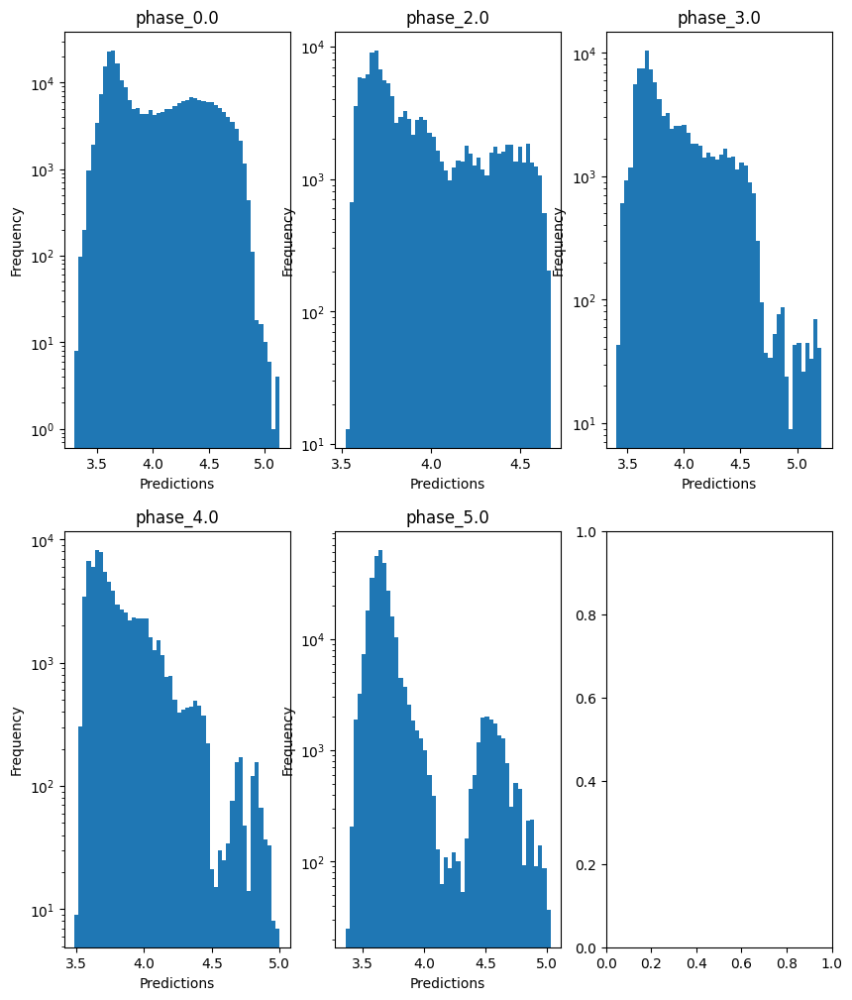


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -3.857642766896456
  RMSE :  1.7139977239407258
  MAE :  1.1041899696778785
  MedAE :  0.30024946377705986
  CORR :  0.4406456593117135
  MAX_ER :  5.289956680068717
  Percentiles : 
    75th percentile :  2.1491735307111943
    90th percentile :  3.2405585400774854
    95th percentile :  3.6975218794935123
    99th percentile :  4.211961052321322

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.08214727823711743
  RMSE :  1.024322741107777
  MAE :  0.8104541492267957
  MedAE :  0.682021331251331
  CORR :  0.44277040876644363
  MAX_ER :  3.3411709027907133
  Percentiles : 
    75th percentile :  1.2567898702677023
    90th percentile :  1.7166291678280614
    95th percentile :  1.989874372258208
    99th percentile :  2.4225004201483333

log_g results for the phase category with a value 

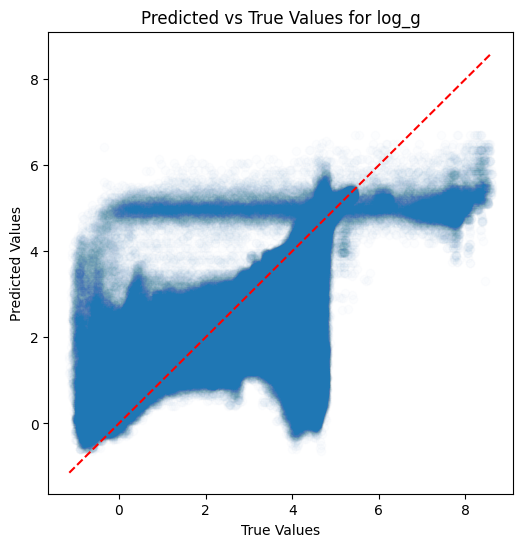

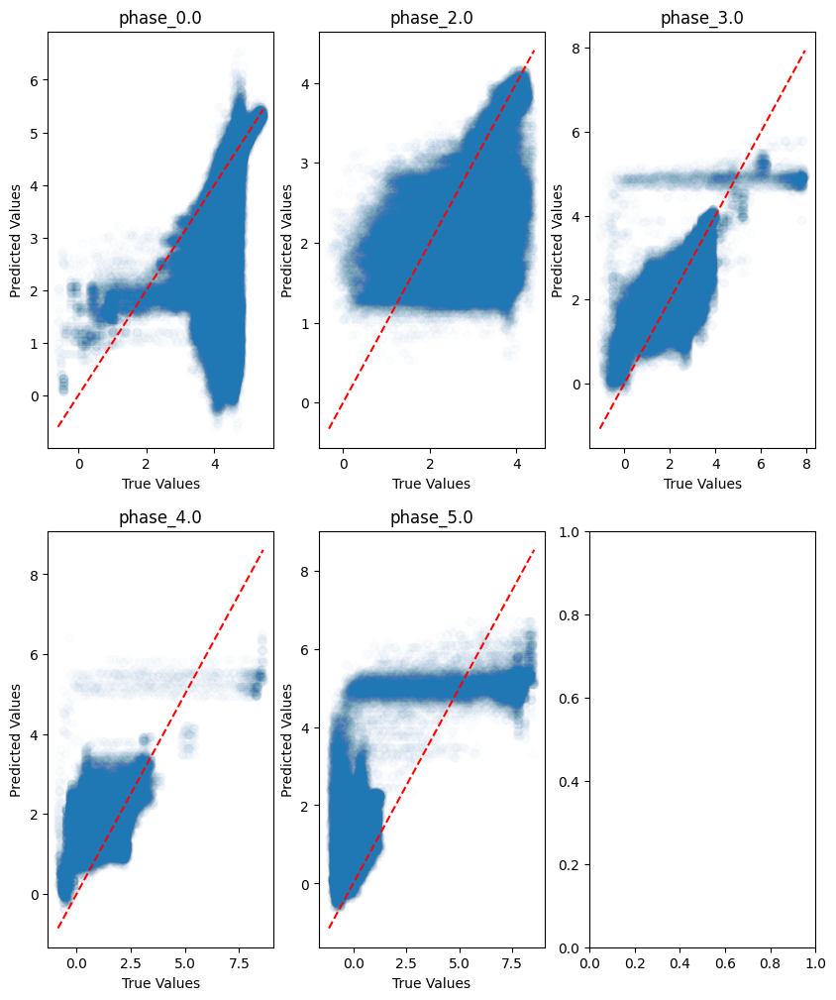

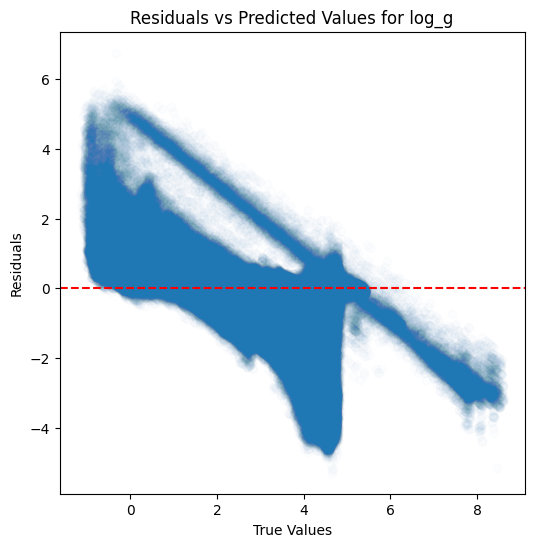

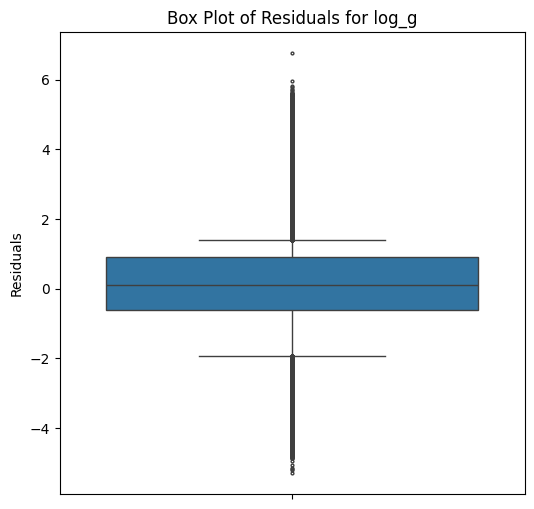

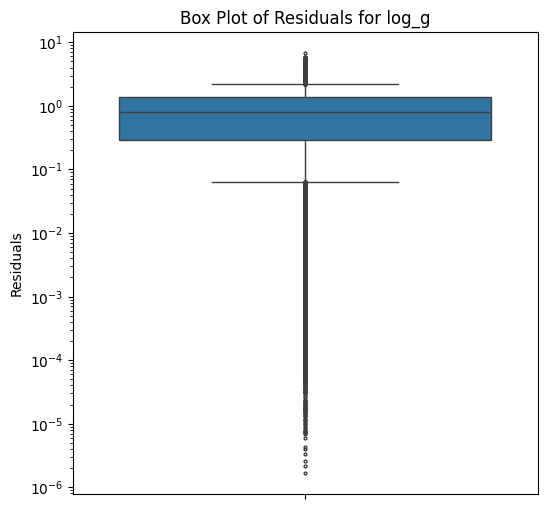

...

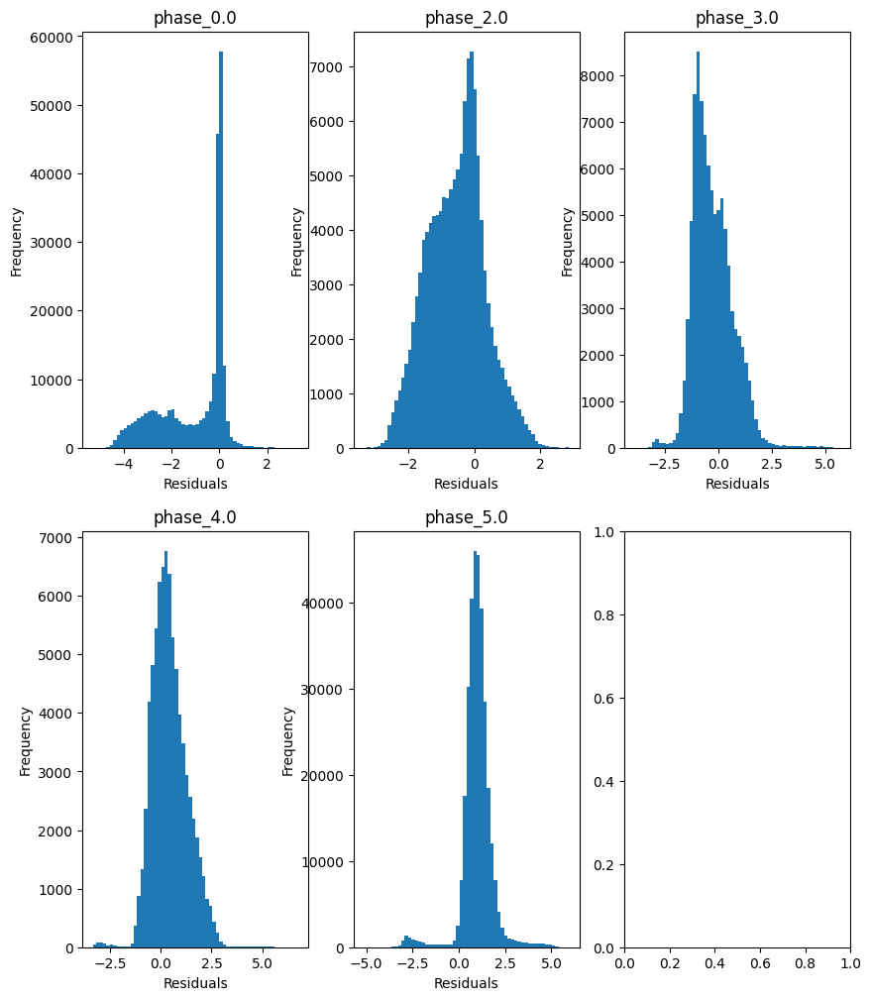

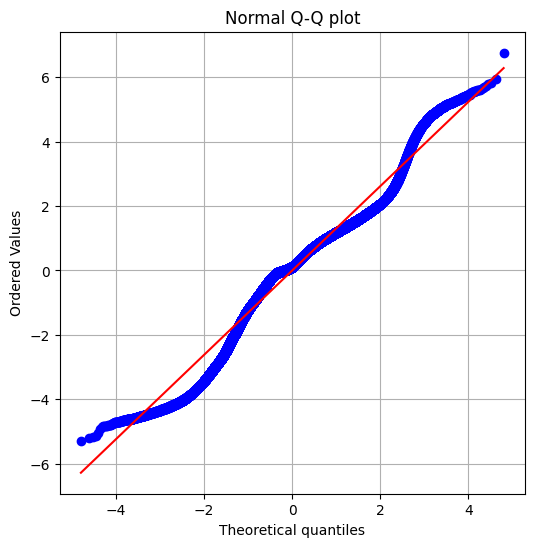

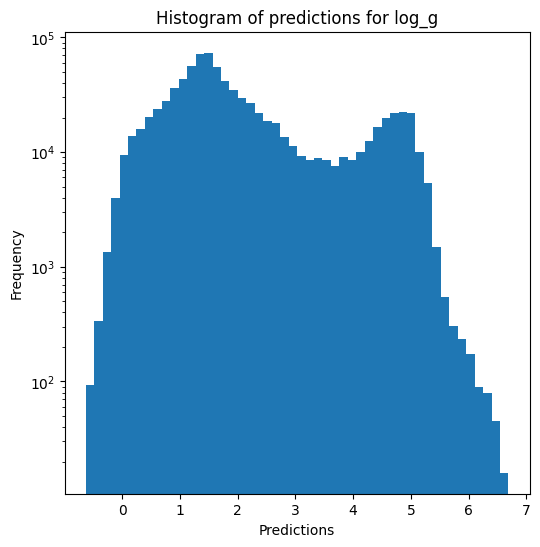

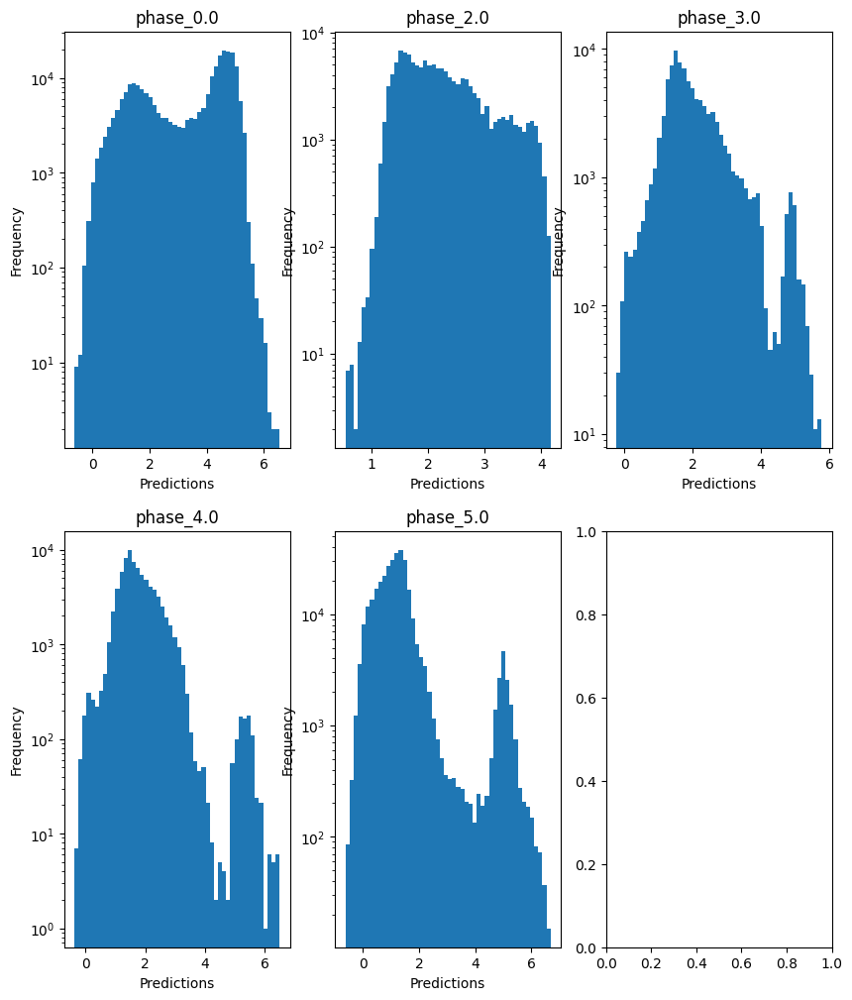

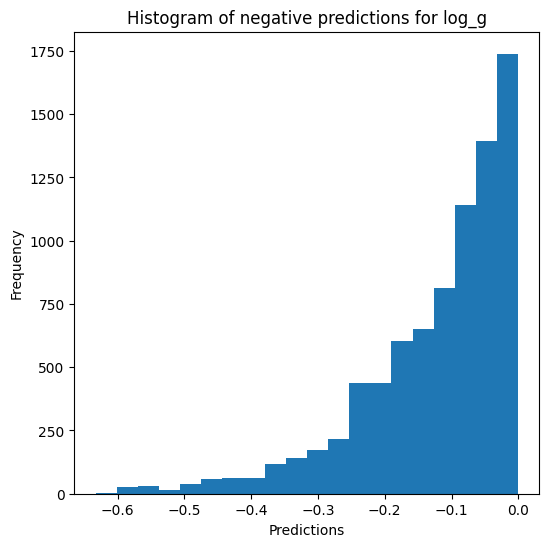


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.46070234389949305
  RMSE :  0.8585081889626063
  MAE :  0.5545240171655041
  MedAE :  0.14780692483289995
  CORR :  0.5836606424077874
  MAX_ER :  2.5337638831814506
  Percentiles : 
    75th percentile :  1.0793099574851783
    90th percentile :  1.6206932968938264
    95th percentile :  1.850595912720584
    99th percentile :  2.1091751633311966

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.20478565125883008
  RMSE :  0.5145556754871938
  MAE :  0.407412820279634
  MedAE :  0.3433402358515283
  CORR :  0.4872661247082292
  MAX_ER :  1.7476819950462403
  Percentiles : 
    75th percentile :  0.631681766666854
    90th percentile :  0.8630674705996988
    95th percentile :  0.9975807218910606
    99th percentile :  1.2136776153902635

radius results for the phase category with a v

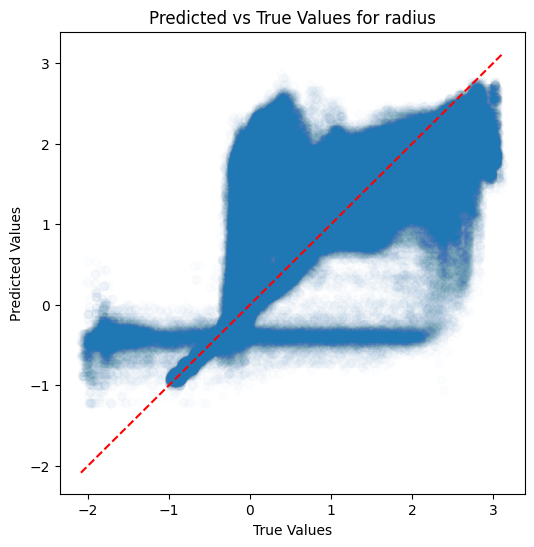

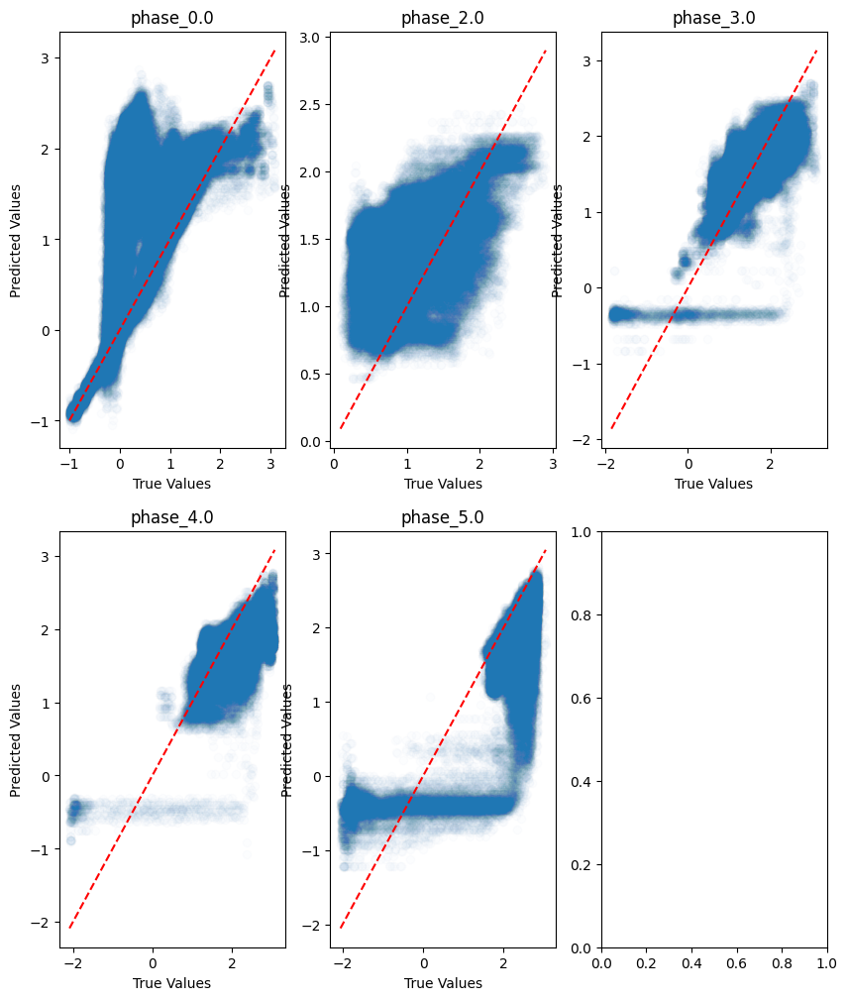

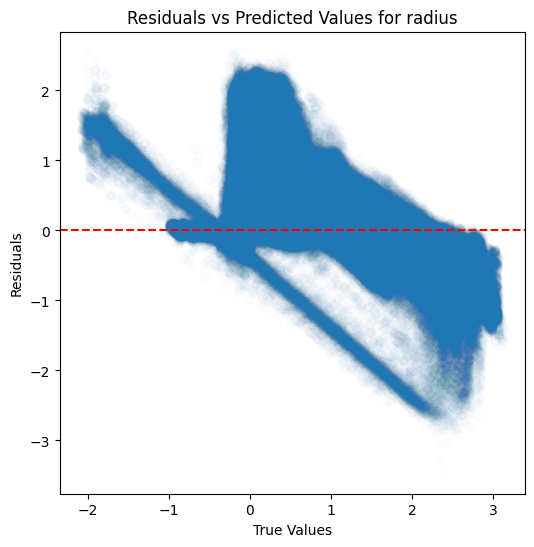

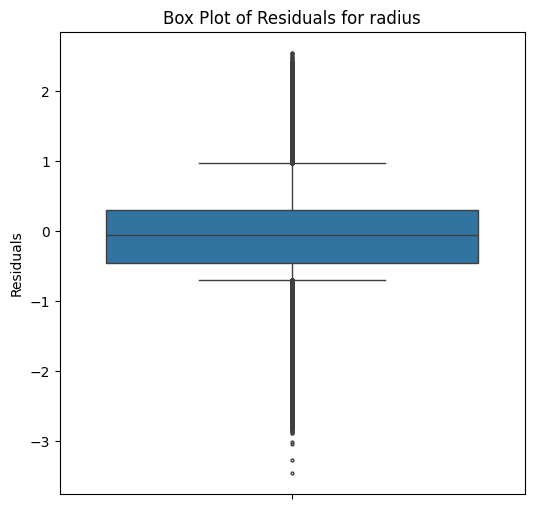

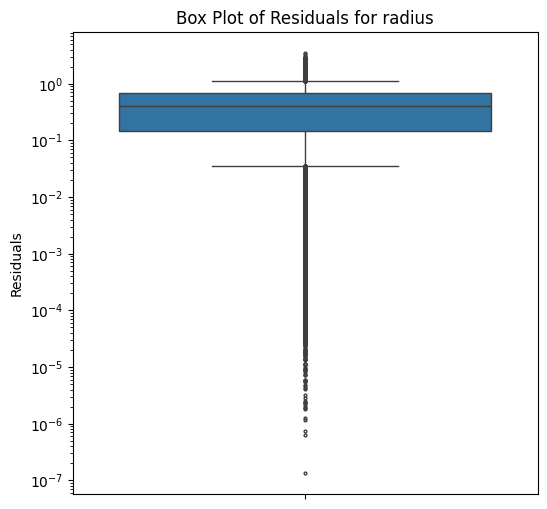

...

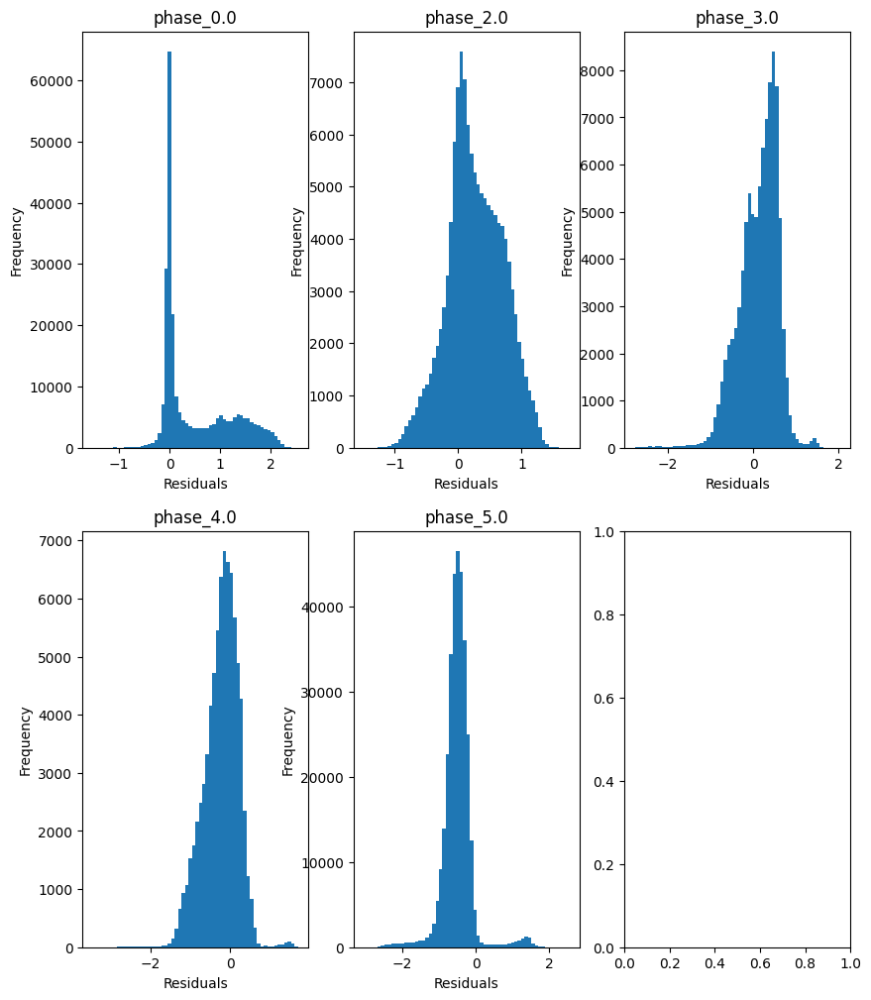

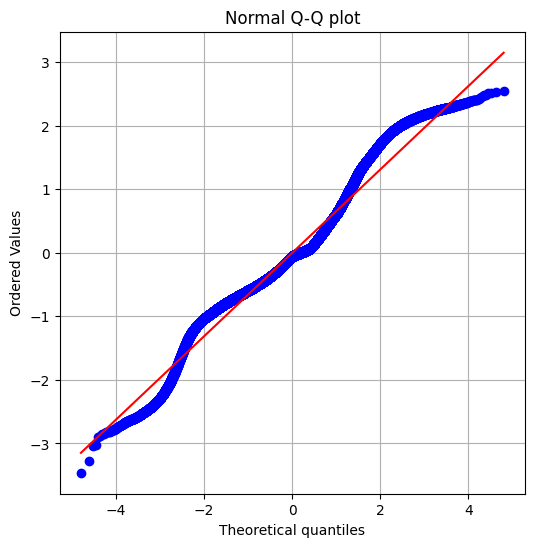

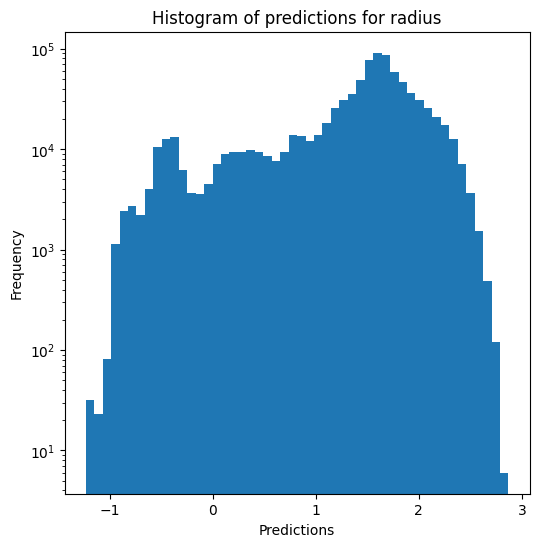

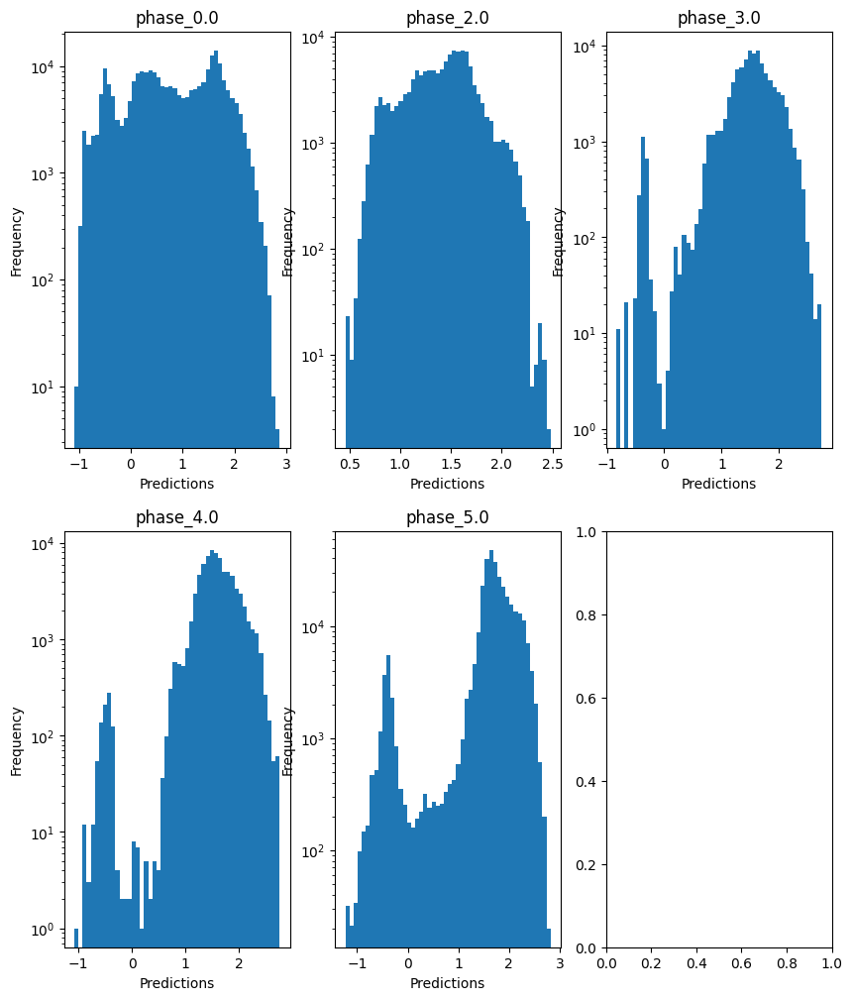

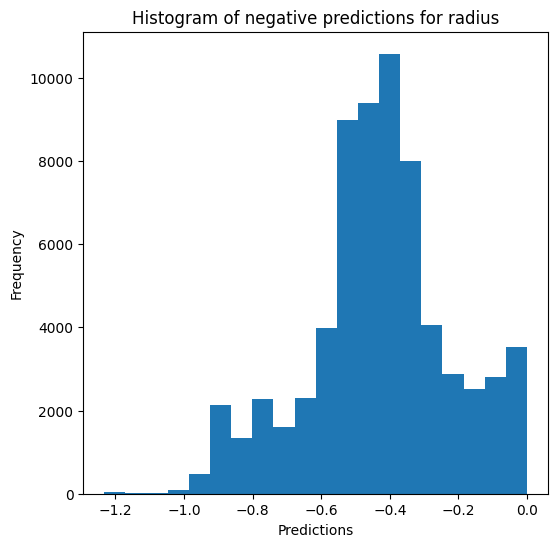

Saving results...


In [ ]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### Multi-layer perceptron

In [19]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.90340707004253
  RVE :  0.7051547700108463
  RMSE :  0.2279974358117591
  MAE :  0.1667411271072328
  MedAE :  0.11288135709514457
  CORR :  0.8694905566982645
  MAX_ER :  1.215883440882013
  Percentiles : 
    75th percentile :  0.2675485495805505
    90th percentile :  0.3896244560843213
    95th percentile :  0.4724117176623169
    99th percentile :  0.6008440687273017

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.709363146124065
  RVE :  0.8044384285754316
  RMSE :  0.15402816969189836
  MAE :  0.11921672942305173
  MedAE :  0.0933190622189104
  CORR :  0.8970731791688995
  MAX_ER :  0.6389119923121913
  Percentiles : 
    75th percentile :  0.1783589491194072
    90th percentile :  0.2630824597533113
    95th percentile :  0.30927002643996926
    99th percentile :  0.3

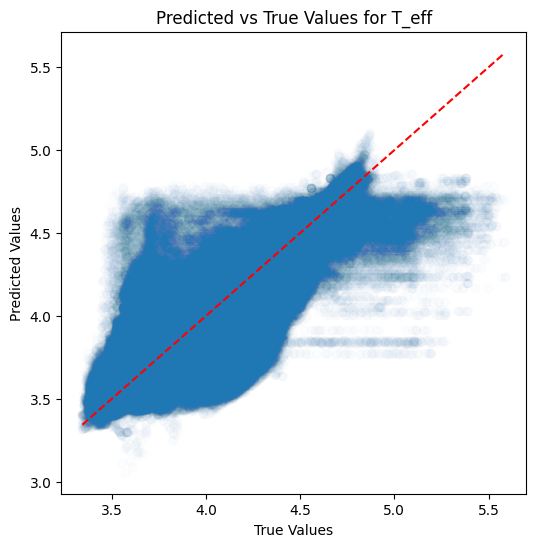

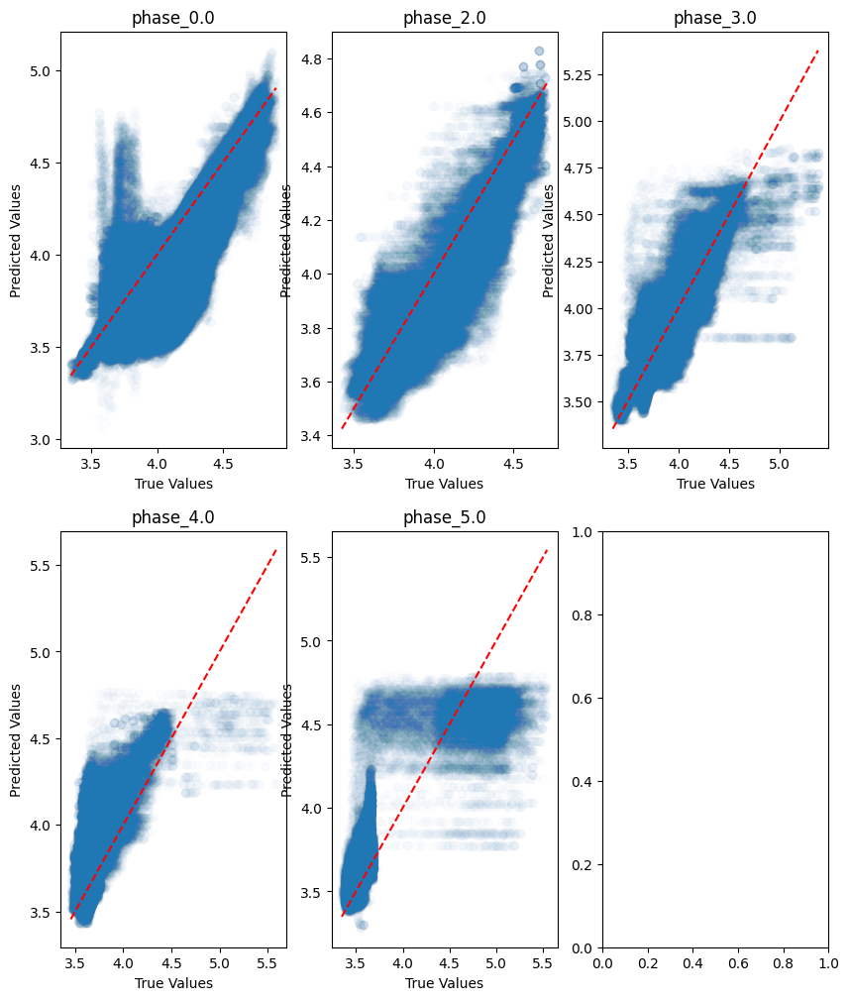

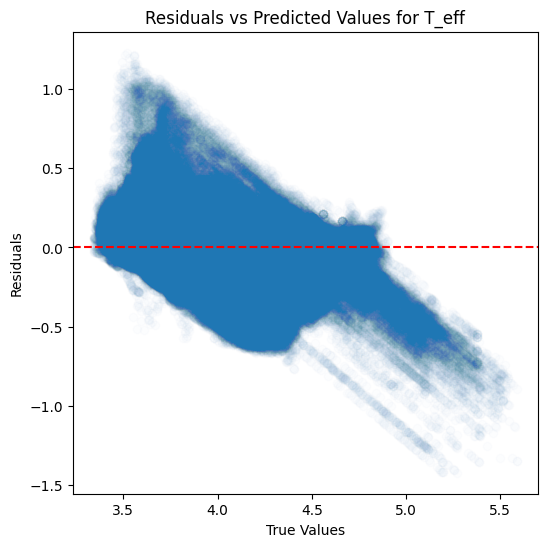

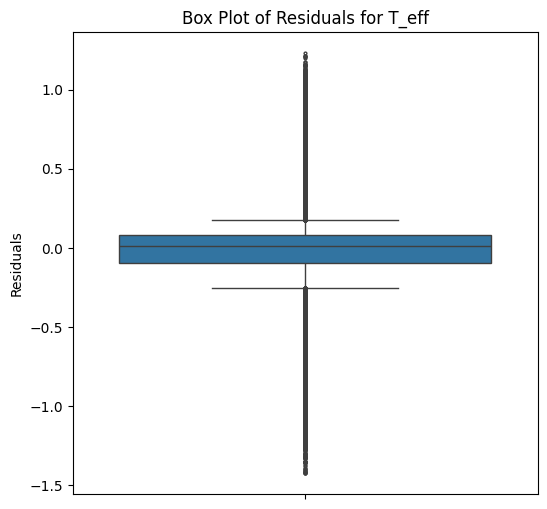

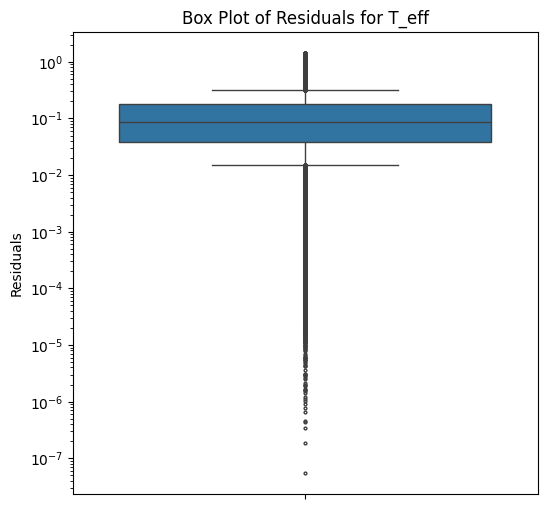

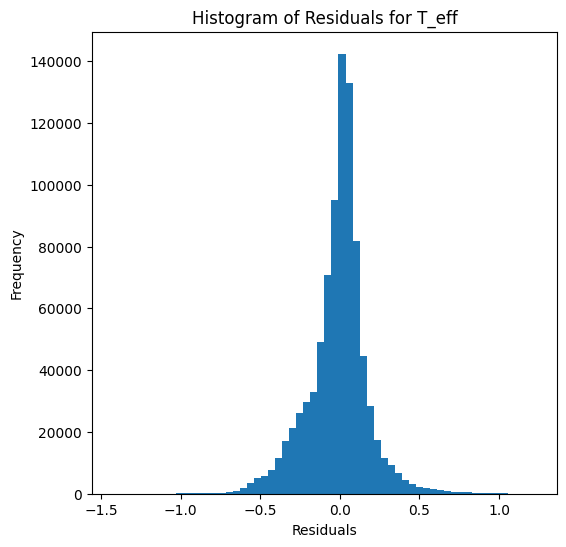

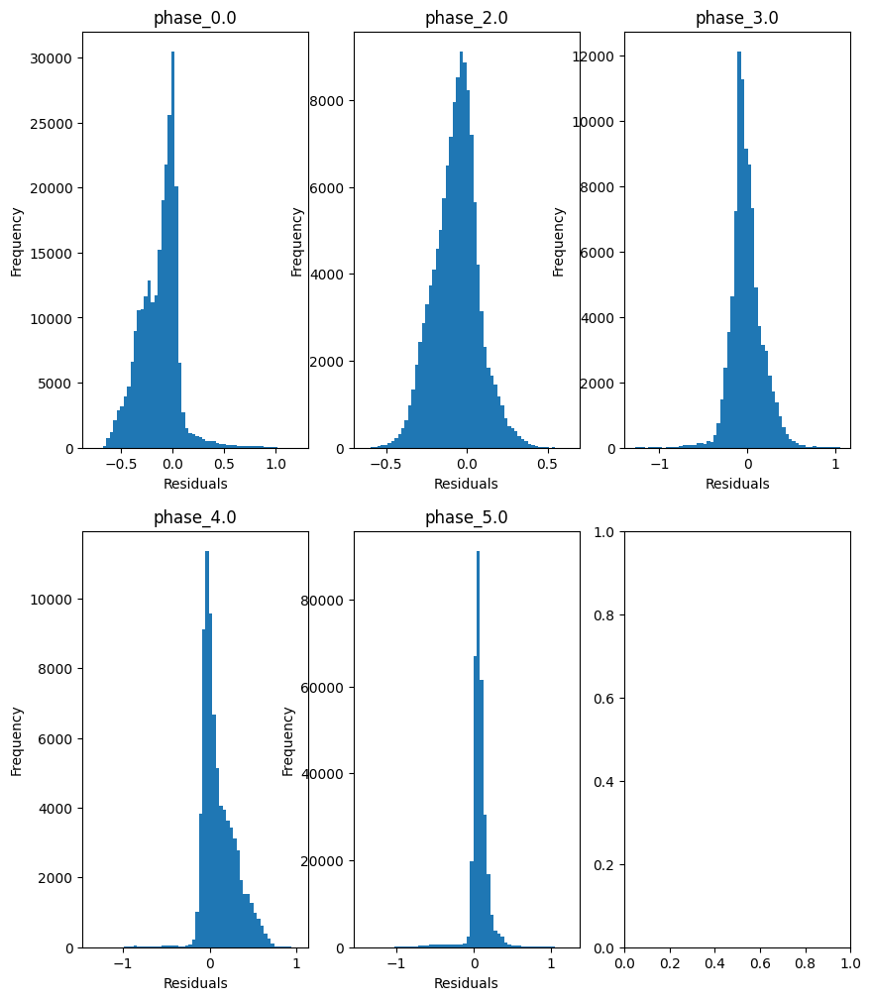

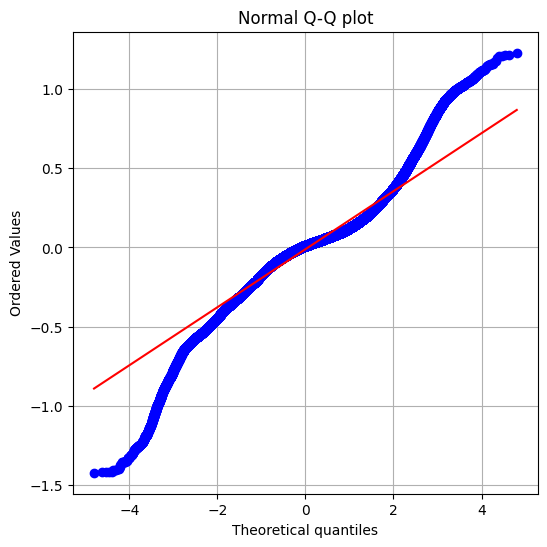

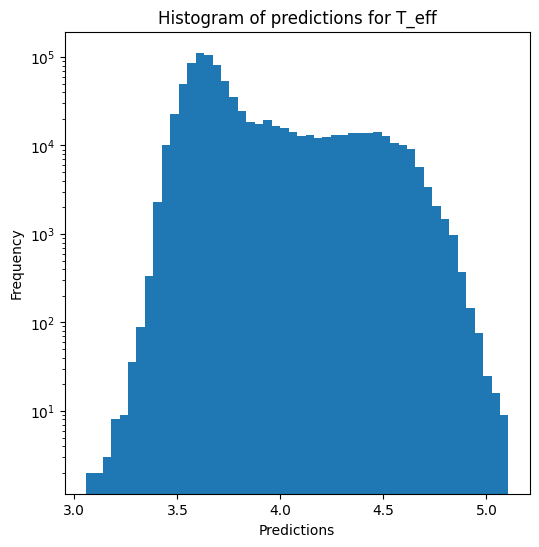

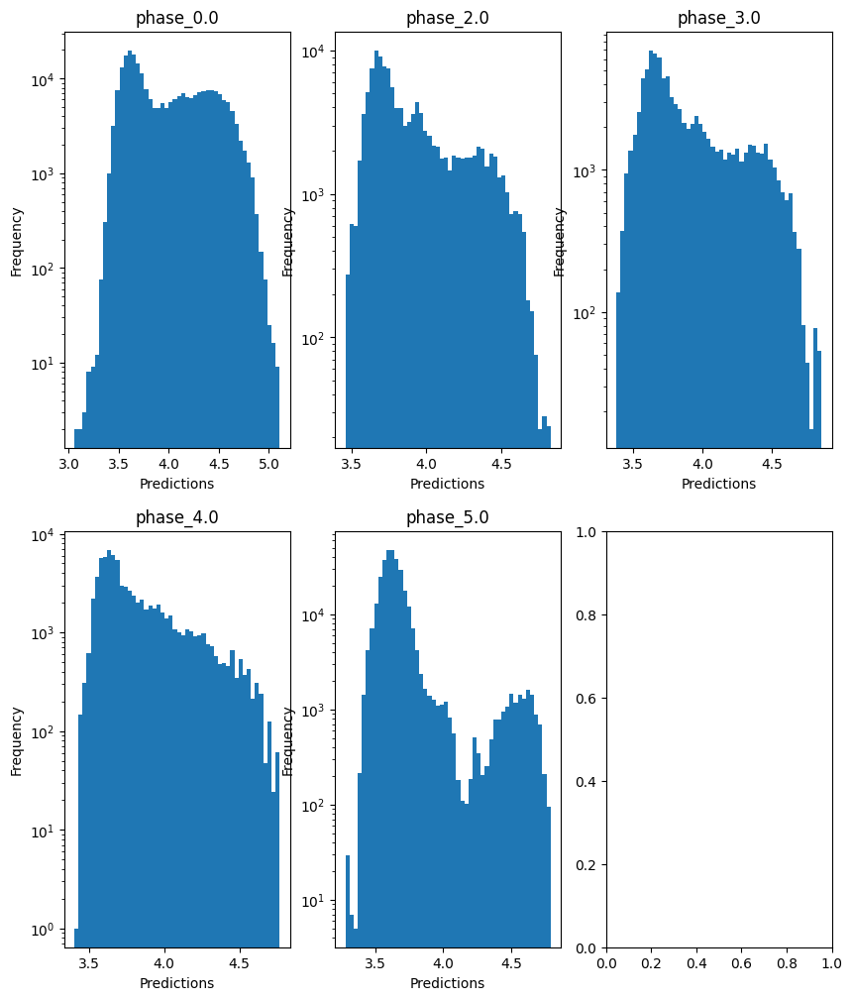


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -3.9863014062494484
  RMSE :  1.7697859617374874
  MAE :  1.14957696648041
  MedAE :  0.3179924077617704
  CORR :  0.412969798230707
  MAX_ER :  5.237300722725769
  Percentiles : 
    75th percentile :  2.082264149795137
    90th percentile :  3.4318905829189648
    95th percentile :  3.8526938730995632
    99th percentile :  4.287439641257345

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.0931563192690611
  RMSE :  0.9979747650645994
  MAE :  0.7948924199161955
  MedAE :  0.6657165773727122
  CORR :  0.43597468686436824
  MAX_ER :  3.6474666596267453
  Percentiles : 
    75th percentile :  1.161127639257113
    90th percentile :  1.6730024678431614
    95th percentile :  2.0028490996017148
    99th percentile :  2.468815915005461

log_g results for the phase category with a value of 3

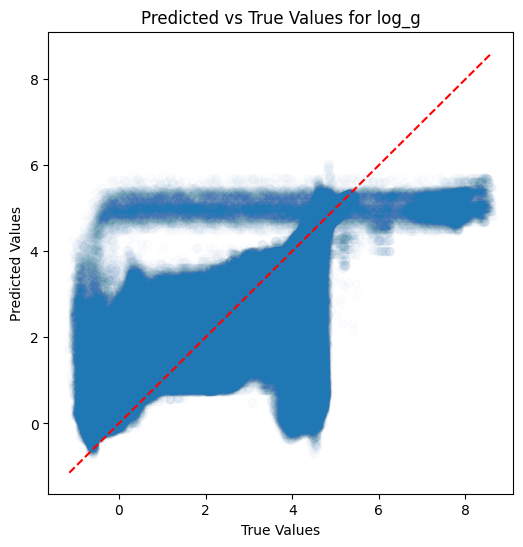

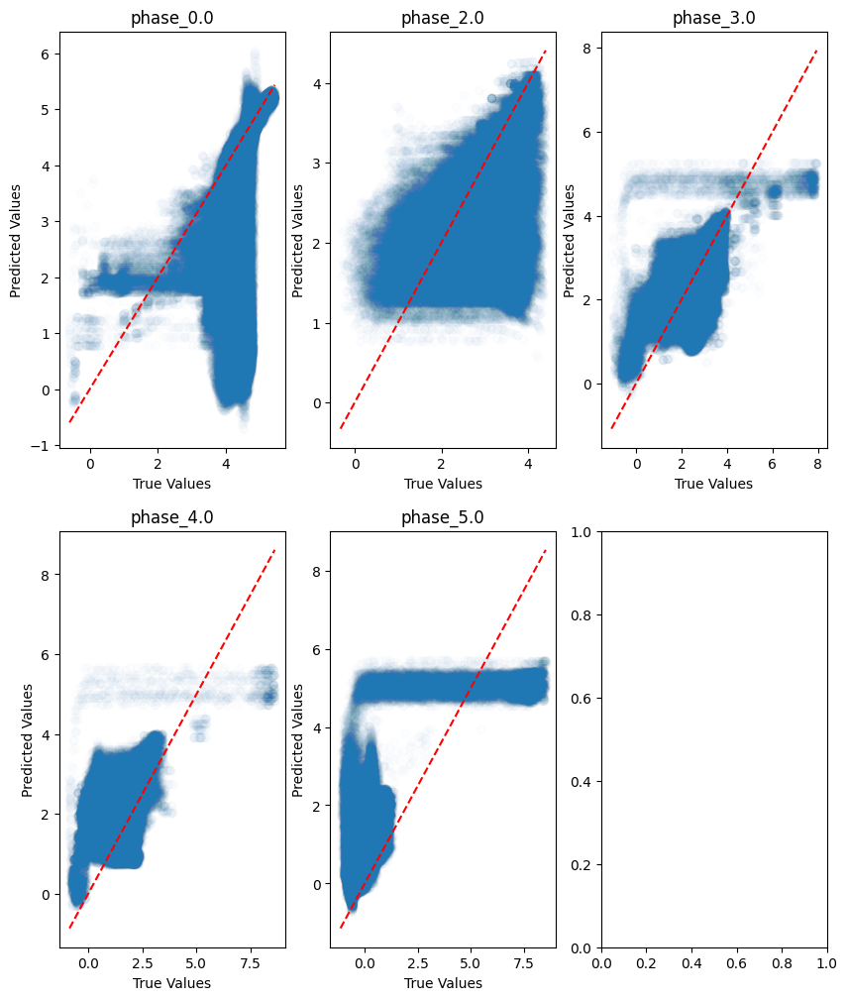

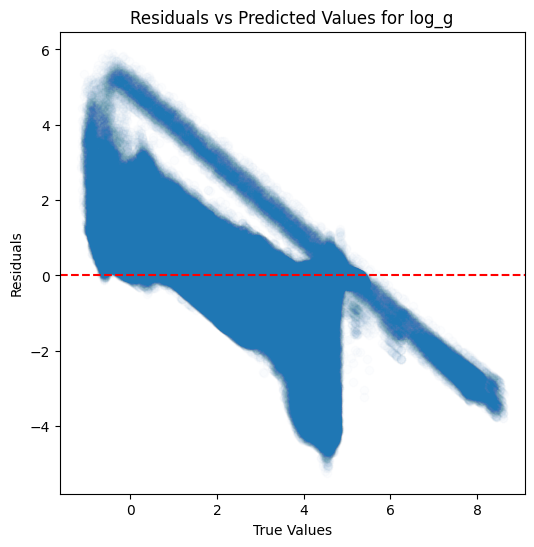

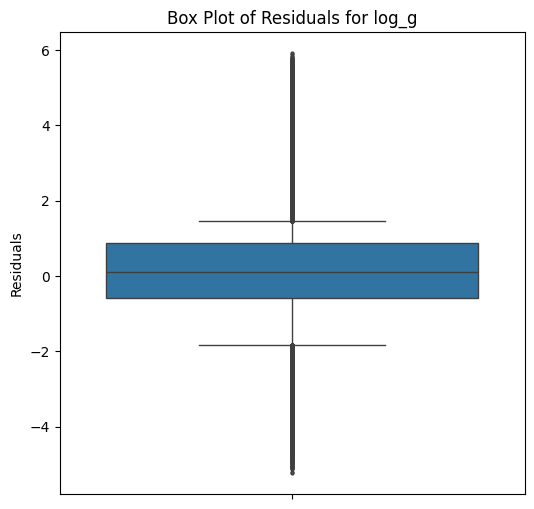

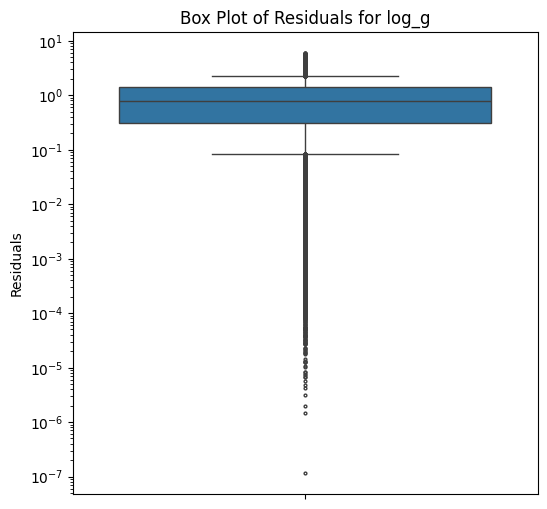

...

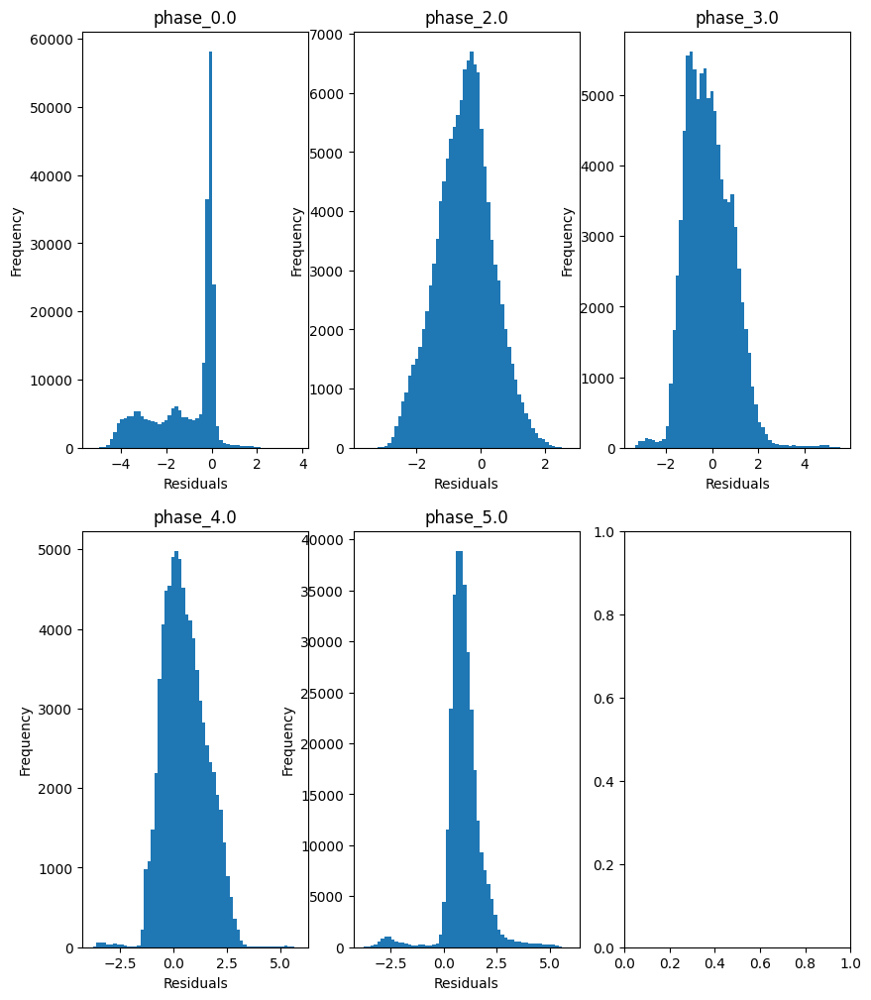

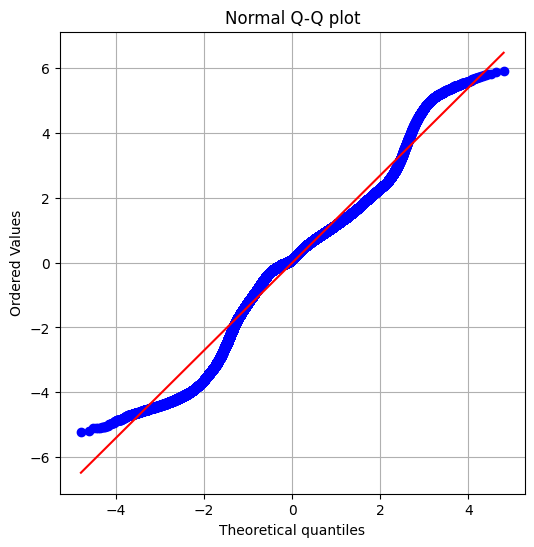

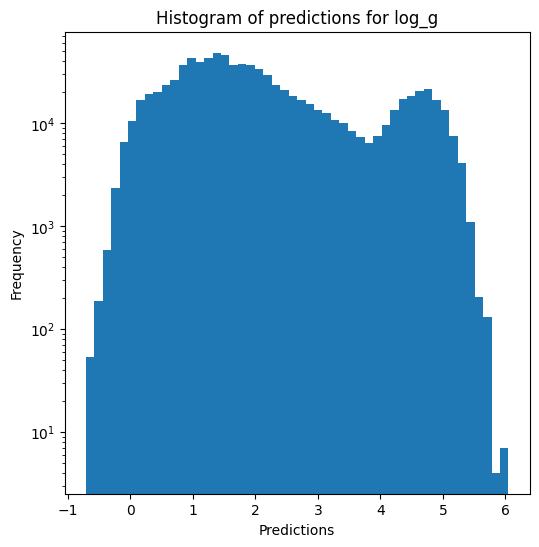

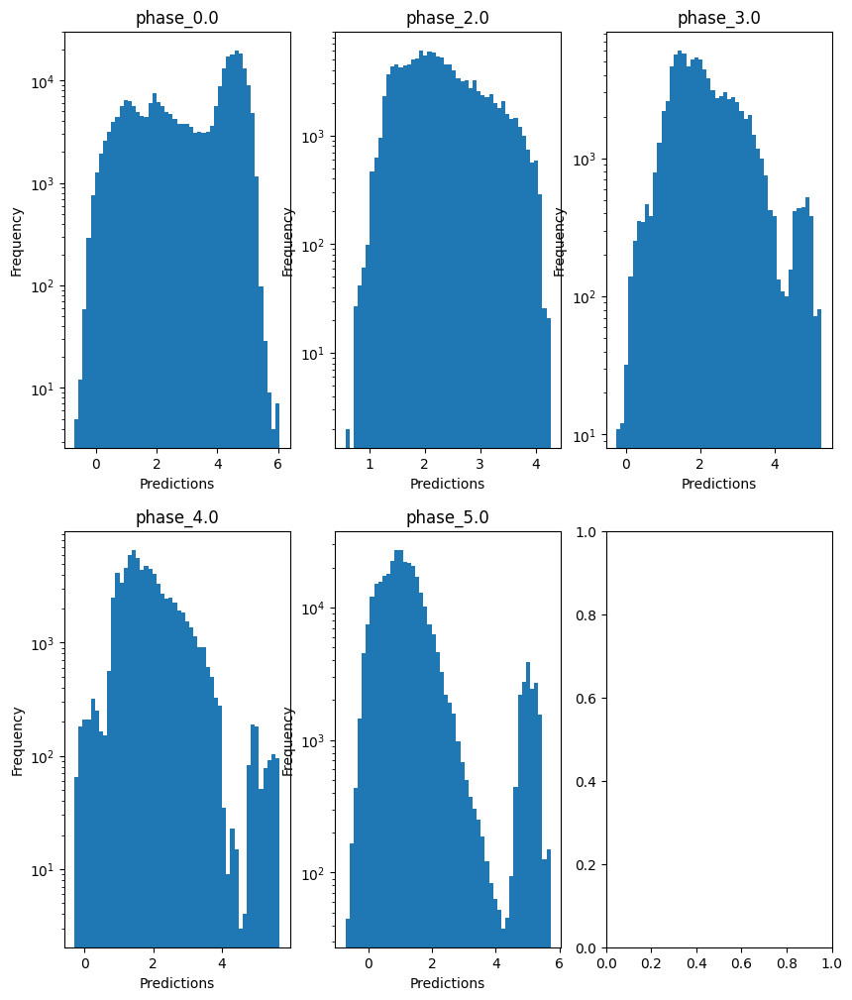

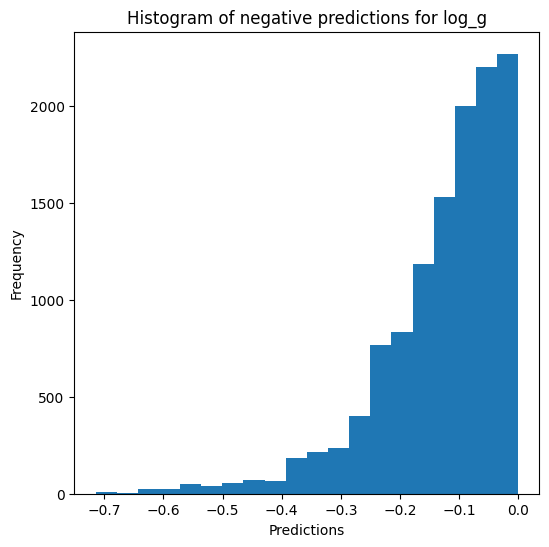


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.4872472096017477
  RMSE :  0.8804441958667738
  MAE :  0.5722817335096254
  MedAE :  0.15522156978766993
  CORR :  0.5695566014832574
  MAX_ER :  2.6412828574399123
  Percentiles : 
    75th percentile :  1.031447721676297
    90th percentile :  1.7089730782556016
    95th percentile :  1.9231689667525182
    99th percentile :  2.133526853663933

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.21462383758221437
  RMSE :  0.4945509637458747
  MAE :  0.3938303970747613
  MedAE :  0.3289320107205735
  CORR :  0.48676878981221106
  MAX_ER :  1.8036372190926186
  Percentiles : 
    75th percentile :  0.5749878936822902
    90th percentile :  0.8297839124482866
    95th percentile :  0.9926825758411019
    99th percentile :  1.2231754030046451

radius results for the phase category with a 

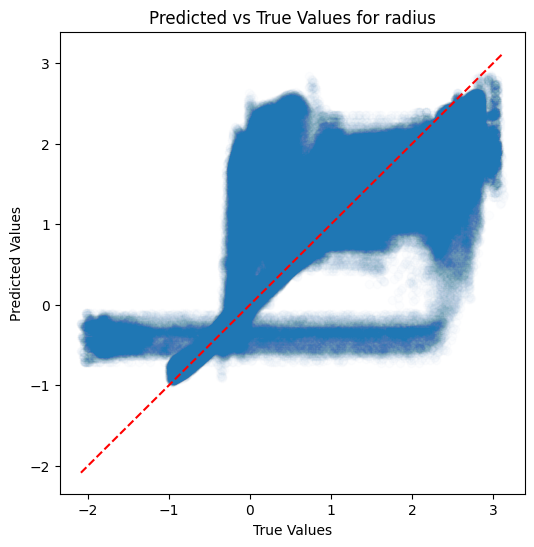

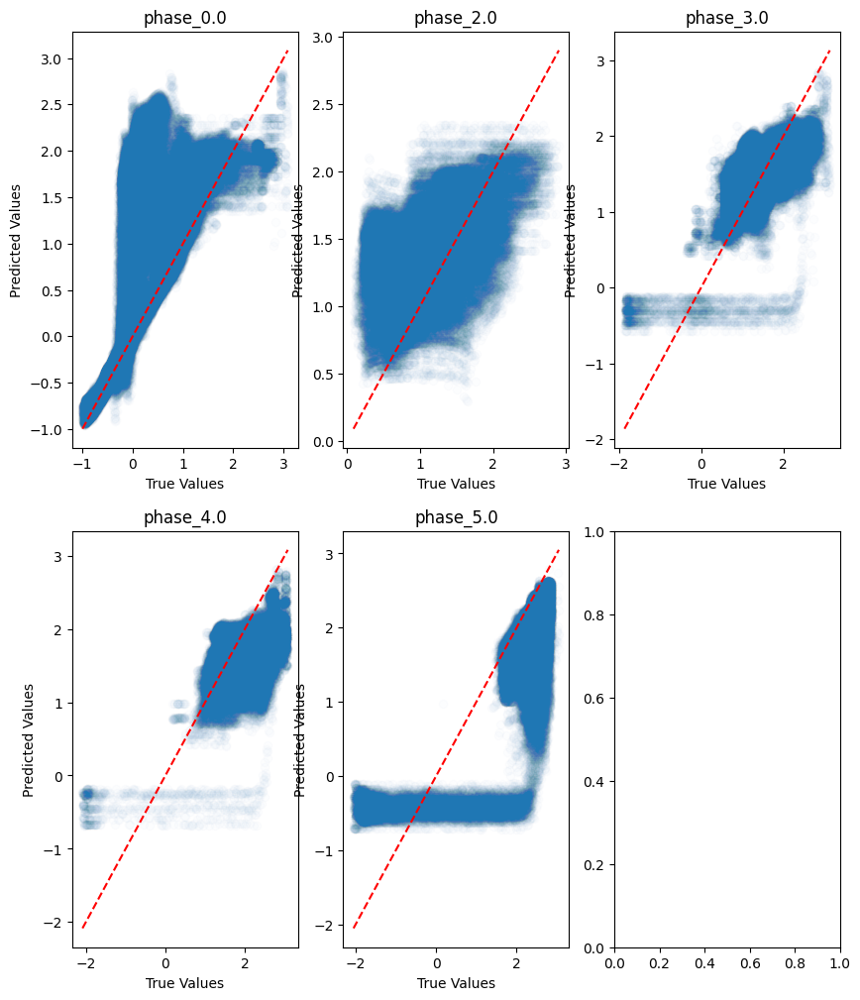

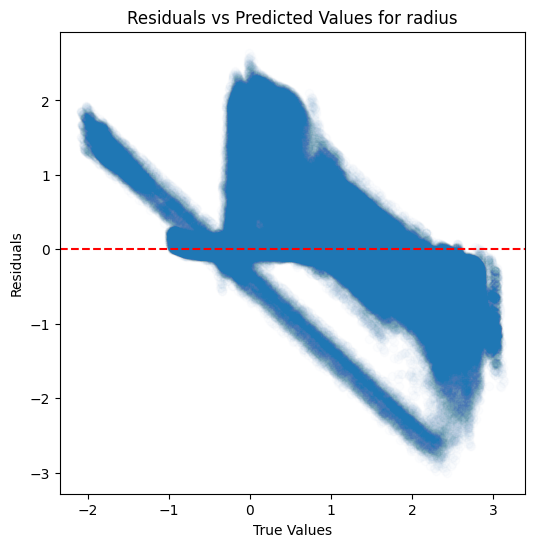

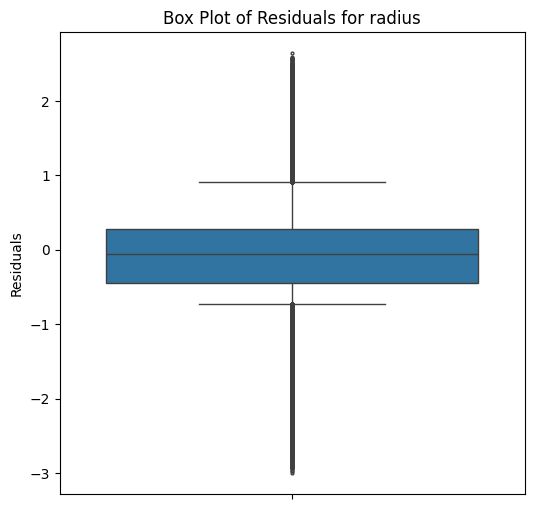

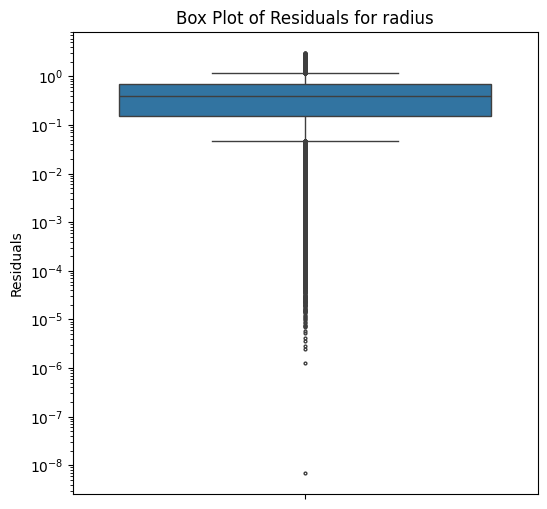

...

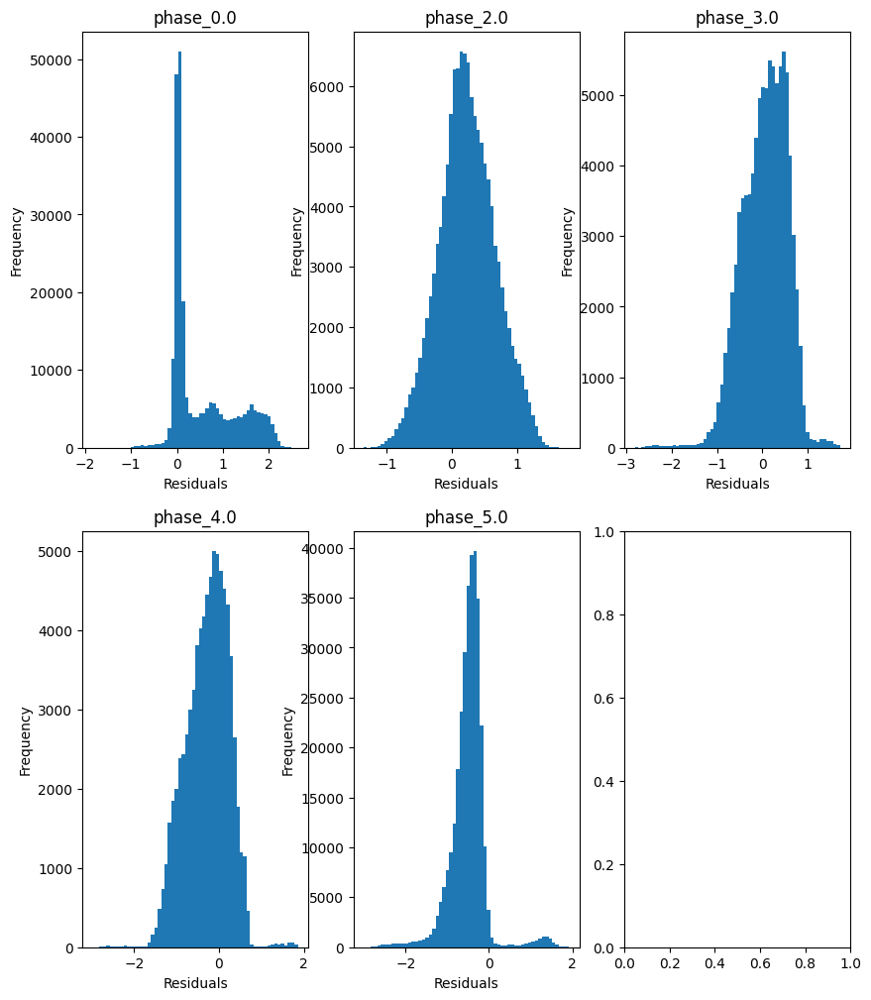

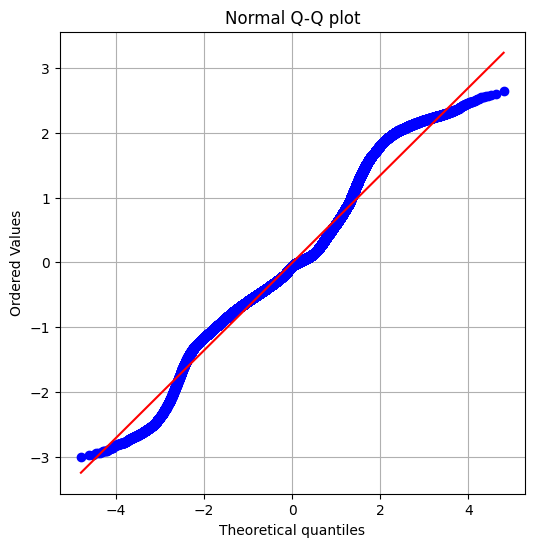

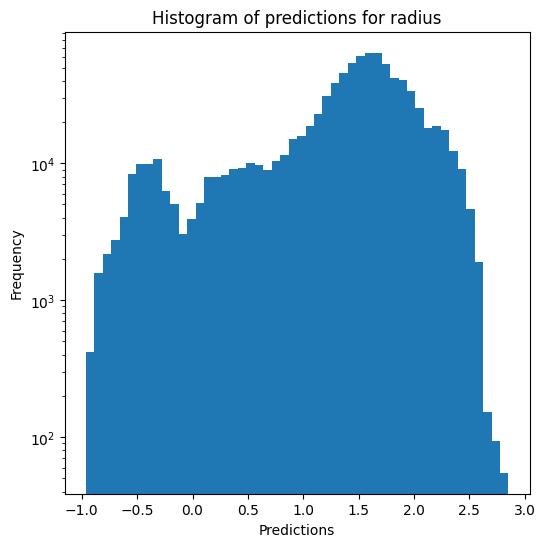

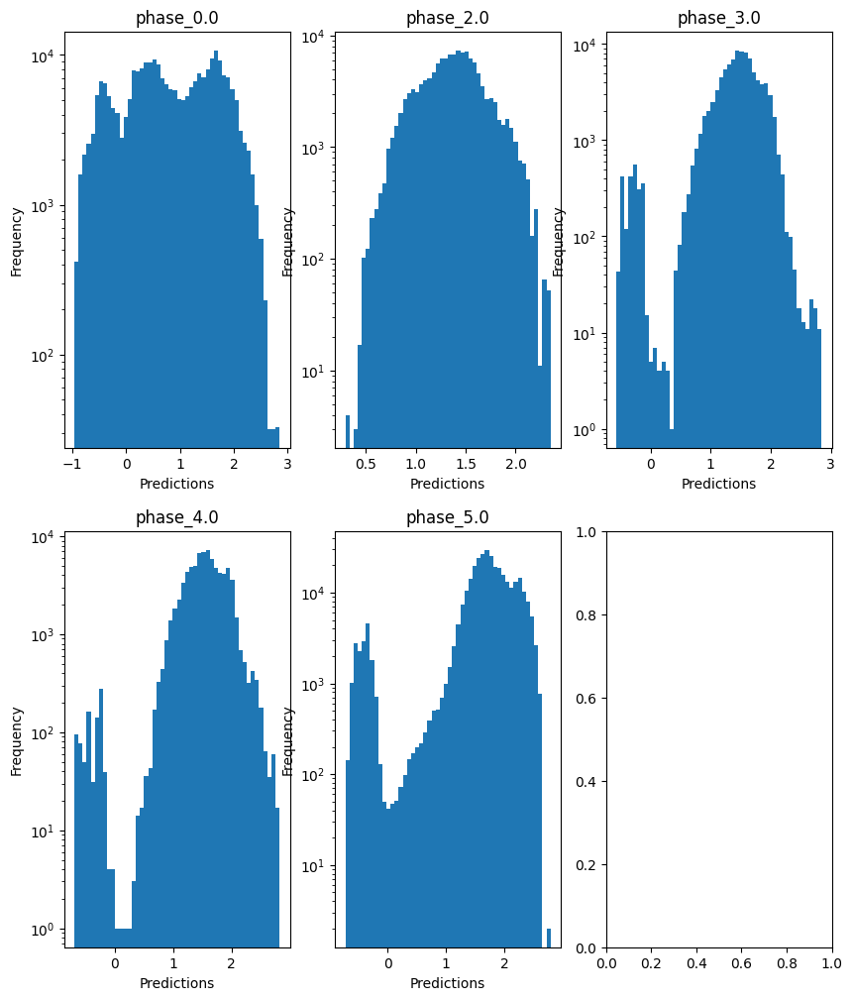

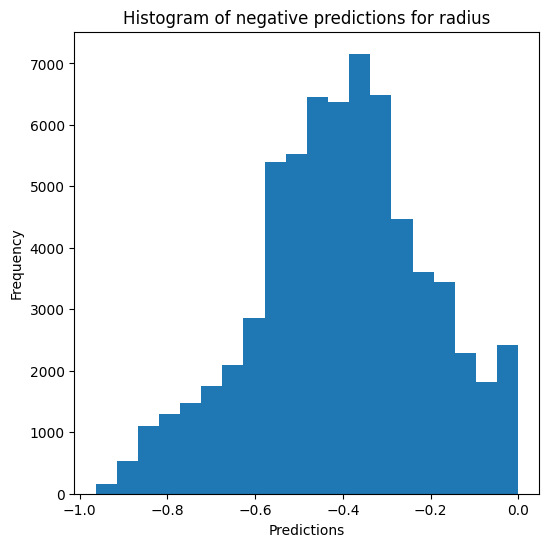

Saving results...


In [ ]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon